In [1]:
from gurobipy import *

from gurobipy import tupledict

import numpy as np
import pandas as pd
import scipy
import timeit
import time
import random
import math
import pdb

from pandas import ExcelWriter

from IPython import display

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def intersection(lst1, lst2):
    return [value for value in lst1 if value in lst2]

In [5]:
def Simulate_biD_static(low_Td=2, max_Td=10, eta_v =0.9, eta_DC_v = 0.9, p=1, Trans_P = 100, low_dl =0.75, high_dl=0.95, S=1, 
                        delta1=1, delta2=0, delta=0.05, NumberOfDays=1, NumberOfVehicles=100, intervalTime=0.25, Optimal=True, 
                        mipGap =2e-2, delta3=1, timelim =300, plan_int = 1, Day_of_Month=15):

    low_Td = low_Td/intervalTime ## convert to delta t
    max_Td = max_Td/intervalTime
    N = NumberOfVehicles*NumberOfDays
    num_interval = int(1/intervalTime)     ### number of intervals in one hour
    T = int(NumberOfDays*24*num_interval)
    Onehour_interval = NumberOfDays*24
    plan_interval = NumberOfDays*24*plan_int

    ##Setting number
    global l

    ## Determine the vehicles in discharge mode vs only charge mode
    np.random.seed(101)
    array= np.arange(1,N+1)
    random.shuffle(array)
    V2G_EV= list(array[:int(len(array)*p)])
    G2V_EV = [i for i in range(1,N+1) if i not in V2G_EV]

    np.random.seed(2)
    df= pd.read_excel('OptimizationEV.xlsx', sheet_name= 'Opt100_2')
    EV_data= df[['EV', 'Ta', 'Td', 'BC', "IS", 'DL', 'pc', 'AR', 'CostBattery']].iloc[0:100]
    wind_data= df[['Price', 'Time','Time2', 'Wind prod']].iloc[0:96]

    wind_data.set_index('Time2', inplace=True)
    EV_data.set_index('EV', inplace=True)

    ##Arrivals
    trip_df = pd.read_csv('TripStartTime_TripReason.csv')
    trip_df2= trip_df.iloc[31:, :]
    trip_df2.columns = trip_df.iloc[30]
    trip_df2.reset_index(inplace=True)
    trip_df2[['Home', 'Work']] = trip_df2[['Home', 'Work']].astype('int32', inplace=True)

    prob_home= list(trip_df2.iloc[:-1]['Home']/trip_df2.iloc[-1]['Home'])
    prob_work =list(trip_df2.iloc[:-1]['Work']/trip_df2.iloc[-1]['Work'])

    ###### Wind
    df_results = pd.read_csv("results_power.csv")
    np.random.seed(2)

    Apr_wind = df_results[df_results['Time stamp'].str.find('Apr '+ str(Day_of_Month)) != -1]
    May_wind = df_results[df_results['Time stamp'].str.find('May '+ str(Day_of_Month)) != -1]
    Jun_wind = df_results[df_results['Time stamp'].str.find('Jun '+ str(Day_of_Month)) != -1]
    Jul_wind = df_results[df_results['Time stamp'].str.find('Jul '+ str(Day_of_Month)) != -1]
    Aug_wind = df_results[df_results['Time stamp'].str.find('Aug '+ str(Day_of_Month)) != -1]

    Oct_wind = df_results[df_results['Time stamp'].str.find('Oct '+ str(Day_of_Month)) != -1]
    Dec_wind = df_results[df_results['Time stamp'].str.find('Dec '+ str(Day_of_Month)) != -1]
    Jan_wind = df_results[df_results['Time stamp'].str.find('Jan '+ str(Day_of_Month)) != -1]
    Feb_wind = df_results[df_results['Time stamp'].str.find('Feb '+ str(Day_of_Month)) != -1]
    Nov_wind = df_results[df_results['Time stamp'].str.find('Nov '+ str(Day_of_Month)) != -1]

    if NumberOfDays>1:
        for i in range(1,NumberOfDays):
            Apr_wind = Apr_wind.append(df_results[df_results['Time stamp'].str.find('Apr ' +str(Day_of_Month+i)) != -1])
            May_wind = May_wind.append(df_results[df_results['Time stamp'].str.find('May ' +str(Day_of_Month+i)) != -1])
            Jun_wind = Jun_wind.append(df_results[df_results['Time stamp'].str.find('Jun ' +str(Day_of_Month+i)) != -1])
            Jul_wind = Jul_wind.append(df_results[df_results['Time stamp'].str.find('Jul ' +str(Day_of_Month+i)) != -1])
            Aug_wind = Aug_wind.append(df_results[df_results['Time stamp'].str.find('Aug ' +str(Day_of_Month+i)) != -1])

            Oct_wind = Oct_wind.append(df_results[df_results['Time stamp'].str.find('Oct ' +str(Day_of_Month+i)) != -1])
            Dec_wind = Dec_wind.append(df_results[df_results['Time stamp'].str.find('Dec ' +str(Day_of_Month+i)) != -1])
            Jan_wind = Jan_wind.append(df_results[df_results['Time stamp'].str.find('Jan ' +str(Day_of_Month+i)) != -1])
            Feb_wind = Feb_wind.append(df_results[df_results['Time stamp'].str.find('Feb ' +str(Day_of_Month+i)) != -1])
            Nov_wind = Nov_wind.append(df_results[df_results['Time stamp'].str.find('Nov ' +str(Day_of_Month+i)) != -1])

    Summer_wind = [Apr_wind, May_wind, Jun_wind, Jul_wind, Aug_wind]
    Winter_wind = [Oct_wind, Dec_wind, Jan_wind, Feb_wind, Nov_wind]

    wind_summer = []
    for month in Summer_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_summer.append(month)

    wind_winter = []
    for month in Winter_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_winter.append(month)

    ####### Price data
    ###
    Price_df = pd.DataFrame(np.zeros((Onehour_interval,1)), index = range(Onehour_interval))
    Summer = ['Apr', 'May', 'Jun', 'Jul', 'Aug']
    Winter = ['Oct', 'Nov', 'Dec','Jan', 'Feb']

    for i in Summer:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    for i in Winter:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    price_summer = []
    for month in Summer:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_summer.append(price)

    price_winter = []
    for month in Winter:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_winter.append(price)

    ### Degradation params
    alpha= 1e-1
    beta = 5e-2

    total_wind, excedding_consumption, wind_curtailment, degradation_c = [], [], [],[]

    Total_consumption, Charge_cost, runTime = [],[],[]
    Num_variables, Num_Constraints, objective = [],[], []
    charge_load, discharge_load= [],[]
    violation= []
    Revenue, Cost_tot = [],[]

    Month = ''
    #Simulate S times

    m=[]
    dataset=[]

    for k in range(S):

        m.append(Model('Static_Optimal' + str(k)))
        if k<5:
            Month = Summer[k%5]
            w = wind_summer[k%5]
            price = price_summer[k%5]
        else:
            Month = Winter[k%5]
            w = wind_winter[k%5]
            price = price_winter[k%5]

        elements = range(1, NumberOfDays*24+1)
        probabilities = [x/NumberOfDays for x in prob_home]*NumberOfDays
        home_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        probabilities = [x/NumberOfDays for x in prob_work]*NumberOfDays
        work_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        if num_interval>1: 
            Ta = list(home_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
            Ta += list(work_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        else:
            print('Please choose a time interval less than 1 hour')
            exit(0)

        Td = list(Ta + np.random.randint(low_Td,max_Td+1, N))
        Td= map(lambda x: min(x,T), Td)
        Ta= pd.Series(Ta, index=range(1,N+1))
        Td= pd.Series(Td, index=range(1,N+1))

        ## Vehicle charachteristics
        car = np.random.randint(1,101, N)
        BC = EV_data['BC'][list(car)]
        BC.index = range(1,N+1)
        AR = EV_data['AR'][list(car)]
        pc= EV_data['pc'][list(car)]
        CB = EV_data['CostBattery'][list(car)]
        AR.index = range(1,N+1)
        pc.index = range(1,N+1)
        CB.index = range(1,N+1)

        chargepow = np.minimum(AR.values, pc.values)
        chargepow= pd.Series(chargepow, index=range(1,N+1))
        eta = pd.Series(eta_v, index=range(1,N+1))
        eta_DC = pd.Series(eta_DC_v, index=range(1,N+1))

        RESERVE= pd.Series(np.ones((T))*0, index=range(T), dtype= 'float')

        Degradation_cost1 = pd.Series(0.0, index= range(1,N+1))
        Degradation_cost2 = pd.Series(0.0, index= range(1,N+1))
        revenue = pd.Series(0.0, index= range(1,N+1))
        FinalState = pd.Series(np.zeros((N)), index = range(1,N+1))

        cons_w = pd.Series(0.0, index= range(1,N+1))
        cons_z = pd.Series(0.0, index= range(1,N+1))
        cons_dc = pd.Series(0.0, index= range(1,N+1))
        cost = pd.Series(0.0, index= range(1,N+1))
        wind_ev = pd.Series(0.0, index= range(1,N+1))
        Number_EV_with = pd.Series(0.0, index= range(1,N+1))
        #generate using uniform :D
        IS = pd.Series(np.zeros((N)),index = range(1,N+1))
        DL = pd.Series(np.zeros((N)), index= range(1,N+1))
        minSOC = pd.Series(np.ones((N))*5, index= range(1,N+1))
        Immediate_chargeP = pd.Series(np.zeros((N)), index= range(1,N+1), dtype='int')

        for i in range(1,N+1):
            IS[i] = np.random.uniform(0.1, (low_dl-0.1)*BC[i])
            DL[i] = np.random.uniform(low_dl*BC[i], high_dl*BC[i])
            if minSOC[i]> IS[i]:
                timetoreachminLev= int(math.ceil((minSOC[i]+0.1-IS[i])*num_interval/(eta[i]*chargepow[i])))
                Immediate_chargeP[i]= min(Td[i]-Ta[i], timetoreachminLev)

        for i in range(1,N+1):
            BC[i] = max(BC[i], chargepow[i]/num_interval+DL[i])
            if Td[i] == T:
                DL[i] = DL[i] * (T-Td[i]) / (max_Td - low_Td)
            
        B = [i for i in range(1,N+1) if IS[i] < minSOC[i]]
        AA = [i for i in range(1,N+1) if IS[i] >= minSOC[i]]

        EE ={}
        for t in range(T):
            EE[t] = [i for i in range(1, N+1) if t in range(Ta[i], Td[i])]

        X = m[k].addVars(((i,t) for i in range(1,N+1) for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'X')
        XX = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX')
        XX_dc = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX_dc')
        XX_res = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX_res')

        Y = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i], Td[i])), vtype= GRB.BINARY, name= 'Y')
        YY = m[k].addVars(((i,t) for i in V2G_EV for t in range(Ta[i], Td[i])), vtype= GRB.BINARY, name= 'YY')

        z = m[k].addVars((t for t in range(T)), vtype= GRB.CONTINUOUS, lb=0, name= 'z')

        c = m[k].addVars((t for t in range(T)), vtype = GRB.CONTINUOUS, lb= 0, name='Curtail')

        SOC = m[k].addVars(((i,t) for i in range(1,N+1) for t in range(Ta[i],Td[i]+1)), lb= 0 ,vtype= GRB.CONTINUOUS, name= 'SOC')

        m[k].update()

        if Optimal:
            m[k].setObjective((sum(delta1*z[t]*price[t]+  delta*c[t]
                                   - delta2*price[t]*sum(XX_res[i,t]*chargepow[i]/num_interval 
                                    for i in intersection(EE[t], V2G_EV)) for t in range(T))
                                   + delta3*
                                   (quicksum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)*X[i,t]
                                         for i in range(1,N+1) for t in range(Ta[i], Td[i]))
                                   + quicksum((4.2*CB[i]/(5000*BC[i]))*(chargepow[i]/num_interval)*(XX[i,t]/eta_DC[i])
                                         for i in V2G_EV for t in range(Ta[i], Td[i]))
                                   )),GRB.MINIMIZE)
        else:
            m[k].setObjective(sum(X[i,t] for i in range(1,N+1) for t in range(Ta[i],Td[i])) ,GRB.MAXIMIZE)

        m[k].update()

        # Total discharge
        m[k].addConstrs(XX[i,t] == XX_dc[i,t] + XX_res[i,t] for i in V2G_EV for t in range(Ta[i], Td[i]))

        # Reserve discharge
        m[k].addConstrs(sum(XX_res[i,t]*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) <= RESERVE[t]
                        for t in range(T) if intersection(EE[t], V2G_EV)!=[])

        #Initial State of Battery
        m[k].addConstrs((SOC[i,Ta[i]] == IS[i] for i in range(1,N+1)), name='InitialState')

        # State of Charge
        m[k].addConstrs((SOC[i,t]==SOC[i,t-1] + X[i,t-1]*eta[i]*chargepow[i]/num_interval for i in G2V_EV 
                         for t in range(Ta[i]+1, Td[i]+1)), name= 'StateofCharge')

        # State of Charge
        m[k].addConstrs((SOC[i,t]==SOC[i,t-1] + (X[i,t-1]*eta[i]*chargepow[i] - (XX[i,t-1]/eta_DC[i])*chargepow[i])/num_interval for i in V2G_EV 
                         for t in range(Ta[i]+1, Td[i]+1)), name= 'StateofChargeV2G')

        # Excessive Consumption
        m[k].addConstrs(z[t] >= sum(X[i,t]*chargepow[i]/num_interval for i in intersection(EE[t], G2V_EV)) + 
                        sum((X[i,t]- XX_dc[i,t])*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV))-w[t] 
                        for t in range(T))

        # Transmission limit
        if Optimal==True:
            m[k].addConstrs((z[t] <= Trans_P for t in range(T)), name ='transmission')

        #No Charge before
        m[k].addConstrs(X[i,Ta[i]-1]+XX[i,Ta[i]-1] ==0 for i in V2G_EV)
        m[k].addConstrs(X[i,Ta[i]-1] ==0 for i in G2V_EV)

        #BatteryCapacity
        m[k].addConstrs(SOC[i,t] <= BC[i] for i in range(1,N+1) for t in range(Ta[i], Td[i]+1))

        # either Charge or discharge or do nothing
        m[k].addConstrs(X[i,t] <= 2*(1-Y[i,t]) for i in V2G_EV for t in range(Ta[i], Td[i]))
        m[k].addConstrs(XX[i,t] <= 2*(1-YY[i,t]) for i in V2G_EV for t in range(Ta[i], Td[i]))
        m[k].addConstrs(0.99<=Y[i,t]+YY[i,t]<=1.01 for i in V2G_EV for t in range(Ta[i], Td[i]))

        # either dischrage for charging or reserve
        m[k].addConstrs(XX_dc[i,t]+XX_res[i,t] <=1 for i in V2G_EV for t in range(Ta[i], Td[i]))

        # Full Charge when we don't reach the desired level during plugin
        m[k].addConstrs(X[i,t]>=1 for i in range(1,N+1) for t in range(Ta[i], Td[i]) 
                        if IS[i]+eta[i]*chargepow[i]*(Td[i] - Ta[i])/num_interval < DL[i])

        # Final state of charge should be more than desired level
        m[k].addConstrs(SOC[i,Td[i]] >= DL[i] for i in range(1,N+1) if IS[i]+ chargepow[i]*eta[i]*(Td[i] - Ta[i])/num_interval >= DL[i])

        # Min level of Charge
        m[k].addConstrs((SOC[i,t] >= minSOC[i]+0.1 for i in AA for t in range(Ta[i]+1, Td[i]+1))
                        , name= 'MinStateofCharge')

        # Min level of Charge2
        m[k].addConstrs((X[i,t]>=1 for i in B for t in range(Ta[i], Ta[i]+Immediate_chargeP[i]))
                        , name= 'MinStateofCharge2')
        
        m[k].addConstrs((SOC[i,t] >= minSOC[i]-0.1 for i in B for t in range(Ta[i]+Immediate_chargeP[i], Td[i]+1)
                        if Ta[i]+Immediate_chargeP[i] != Td[i]), name= 'MinStateofCharge3')

        #curtailment
        m[k].addConstrs(c[t] >= w[t] + sum(XX_dc[i,t]*chargepow[i]/num_interval for i in intersection(V2G_EV, EE[t])) 
                            - sum(X[i,t]*chargepow[i]/num_interval for i in EE[t]) for t in range(T))

        #Non-Optimal
        if Optimal == False:
            m[k].addConstrs(X[i,Ta[i]]==1 for i in range(1,N+1))

        m[k].update()
        print('\n\n\nScenario {} NumVar and NumConstr = {}, {}'.format(k, m[k].NumVars, m[k].NumConstrs))

        m[k].params.MIPGap = mipGap
        m[k].params.TimeLimit = timelim
        m[k].params.OutputFlag = 0
        m[k].optimize()

        obj = m[k].getObjective()
        v = m[k].getVars()

        if m[k].status == GRB.Status.OPTIMAL:
            print('Optimal objective: %g' % m[k].objVal)
        elif m[k].status == GRB.Status.INFEASIBLE:
            print('Model is infeasible')
            #exit(0)
        elif m[k].status == GRB.Status.UNBOUNDED:
            print('Model is unbounded')
            #exit(0)
        else:
            print('Optimization ended with status %d' % m[k].status)
            #exit(0)

        status = m[k].status
#             try:
#     #             print([X[j-1][371,t].x for t in range(j*4, Td[371])])
#                 print('IS: ', IS[204])
#                 print('DL: ',  DL[204])
#                 print(Td[204], Ta[204])
#             except:
#                 pass
        #Loop until we reduce to a model that can be solved
        if status == GRB.Status.INFEASIBLE:
            m[k].computeIIS()
            print('\nThe following constraint cannot be satisfied:')
            for c in m[k].getConstrs():
                if c.IISConstr:
                    print('%s' % c.constrName)
            print('')

        for i in range(1,N+1):
            wind_ev[i] = sum(w[t] for t in range(Ta[i], Td[i]))
            EEEE = set(sum([EE[t] for t in range(Ta[i], Td[i])],[]))
            Number_EV_with[i] = len(EEEE)

        rev=0
        ## lets model the consumption for each EV:
        for t in range(T):
            avail_w =  w[t]
            avail_DC = sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV))
            EVV = [(i,SOC[i,Td[i]].x - SOC[i,t].x) for i in EE[t] if X[i,t].x>0]
            EVV.sort(key=lambda x: x[1], reverse = True)
            if len(EVV)==0:
                continue
            for (ev, _) in EVV:
                if avail_DC >= X[ev,t].x*chargepow[ev]/num_interval:
                    avail_DC -= X[ev,t].x*chargepow[ev]/num_interval
                    cons_dc[ev] += X[ev,t].x*chargepow[ev]/num_interval
                    cost[ev] += 0.9*price[t]*(X[ev,t].x*chargepow[ev]/num_interval)
                    rev+= 0.9*price[t]*(X[ev,t].x*chargepow[ev]/num_interval)
                elif avail_DC< X[ev,t].x*chargepow[ev]/num_interval:
                    cons_dc[ev] += avail_DC
                    charge_required = X[ev,t].x*chargepow[ev]/num_interval-avail_DC
                    cost[ev] += 0.9*price[t]*avail_DC
                    rev+= 0.9*price[t]*avail_DC
                    avail_DC = 0
                    if avail_w >= charge_required:
                        avail_w -= charge_required
                        cons_w[ev] += charge_required
                    elif avail_w < charge_required:
                        cons_w[ev] += avail_w
                        cons_z[ev] += charge_required - avail_w
                        cost[ev] += price[t]*(charge_required - avail_w)
                        avail_w = 0


        for i in V2G_EV:
            FinalState[i]= SOC[i,Td[i]].x
            revenue[i] += sum(price[t]* XX_res[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i]))
            revenue[i] += sum(0.9*price[t]*XX_dc[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i]))
            Degradation_cost1[i] = sum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)*X[i,t].x for t in range(Ta[i], Td[i]))
            Degradation_cost2[i] += sum((4.2*CB[i]/(5000*BC[i]))*(chargepow[i]/num_interval)*(XX[i,t].x/eta_DC[i]) for t in range(Ta[i], Td[i]))
        
        for i in G2V_EV:
            FinalState[i]= SOC[i,Td[i]].x
            Degradation_cost1[i] = sum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)*X[i,t].x for t in range(Ta[i], Td[i]))


#         print('ConsDC', sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in V2G_EV for t in range(Ta[i], Td[i])))
#         print('ConsDC', cons_dc.sum())
#         print('RES_DC', sum(XX_res[i,t].x*chargepow[i]/num_interval for i in V2G_EV for t in range(Ta[i], Td[i])))

        n_violated=0
        for i in range(1,N+1):
            if FinalState[i]<DL[i]-0.01:
                n_violated+=1

        total_cost = pd.Series(cost+Degradation_cost1+Degradation_cost2-revenue, index=range(1,N+1))

        violation.append(n_violated)

        C = []
        for t in range(T):
            C.append(z[t].x)
        C= pd.Series(C)

        Curtailment = []
        for t in range(T):
            Curtailment.append(c[t].x)

        Curtailment = pd.Series(Curtailment)

        Consumption = sum(X[i,t].x*chargepow[i]/num_interval for i in range(1,N+1) for t in range(Ta[i]-1,Td[i]))
        charging_load = pd.Series([sum(X[i,t].x*chargepow[i]/num_interval for i in EE[t]) for t in range(T)], index= range(T))
        discharging_load = pd.Series([sum(XX[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))
        discharging_DC_load = pd.Series([sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))
        discharging__RES_load = pd.Series([sum(XX_res[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))


        plt.figure(figsize=(14,8))
        plt.plot(range(T), charging_load, label= 'Charging load')
        plt.plot(range(T), w, label= 'Wind energy generated')
        plt.plot(range(T), discharging_load, label= 'Discharging load')
        plt.legend(loc='best')
        plt.xticks(np.arange(0,T+1,16), labels=[int(x/num_interval) for x in list(np.arange(0,96,16))*NumberOfDays])
        plt.xlabel('Time of the day',fontsize= 15)
        plt.ylabel('Energy in kWh', fontsize= 15)

        charging_cost = sum(z[t].x*price[t] for t in range(T))

        degradation_c.append(sum(Degradation_cost1+Degradation_cost2))
        excedding_consumption.append(C.sum())
        wind_curtailment.append(sum(Curtailment))  
        Total_consumption.append(Consumption)
        Charge_cost.append(cost.sum())
        Cost_tot.append(total_cost.sum())
        runTime.append(m[k].Runtime)
        Num_variables.append(m[k].NumVars)
        Num_Constraints.append(m[k].NumConstrs)
        objective.append(m[k].objVal)
        total_wind.append(w.sum())
        charge_load.append(charging_load.sum())
        discharge_load.append(discharging_load.sum())
        Revenue.append(revenue.sum())

        dummy_df= pd.DataFrame(data=[BC, AR, pc, chargepow, IS, DL, Ta, Td, FinalState, Degradation_cost1, Degradation_cost2], 
                               index=['BC', 'AR', 'pc','chargepow', 'IS', 'DL', 'Ta', 'Td','FinalState','DegCost1','DegCost2']).transpose()
        dummy_df['wind']=pd.Series(w.sum(), index= range(1,N+1))
        dummy_df['Charge load kWh'] =pd.Series([sum(X[i,t].x*chargepow[i]/num_interval for t in range(Ta[i]-1,Td[i])) for i in range(1,N+1)],
                                           index= range(1,N+1))
        dummy_df['ChargeCost'] =pd.Series([cost[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['WindUsage'] = pd.Series([cons_w[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['TotalDischarge kWh'] = pd.Series([sum(XX[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i])) 
                                                for i in V2G_EV], index= V2G_EV)
        dummy_df['wind during park'] = pd.Series([wind_ev[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Revenue'] = pd.Series([revenue[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Is in V2G'] = pd.Series([(i in V2G_EV) for i in range(1,N+1)], index= range(1,N+1))
        dataset.append(dummy_df)

    EV_dataset = pd.concat(dataset, axis=0)
    EV_dataset.reset_index(inplace=True)
    if l ==1:
        with ExcelWriter('EV_Dataset_sell_continous.xlsx') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))
    else: 
        with ExcelWriter('EV_Dataset_sell_continous.xlsx',engine="openpyxl", mode='a') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))

    Scenario_setting = (low_Td, max_Td, S, delta, NumberOfDays, N, Optimal)
    print('Simulation Parameters are: \n')
    print('min parking time {}\nmax parking time {}\nnumber of Scenarios {}\n'.format(low_Td, max_Td, S))
    print('Delta {}\nNumber of Days {}\nNumber of Vehicles {}\nOptimality {}\nMin desired level {}\nMax desired level {}'.format
          (delta, NumberOfDays, N, Optimal, low_dl, high_dl))
    print('Delta1 {}\nDelta2 {}\nDelta3 {}\neta_c {}\neta_dc {}\nTrans_P {}\nProb of V2G is {}\nOptimality is {}'.format
          (delta1,delta2,delta3, eta_v, eta_DC_v, Trans_P, p, Optimal))
    print('\nResponses are: \n')
    print('Total wind: ', total_wind)
    print('degradation cost: ', degradation_c)
    print('exceeding consumption: ', excedding_consumption)
    print('Wind curtailment: ', wind_curtailment)
    print('Total revenue: ', Revenue)
    print('load charge: ', charge_load)
    print('total consumption: ', Total_consumption)
    print('total Charge load: ', charge_load)
    print('total discharge: ', discharge_load)
    print('total charging cost: ', Charge_cost)
    print('total cost (charge cost + deg cost - revenue): ', Cost_tot)
    print('Charge cost per kWh is: ', [x/y for x,y in zip(Charge_cost, Total_consumption)])
    print('Run Time is: ', runTime)
    print('Total number of variables: ', Num_variables)
    print('Total number of Constraints: ', Num_Constraints)
    print('Total number of Violations: ', violation)
    print('objective is: ', objective)

C:\Users\pouyasharifi\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17089.4



Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 13652.6



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14932.4



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

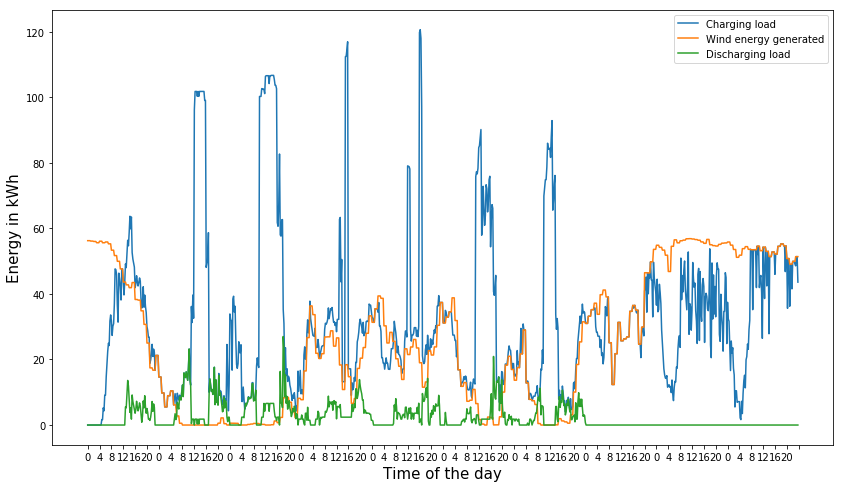

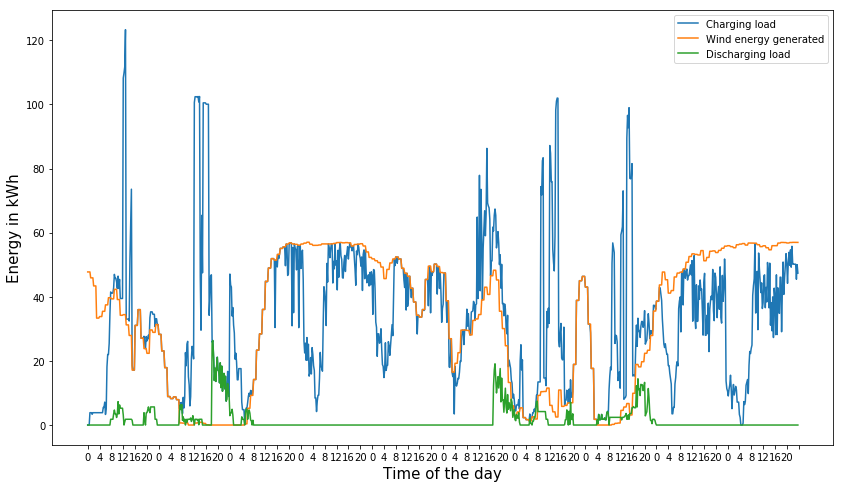

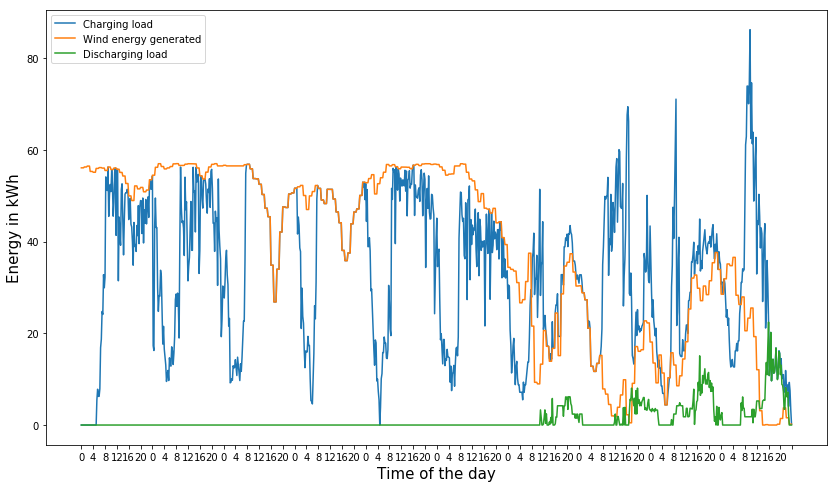

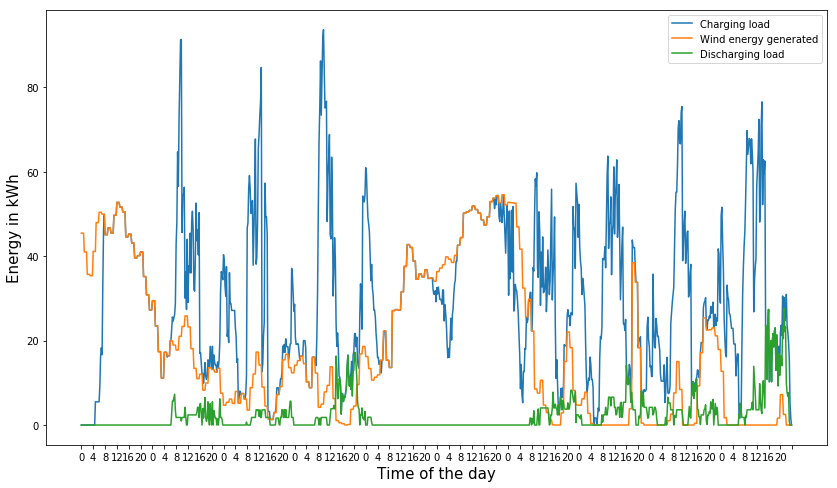

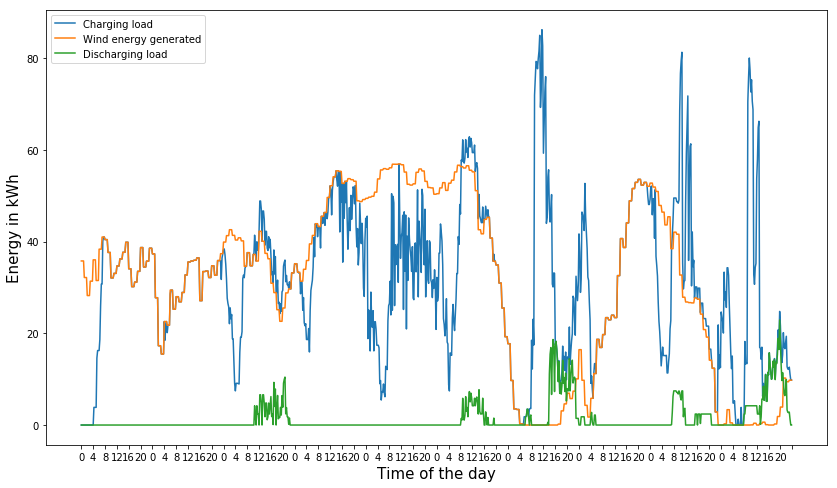

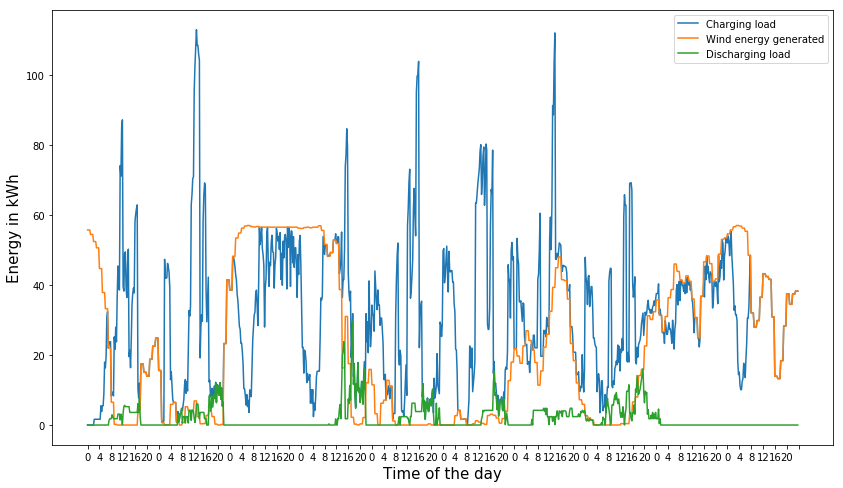

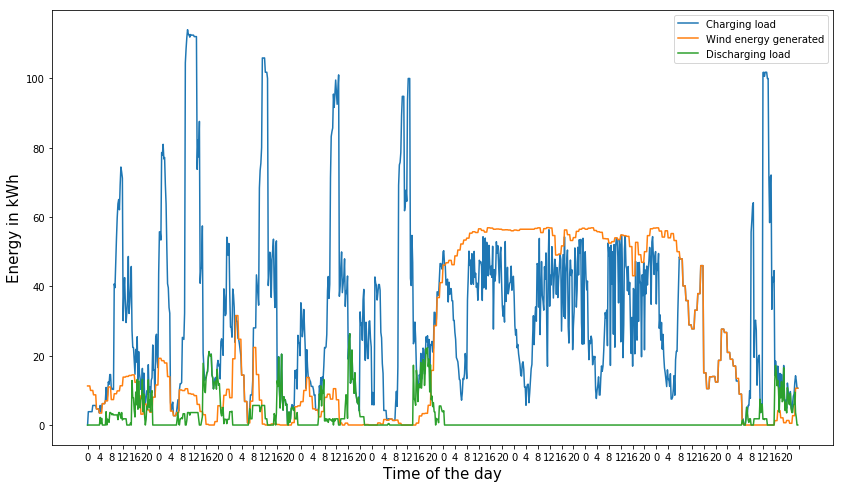

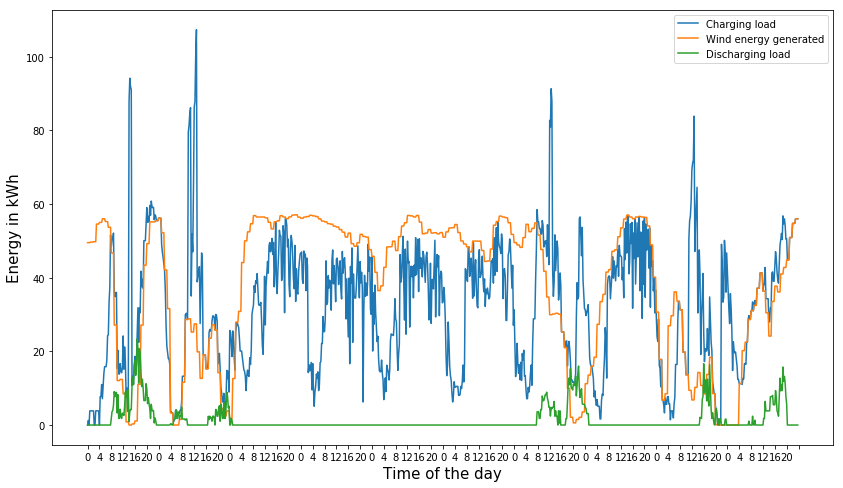

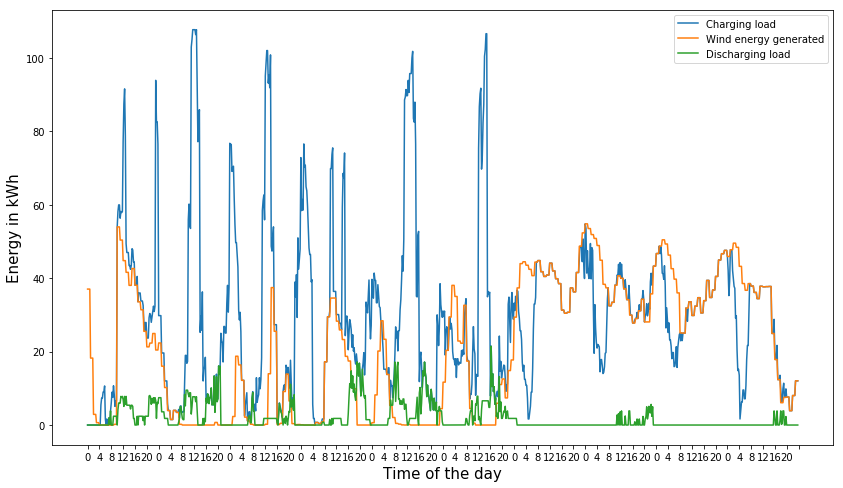

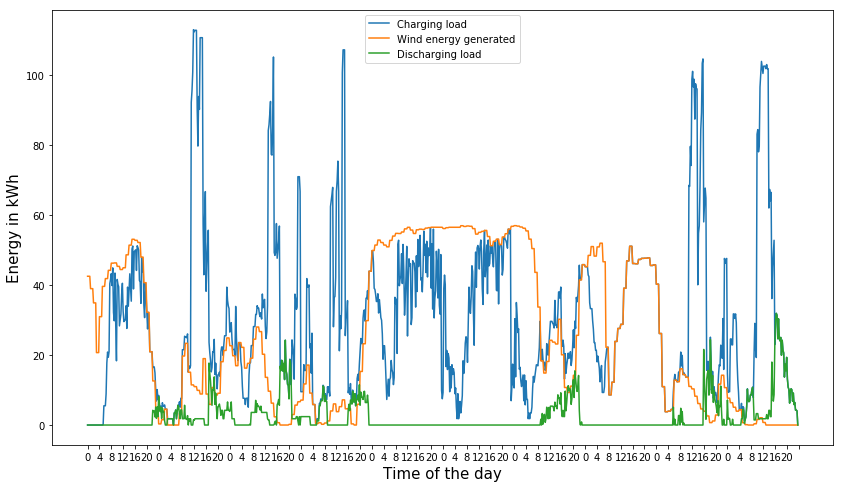

In [7]:
l=1
Simulate_biD_static(S=10, low_Td=4, max_Td=12, eta_v=0.9, delta=0.25, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                            Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)

C:\Users\pouyasharifi\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261154
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 31550



Scenario 1 NumVar and NumConstr = 230178, 263906
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 31894



Scenario 2 NumVar and NumConstr = 230220, 263884
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 31900



Scenario 3 NumVar and NumConstr = 225733, 258889
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of

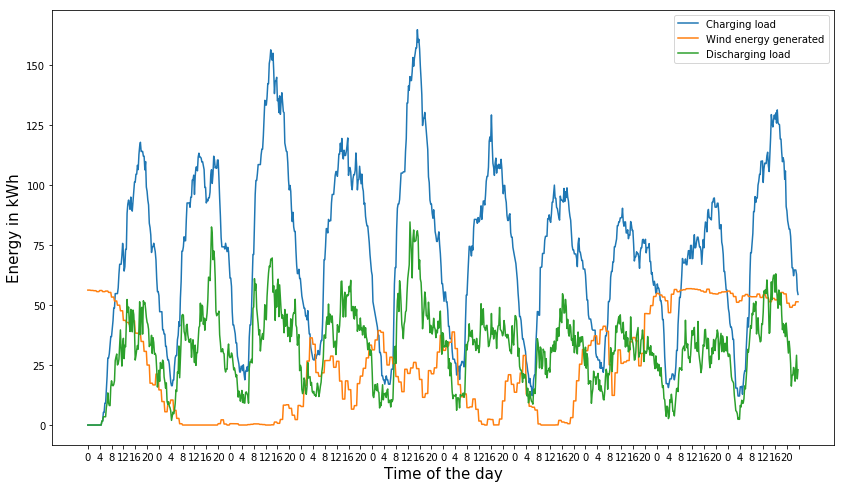

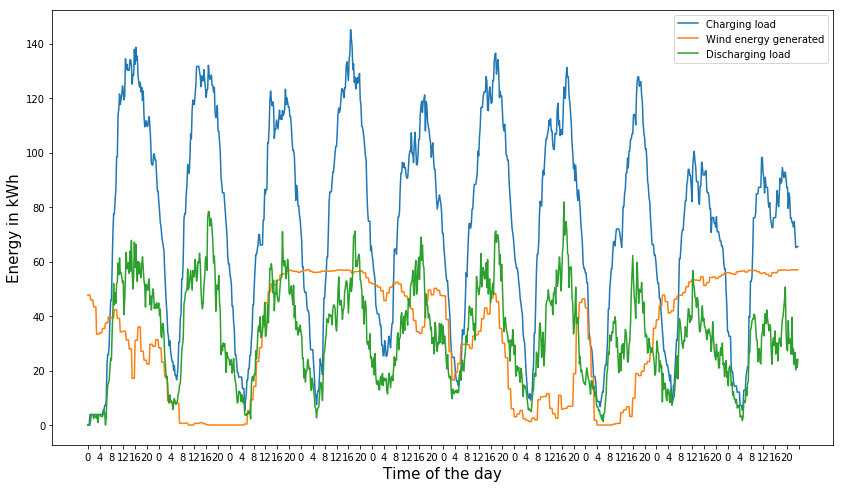

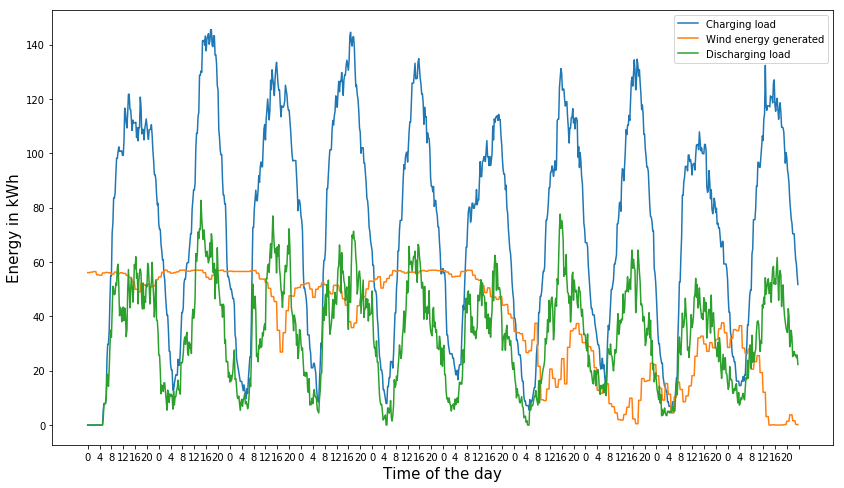

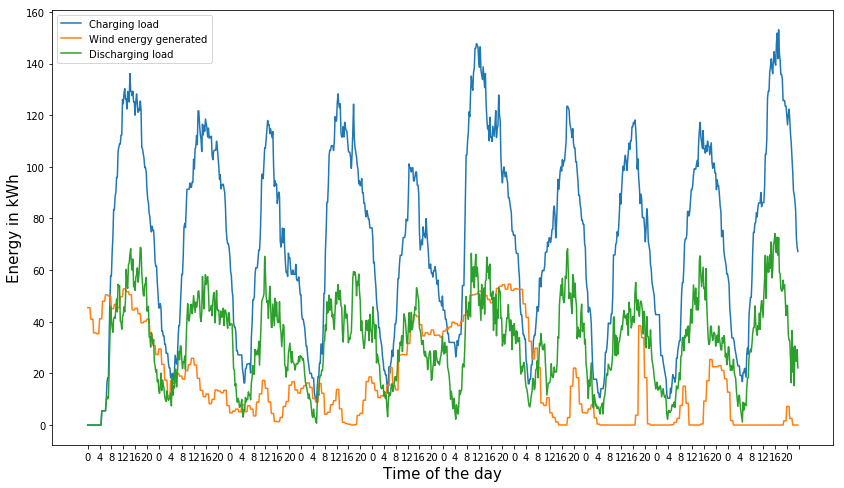

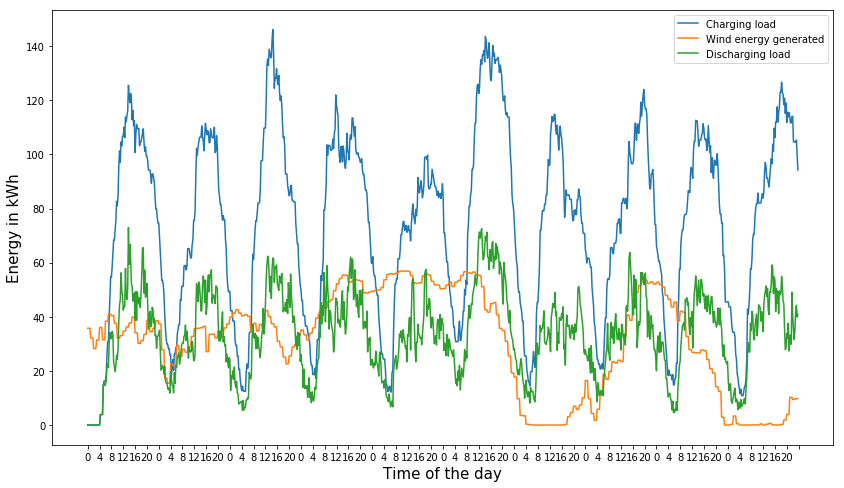

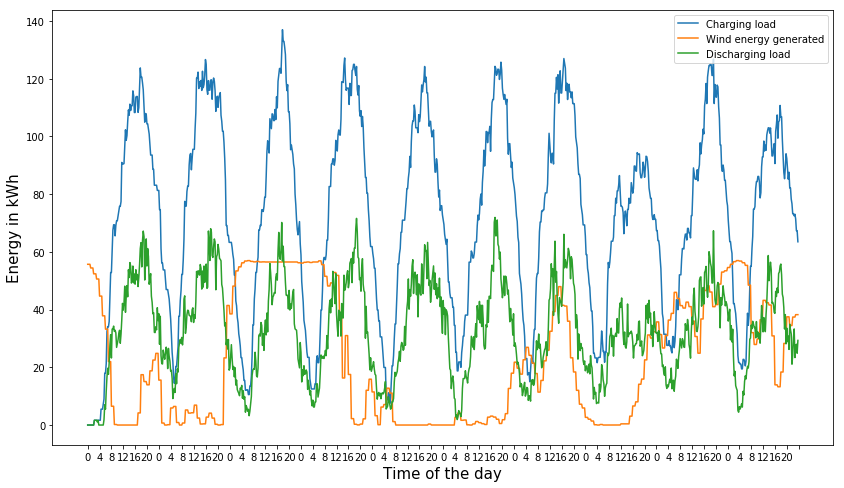

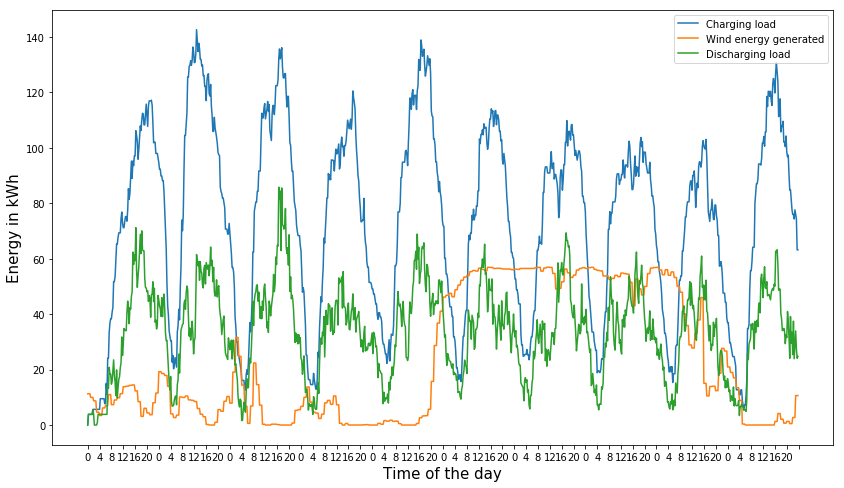

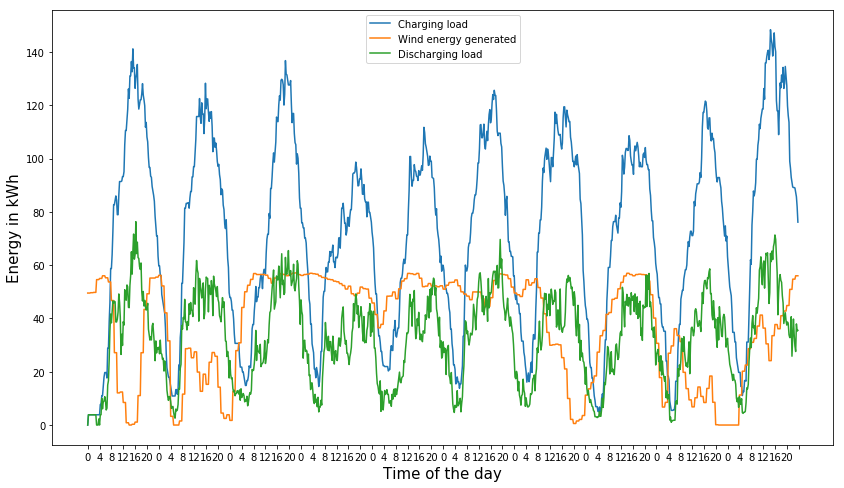

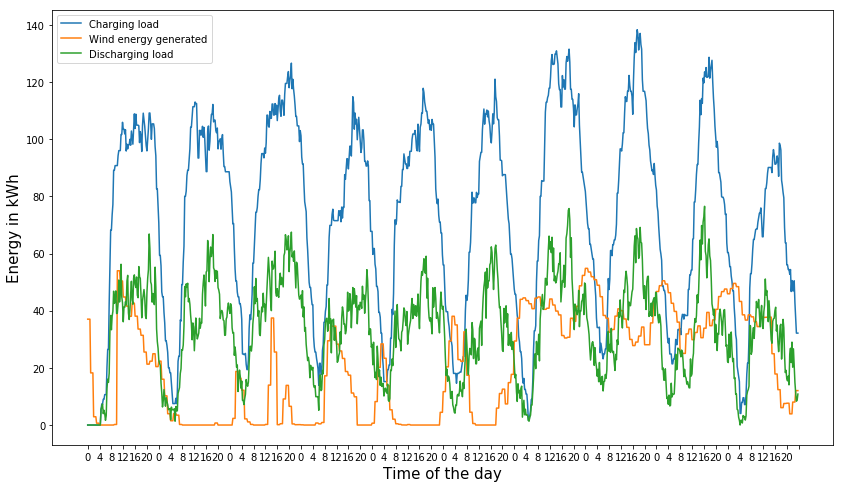

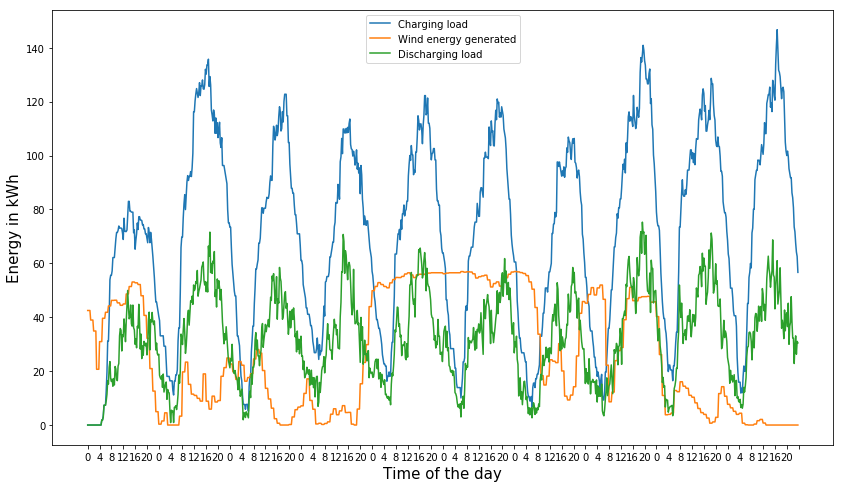

In [8]:
l+=1
Simulate_biD_static(S=10, low_Td=4, max_Td=12, eta_v=0.9, delta=0.25, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                            Day_of_Month=15, p=1, Optimal= False, Trans_P = 100, timelim =1000)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 111816, 140234
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 20211.9



Scenario 1 NumVar and NumConstr = 114118, 142648
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15996.2



Scenario 2 NumVar and NumConstr = 113099, 141608
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 18065.5



Scenario 3 NumVar and NumConstr = 110324, 138156
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Mi

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 112456, 140871
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 32609.6



Scenario 1 NumVar and NumConstr = 113488, 142014
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 29817.9



Scenario 2 NumVar and NumConstr = 112564, 141081
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 36227.1



Scenario 3 NumVar and NumConstr = 110949, 138766
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

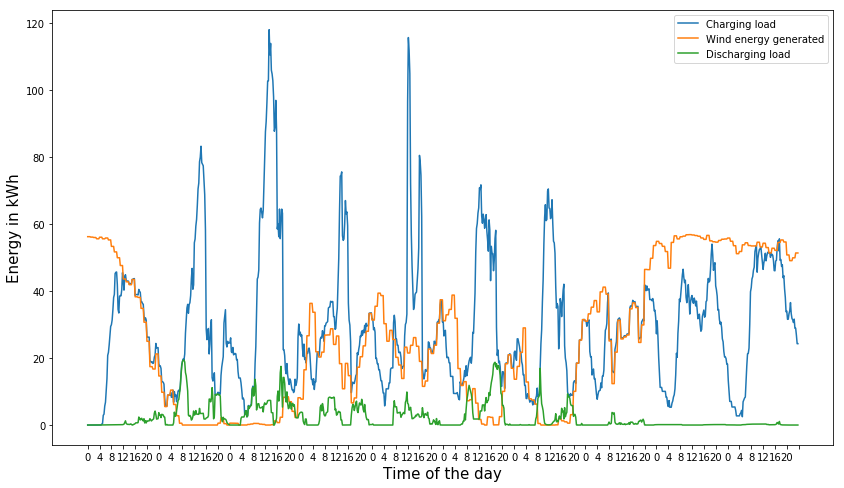

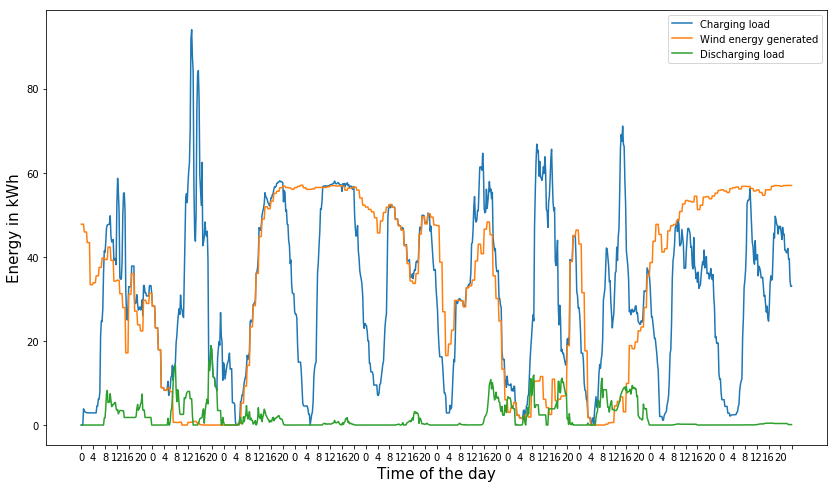

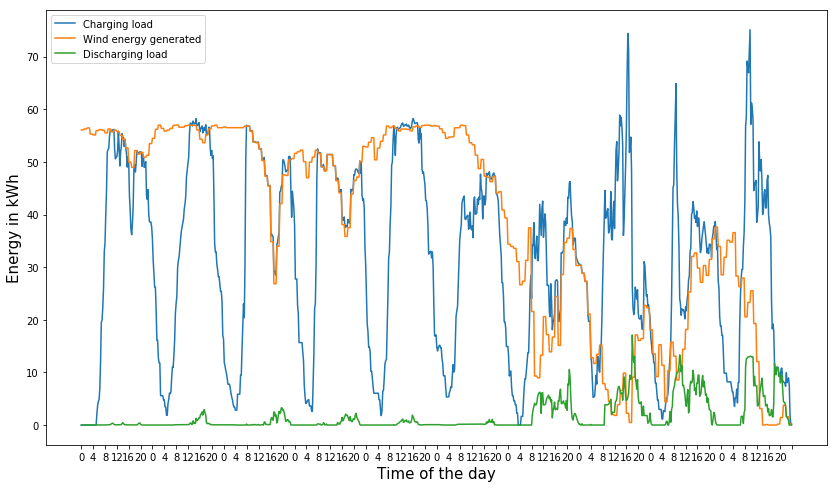

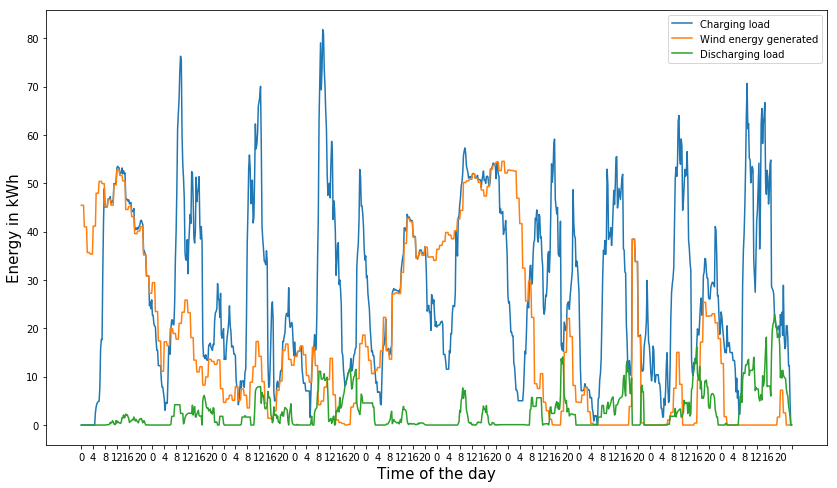

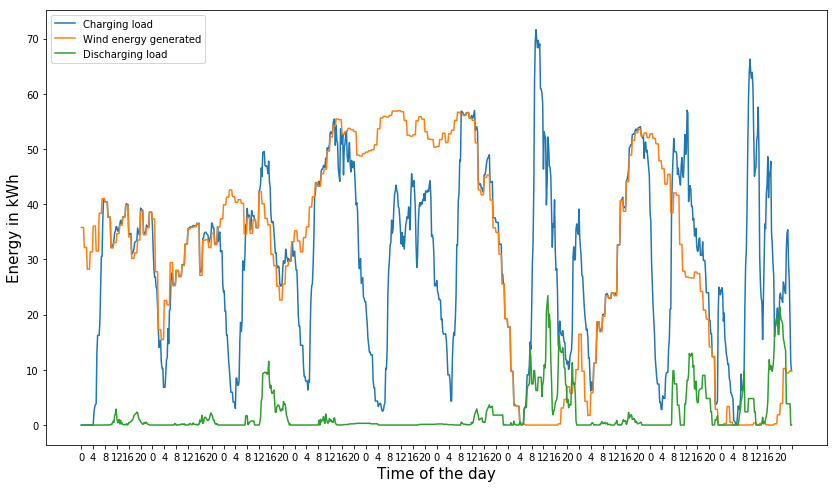

...

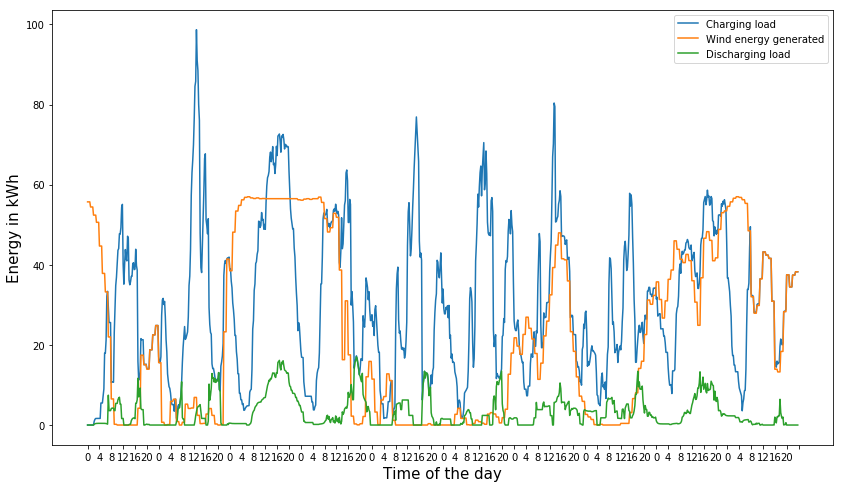

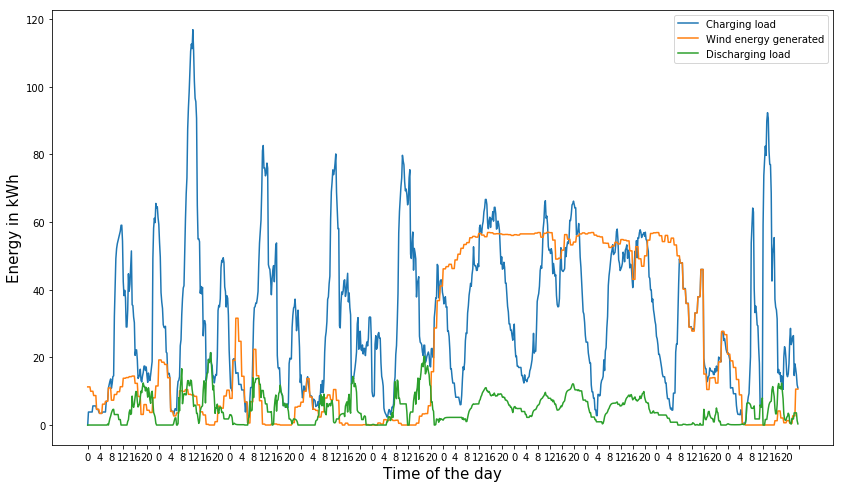

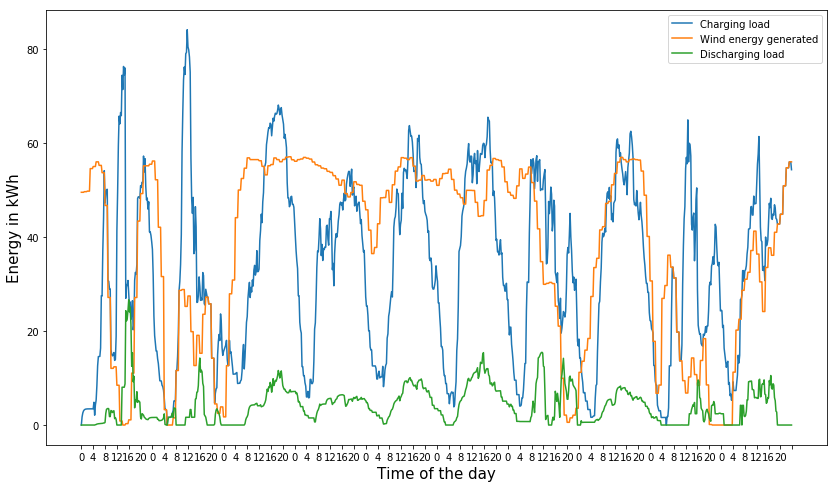

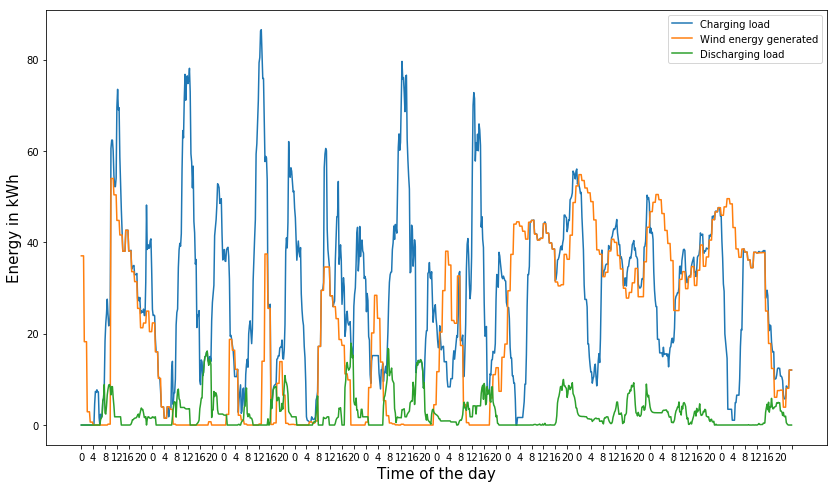

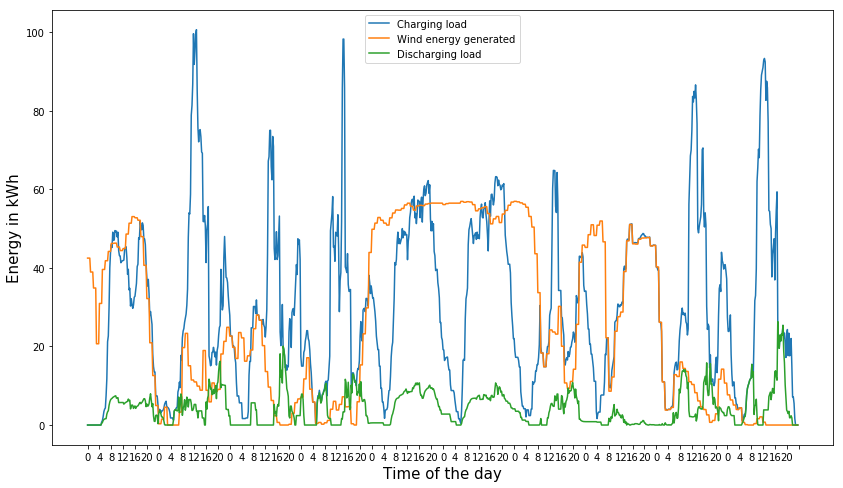

In [4]:
l=1
for p in [0,0.5,1]:
    for delta in [0.5,2]:
        Simulate_biD_static(S=10, eta_v=0.9, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=1,
                            Day_of_Month=15, p=p, Trans_P = 100, timelim =1000)
        l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 51356, 80381
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14185.5



Scenario 1 NumVar and NumConstr = 52088, 81237
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14234.5



Scenario 2 NumVar and NumConstr = 51944, 81080
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14116.5



Scenario 3 NumVar and NumConstr = 50814, 79251
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of p

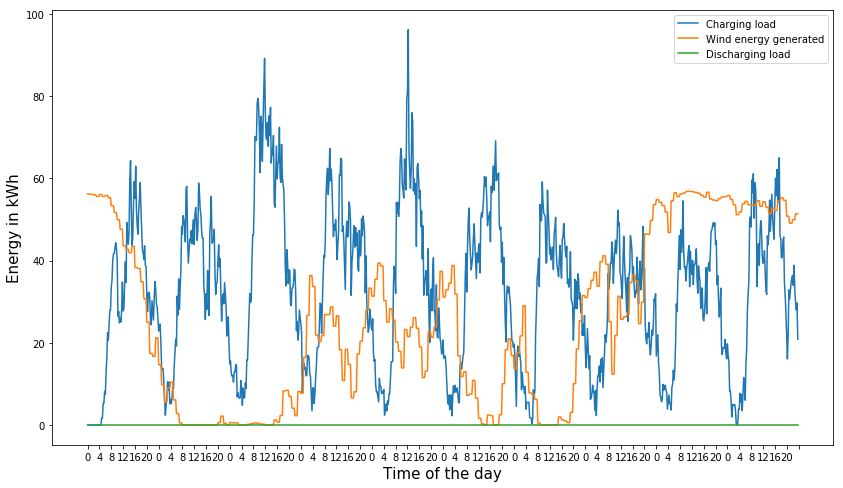

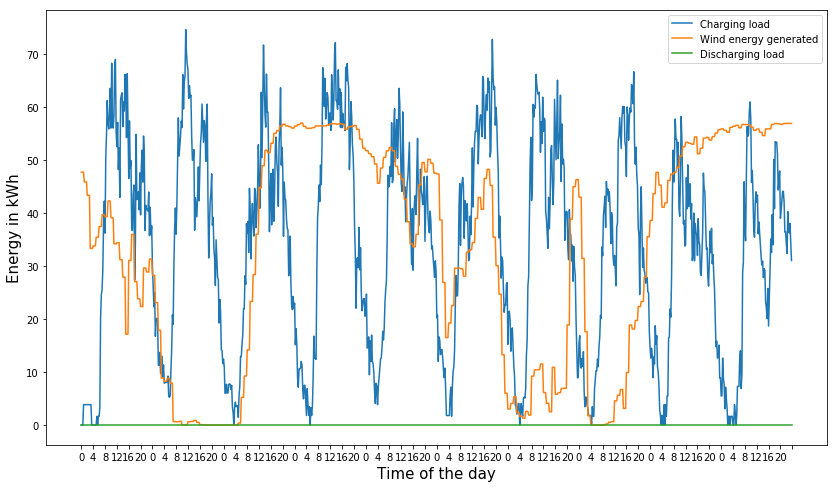

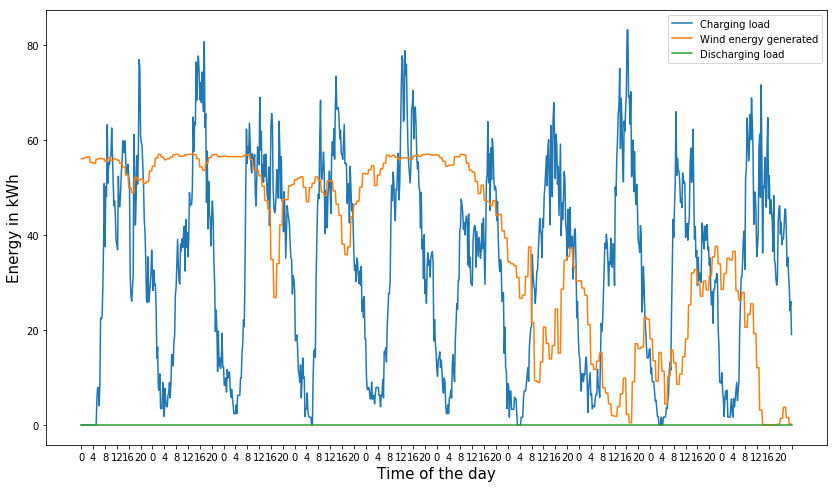

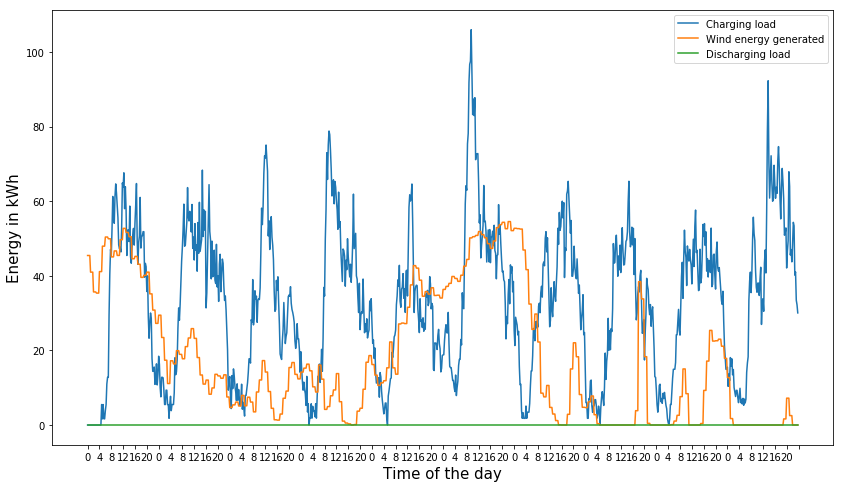

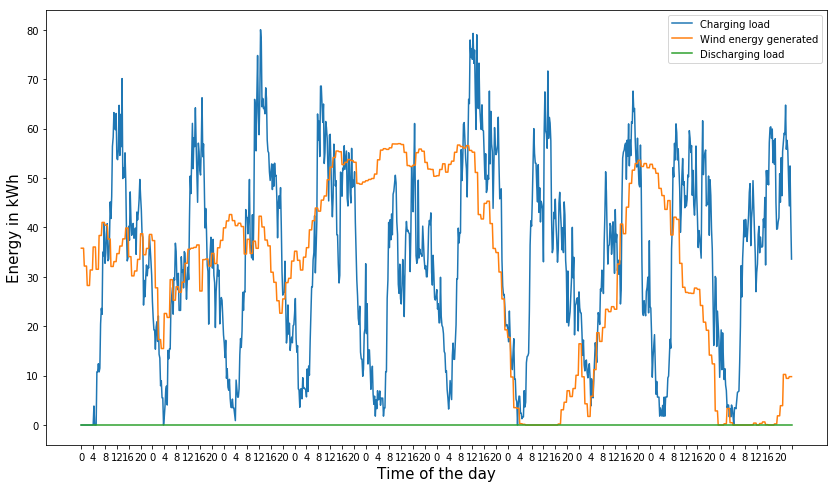

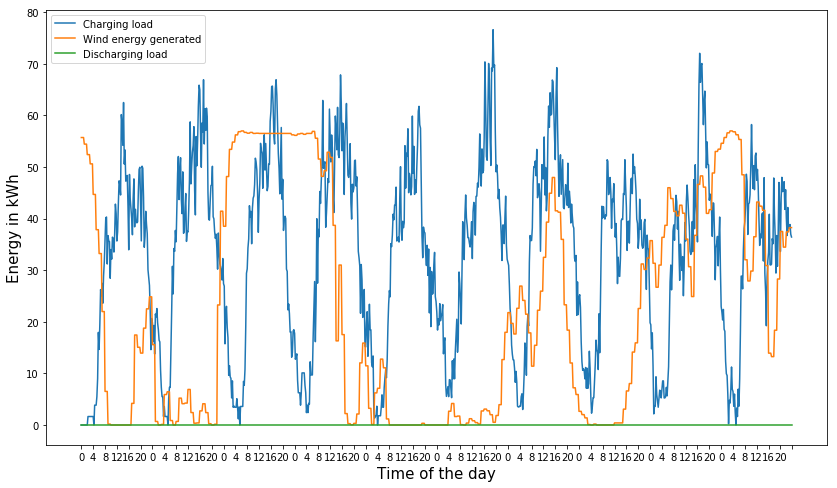

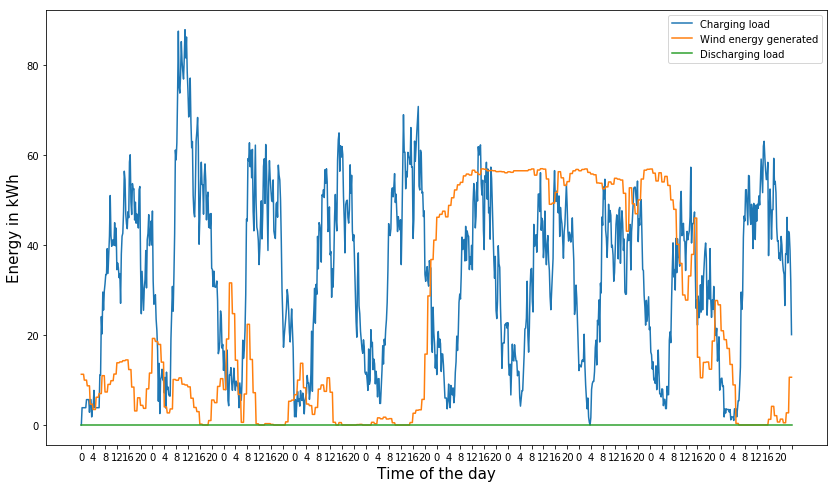

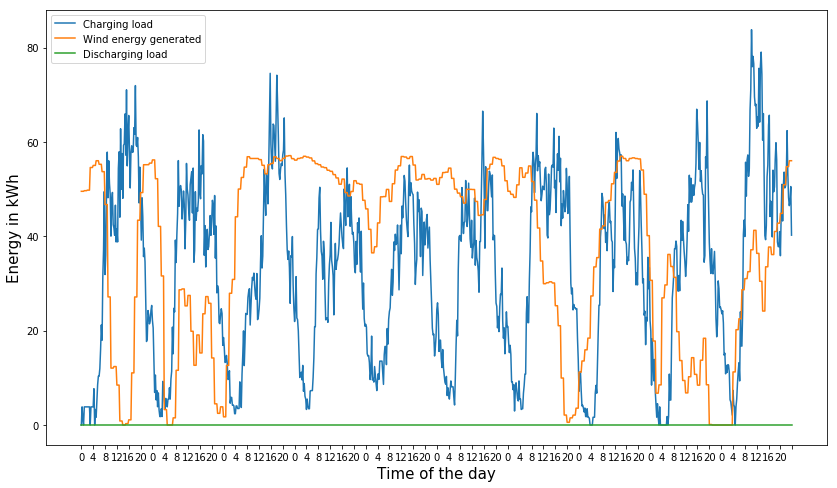

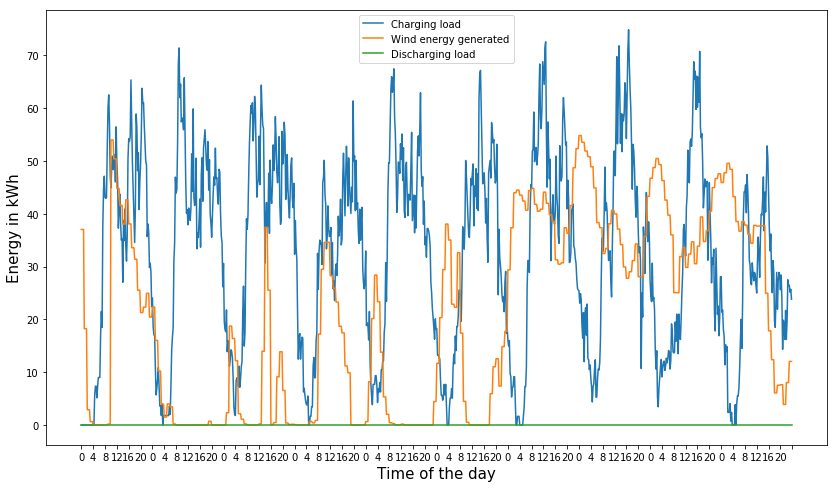

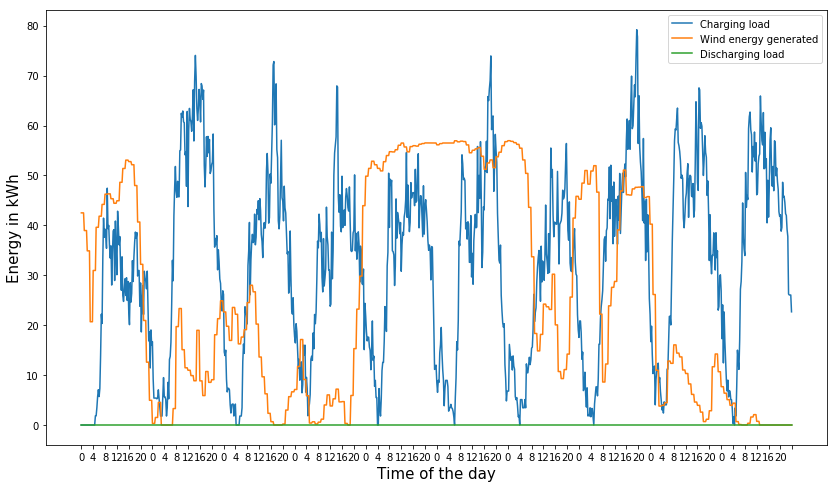

In [5]:
Simulate_biD_static(S=10, eta_v=0.9, delta=0.5, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                        Day_of_Month=15, Trans_P = 100, Optimal=False, p=0, timelim =1000)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 25588, 39506
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 39506 rows, 25588 columns and 86762 nonzeros
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e-02, 9e+01]

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Presolve removed 39506 rows and 25588 columns
Presolve time: 0.12s
Presolve: All rows and columns removed
Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    5.7505311e+03   0.000000e+00   0.000000e+00      0s

Solved with dual simplex
Solved in 0 iterations and 0.15 seconds
Optimal objective  5.750531139e+03
Optimal objective: 5750.53
ConsDC 0
ConsDC 0.0
RES_DC 0



Scenario 1 NumVar and NumConstr

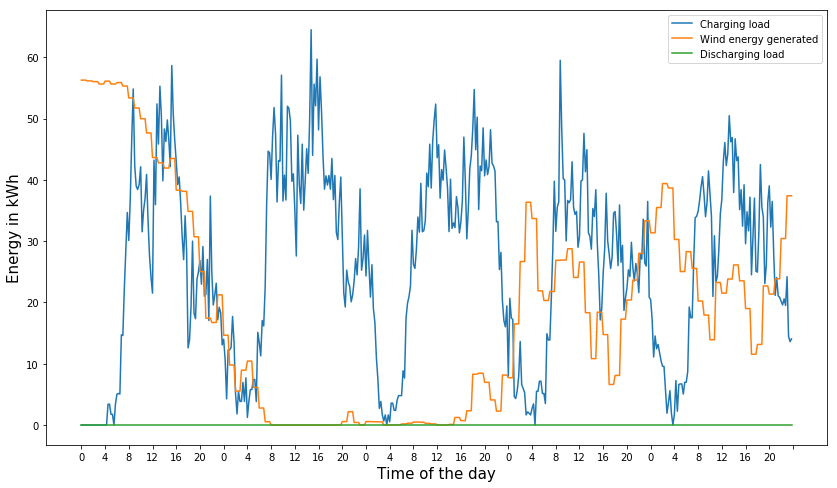

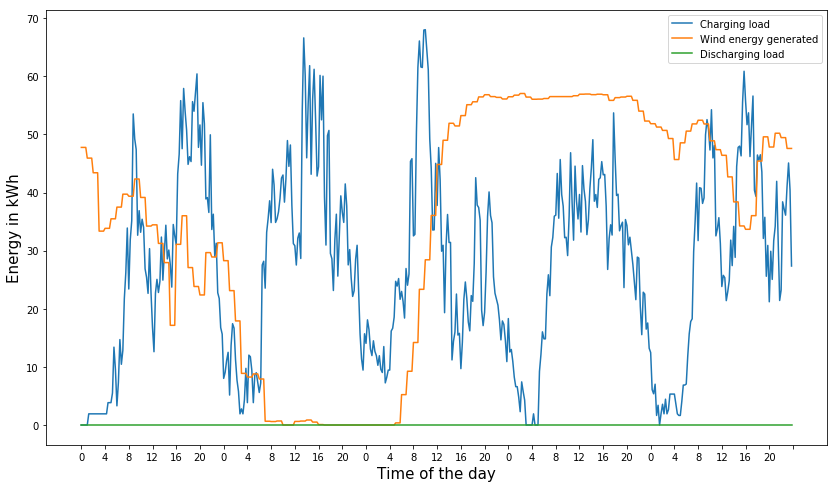

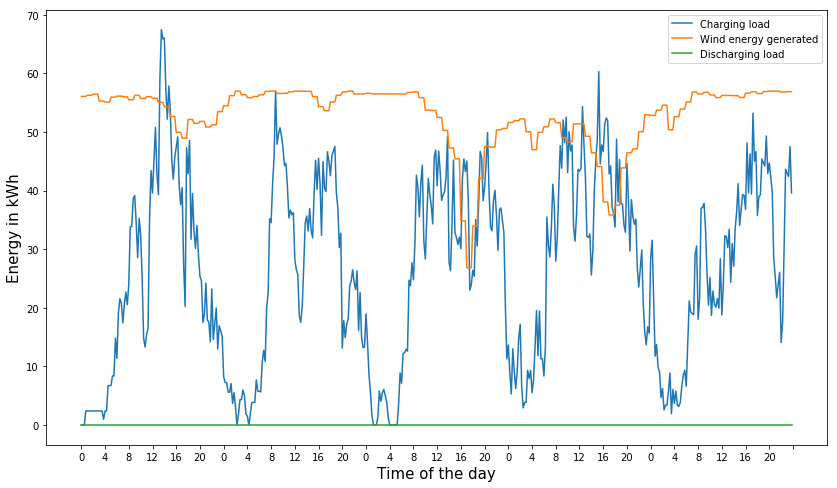

In [16]:
Simulate_biD_static(S=10, eta_v=1, delta=0.5, delta1=1, delta2=0, delta3=1, NumberOfDays=5, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, Optimal=False, p=0, timelim =1000)

In [5]:
#############CHECK THIS MONDAY

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38856
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 100.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 38856 rows, 34508 columns and 105131 nonzeros
Model has 19328 quadratic objective terms
Variable types: 25044 continuous, 9464 integer (9464 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [5e-01, 2e+01]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [7e-03, 1e+02]
Presolve removed 21992 rows and 9029 columns
Presolve time: 0.23s
Presolved: 16864 rows, 25479 columns, 59196 nonzeros
Presolved model has 17540 quadratic objective terms
Variable types: 21042 continuous, 4437 integer (4437 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   30730   -6.0758490e+03   0.000000e+00   3.838287e+02      5s
   

Optimize a model with 37925 rows, 33479 columns and 102140 nonzeros
Model has 18740 quadratic objective terms
Variable types: 24309 continuous, 9170 integer (9170 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [9e-01, 2e+01]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [9e-02, 1e+02]
Presolve removed 21818 rows and 9370 columns
Presolve time: 0.22s
Presolved: 16107 rows, 24109 columns, 55677 nonzeros
Presolved model has 16898 quadratic objective terms
Variable types: 19795 continuous, 4314 integer (4314 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   32079   -6.3243693e+03   0.000000e+00   9.811734e+02      5s
   37556   -6.5545867e+03   0.000000e+00   3.397462e+02     10s
   41840   -6.6271330e+03   0.000000e+00   1.481091e+02     15s
   45648   -6.6550573e+03   0.000000e+00   3.739306e+00     20s
   49401   -4.6456497e+03   4.592785e+02   0.000000e+00     2

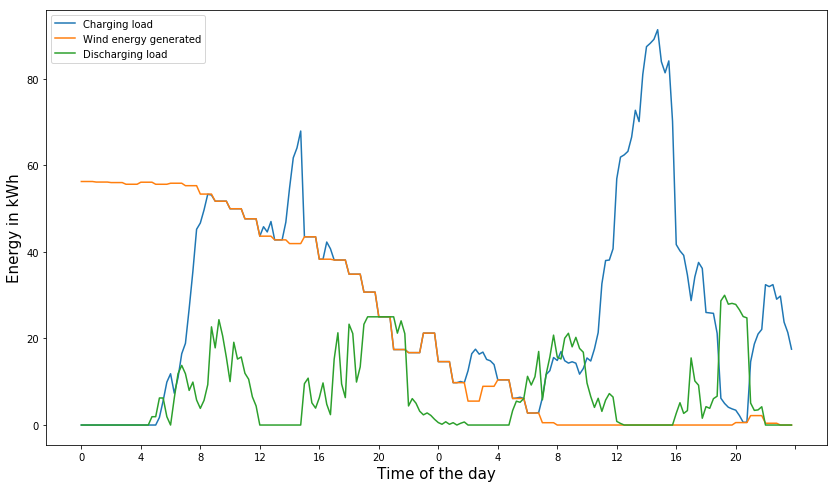

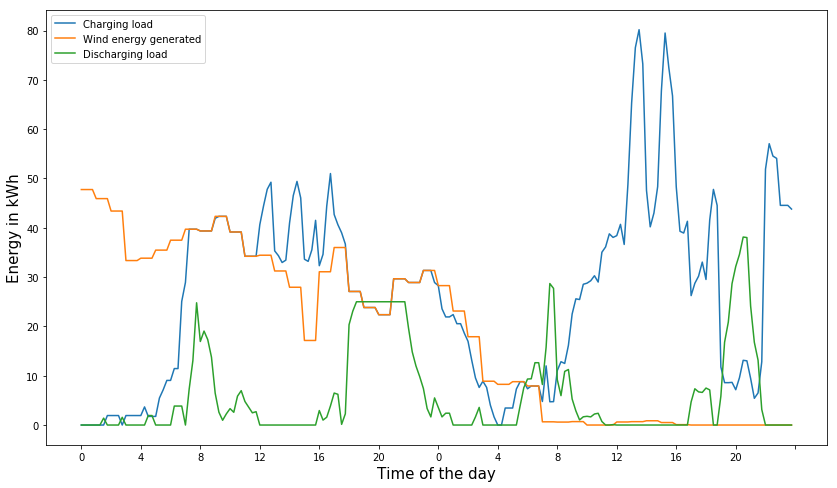

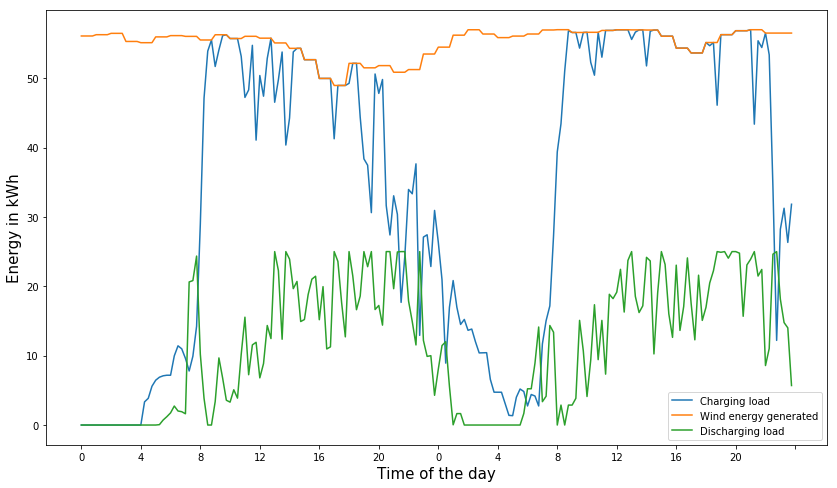

In [9]:
l=1
for delta in [0.9]:
    Simulate_biD_static(S=3, eta_v=1, delta=delta, delta1=1, delta2=1, delta3=1, NumberOfDays=2, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, timelim =100)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 34508, 39632
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 39632 rows, 34508 columns and 105907 nonzeros
Model has 19328 quadratic objective terms
Variable types: 25044 continuous, 9464 integer (9464 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [1e-01, 6e+00]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [7e-03, 1e+02]
Presolve removed 27361 rows and 17599 columns
Presolve time: 0.22s
Presolved: 12271 rows, 16909 columns, 41908 nonzeros
Presolved model has 17436 quadratic objective terms
Variable types: 12496 continuous, 4413 integer (4413 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   19109    2.2047

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 39632
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 39632 rows, 34508 columns and 105907 nonzeros
Model has 19328 quadratic objective terms
Variable types: 25044 continuous, 9464 integer (9464 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [5e-01, 6e+00]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [7e-03, 1e+02]
Presolve removed 27365 rows and 17604 columns
Presolve time: 0.20s
Presolved: 12267 rows, 16904 columns, 41895 nonzeros
Presolved model has 17425 quadratic objective terms
Variable types: 12491 continuous, 4413 integer (4413 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   17500    2.3336217e+03   1.919295e+03   0.000000e+00      5s
 

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 39632
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 39632 rows, 34508 columns and 105907 nonzeros
Model has 19328 quadratic objective terms
Variable types: 25044 continuous, 9464 integer (9464 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [6e-01, 6e+00]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [7e-03, 1e+02]
Presolve removed 27365 rows and 17605 columns
Presolve time: 0.21s
Presolved: 12267 rows, 16903 columns, 41894 nonzeros
Presolved model has 17424 quadratic objective terms
Variable types: 12490 continuous, 4413 integer (4413 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   17749    2.9482225e+03   2.344495e+03   0.000000e+00      5s
 

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 39632
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 39632 rows, 34508 columns and 105907 nonzeros
Model has 19328 quadratic objective terms
Variable types: 25044 continuous, 9464 integer (9464 binary)
Coefficient statistics:
  Matrix range     [8e-01, 4e+00]
  Objective range  [6e-01, 6e+00]
  QObjective range [2e-01, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [7e-03, 1e+02]
Presolve removed 27365 rows and 17605 columns
Presolve time: 0.17s
Presolved: 12267 rows, 16903 columns, 41894 nonzeros
Presolved model has 17424 quadratic objective terms
Variable types: 12490 continuous, 4413 integer (4413 binary)

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
   17490    6.1875157e+03   2.057063e+03   0.000000e+00      5s
 

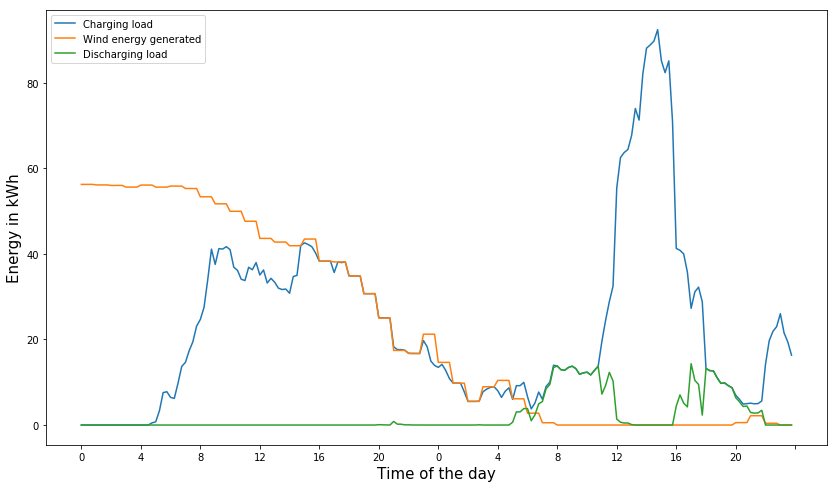

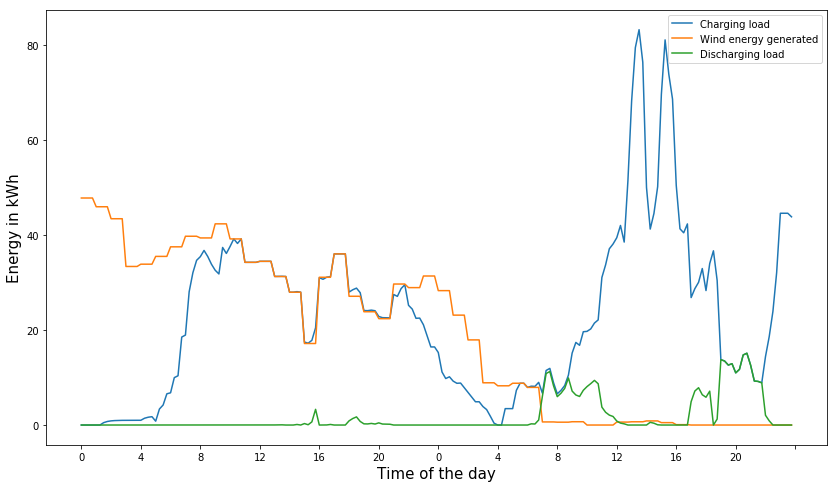

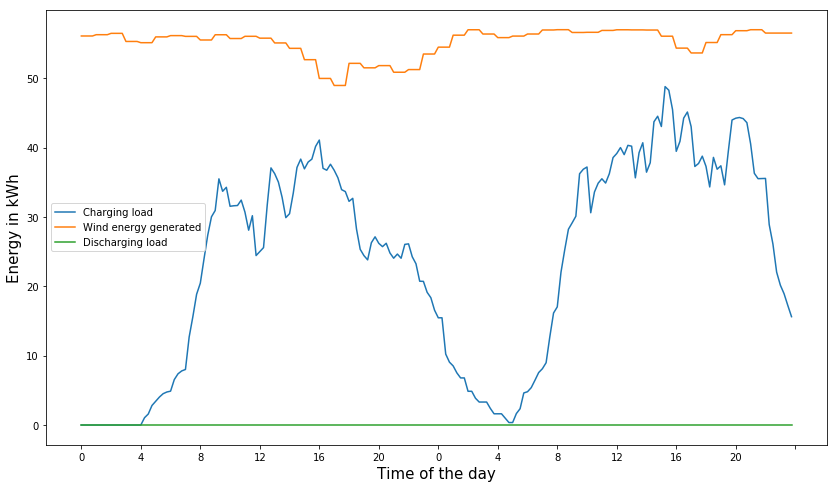

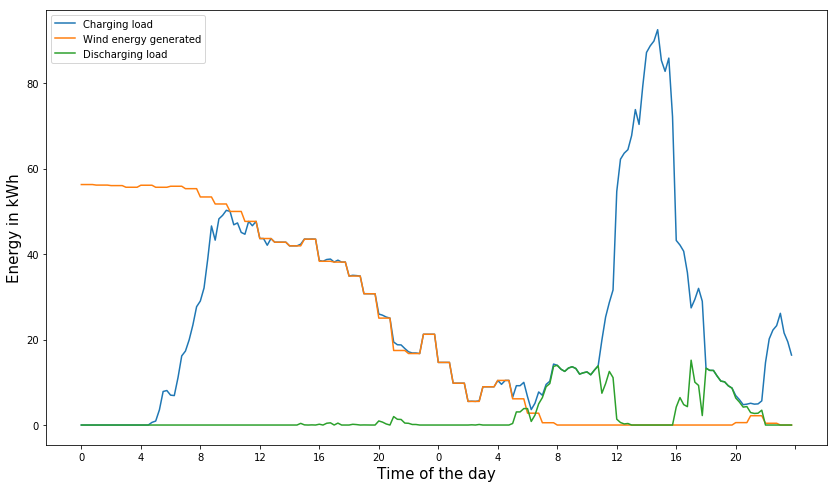

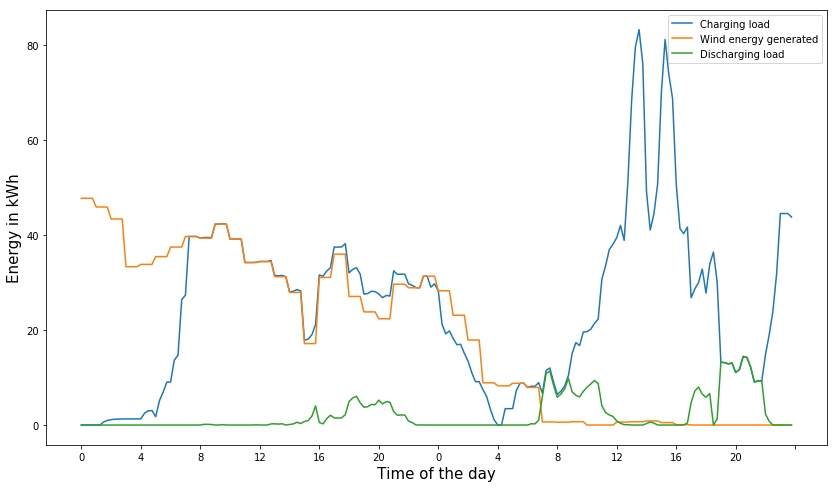

...

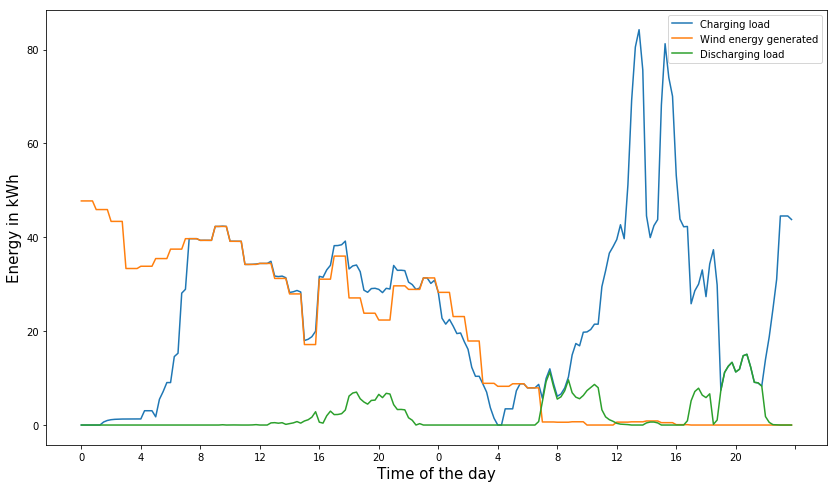

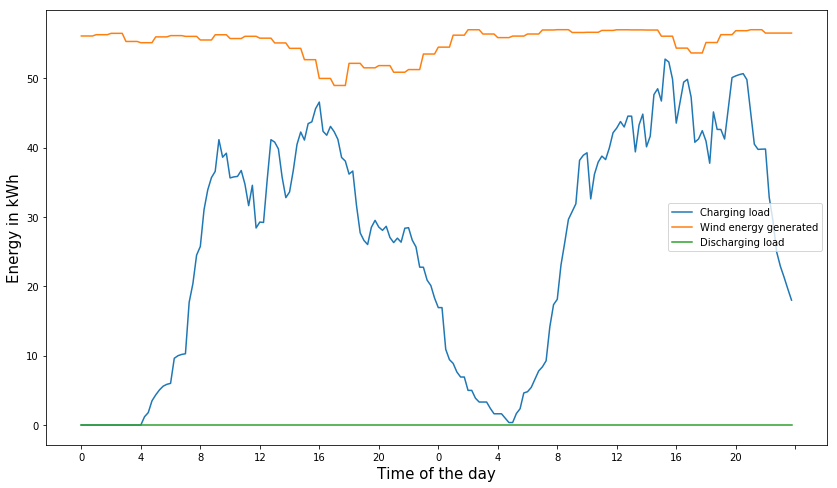

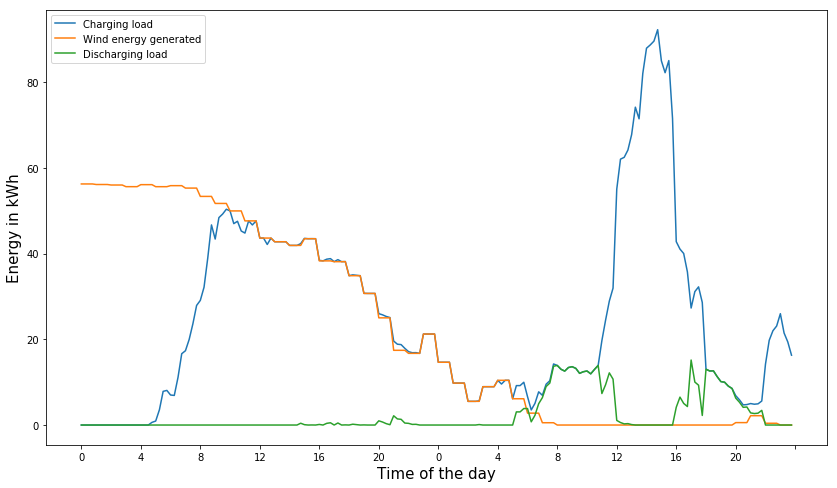

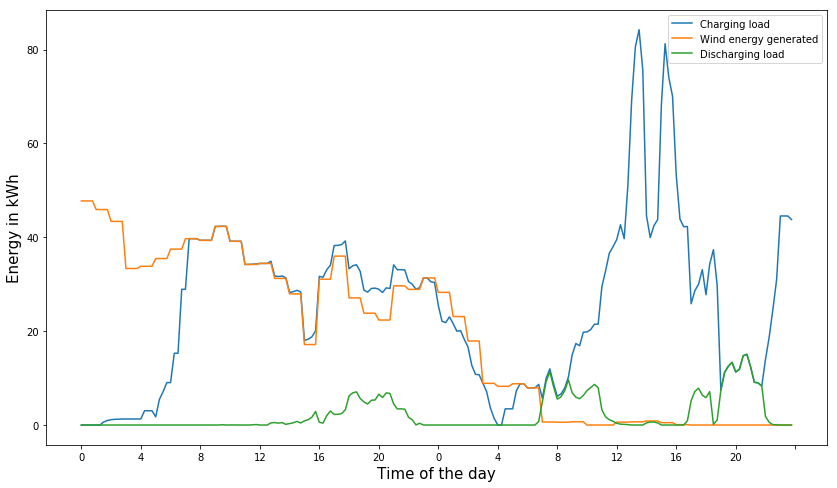

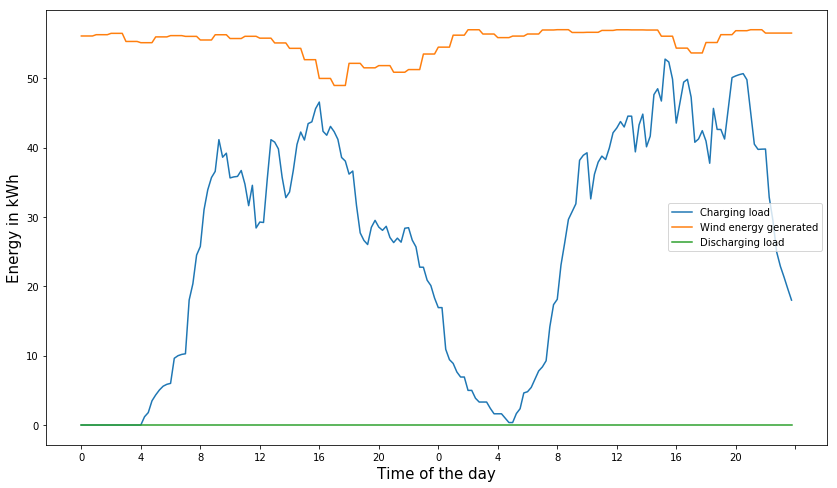

In [4]:
l=1
for delta in [0.1,0.5, 0.9,3]:
    Simulate_biD_static(S=3, eta_v=1, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=2, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38875
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3284.7
ConsDC 430.2846857672056
ConsDC 430.2846857672048



Scenario 1 NumVar and NumConstr = 33563, 37902
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3267.53
ConsDC 331.8710879988439
ConsDC 331.8710879988424



Scenario 2 NumVar and NumConstr = 33479, 37942
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 938.997
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

min parking time

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38875
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 4015.63
ConsDC 437.205225261847
ConsDC 437.20522526184584



Scenario 1 NumVar and NumConstr = 33563, 37902
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3761.51
ConsDC 411.2252209101214
ConsDC 411.2252209101206



Scenario 2 NumVar and NumConstr = 33479, 37942
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3207.15
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

min parking tim

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38875
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 4712.4
ConsDC 437.8121624635011
ConsDC 437.81216246350004



Scenario 1 NumVar and NumConstr = 33563, 37902
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 4218.26
ConsDC 415.51851703465286
ConsDC 415.51851703465286



Scenario 2 NumVar and NumConstr = 33479, 37942
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 5431.22
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

min parking t

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38875
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8350.98
ConsDC 437.34385166097184
ConsDC 437.3438516609709



Scenario 1 NumVar and NumConstr = 33563, 37902
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 6548.04
ConsDC 417.57561184692327
ConsDC 417.5756118469226



Scenario 2 NumVar and NumConstr = 33479, 37942
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17102.2
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

min parking t

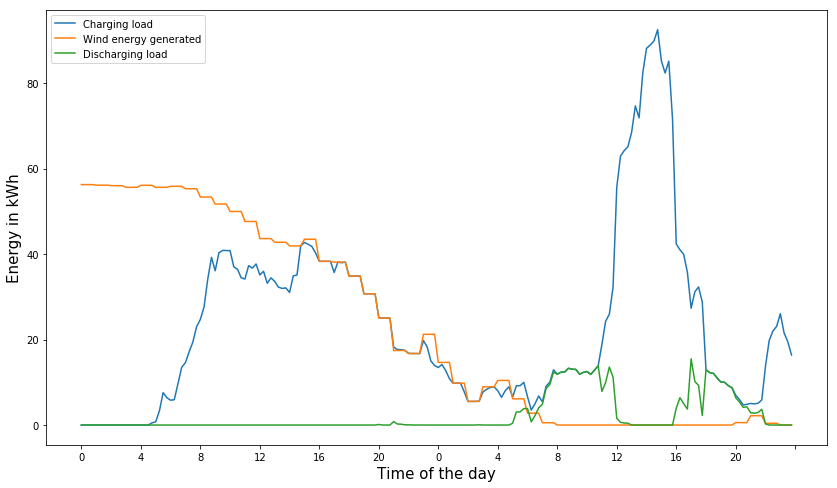

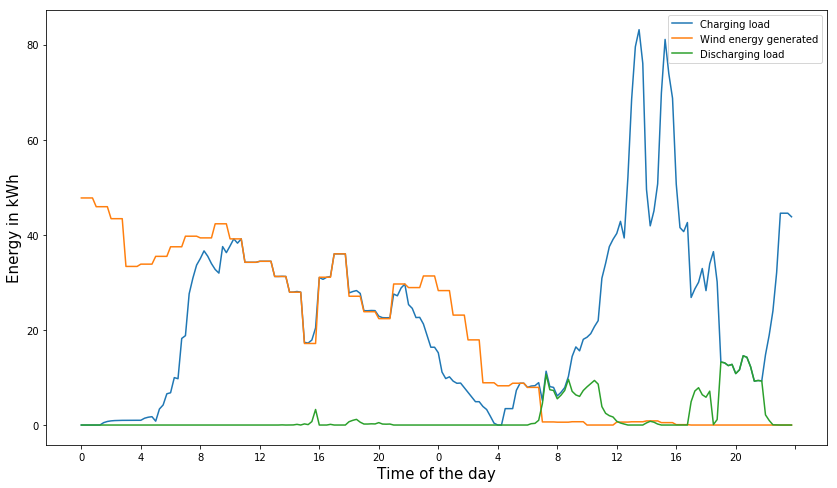

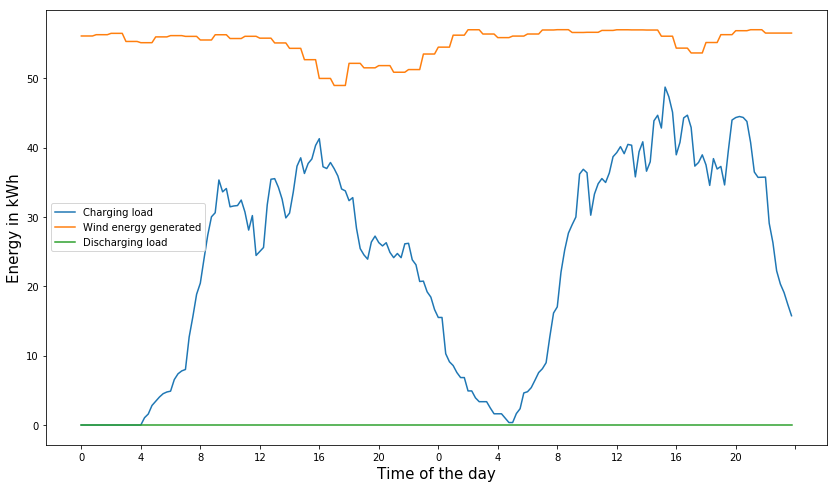

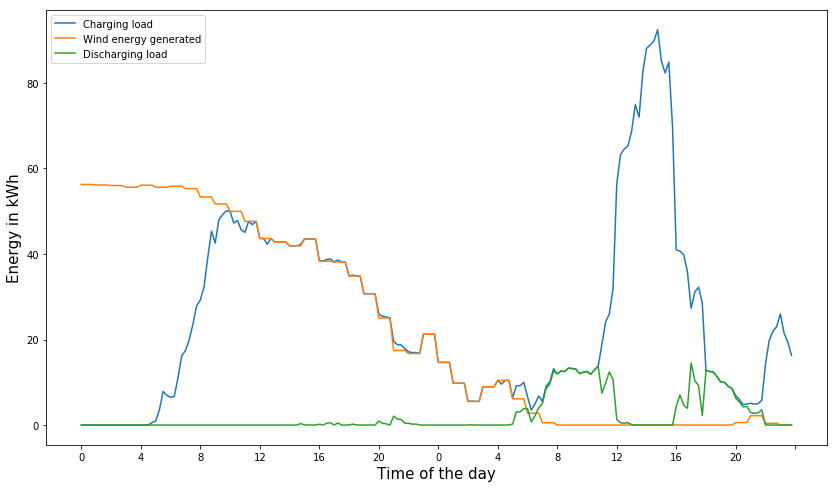

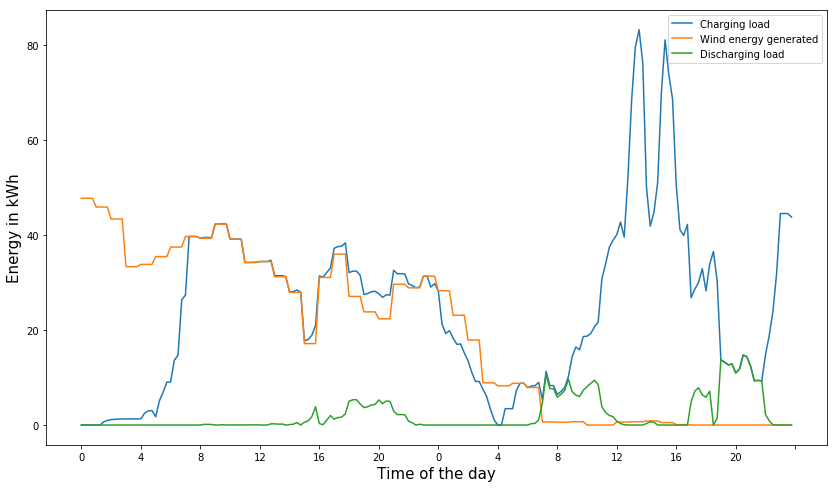

...

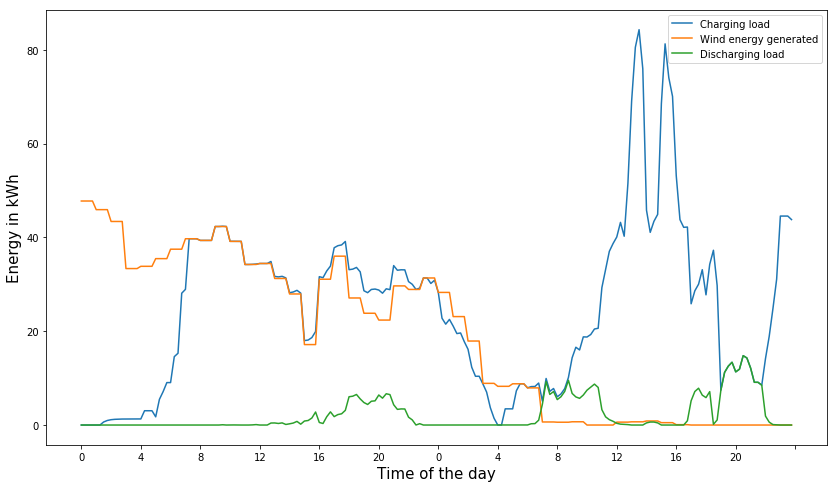

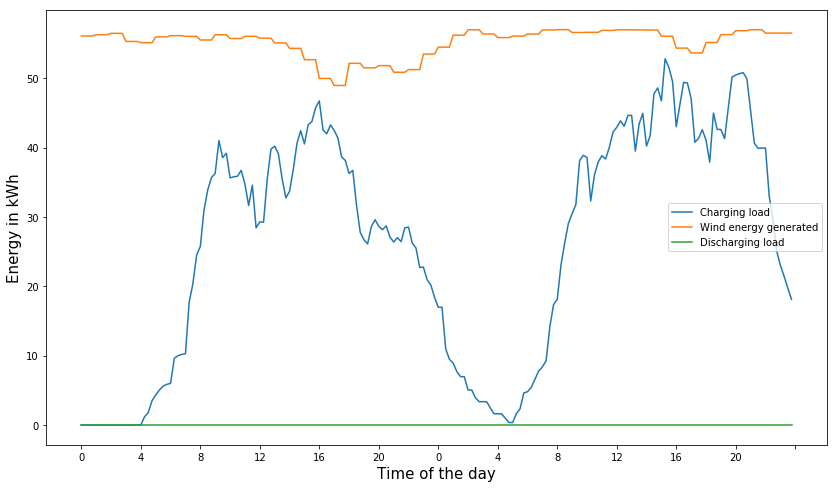

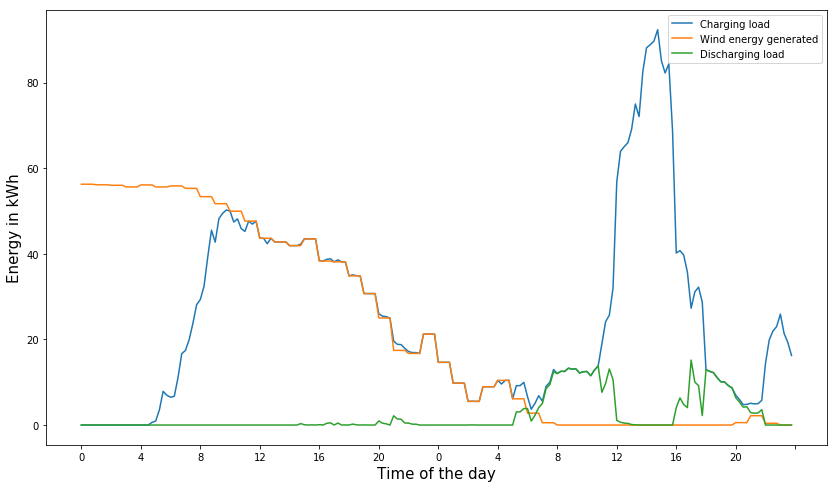

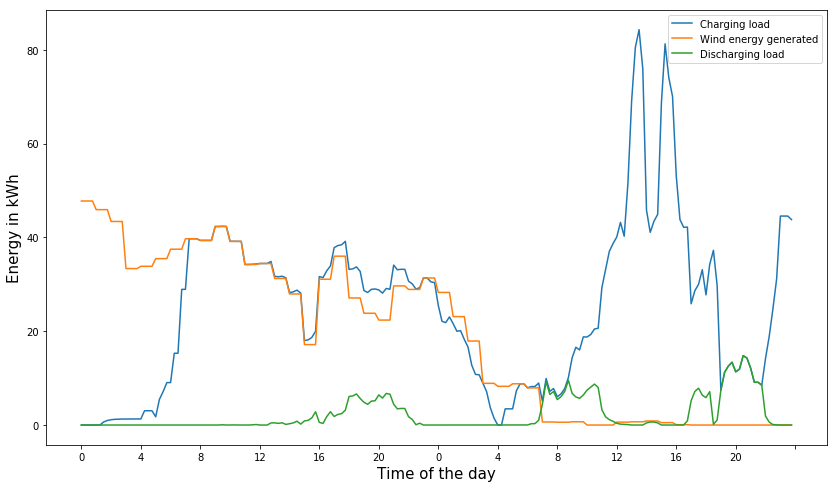

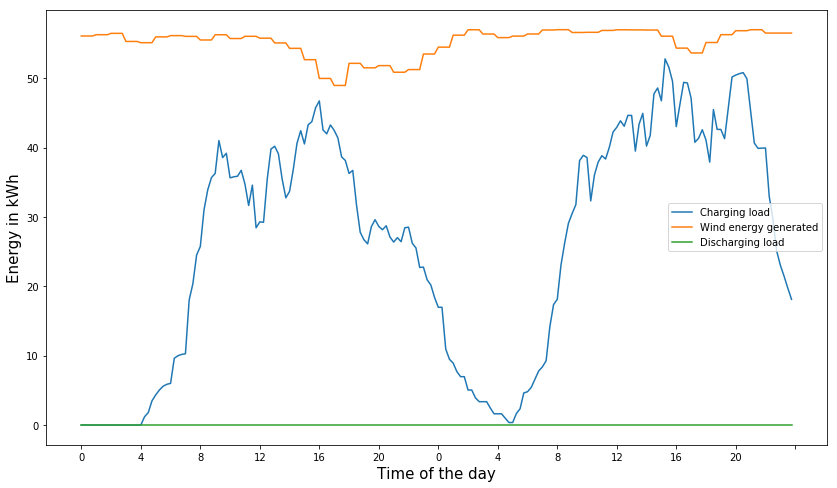

In [7]:
l=1
for delta in [0.1,0.5, 0.9,3]:
    Simulate_biD_static(S=3, eta_v=1, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=2, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 34508, 38683
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3320.9
ConsDC 391.9816134272784
ConsDC 391.9816134272772



Scenario 1 NumVar and NumConstr = 33563, 37710
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3299.56
ConsDC 312.4960625175423
ConsDC 312.49606251754227



Scenario 2 NumVar and NumConstr = 33479, 37750
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 945.56
ConsDC 0.0
ConsDC 0.

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38683
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 4004.24
ConsDC 432.0392285834744
ConsDC 432.0392285834736



Scenario 1 NumVar and NumConstr = 33563, 37710
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3779.3
ConsDC 228.60868885350447
ConsDC 228.6086888535044



Scenario 2 NumVar and NumConstr = 33479, 37750
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

min parki

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 34508, 38683
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
ConsDC 432.14298053719915
ConsDC 432.1429805371978



Scenario 1 NumVar and NumConstr = 33563, 37710
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 4192.88
ConsDC 323.86343513136774
ConsDC 323.863435131366



Scenario 2 NumVar and NumConstr = 33479, 37750
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
ConsDC 0.0
ConsDC 0.0
Simulation Parameters are: 

mi

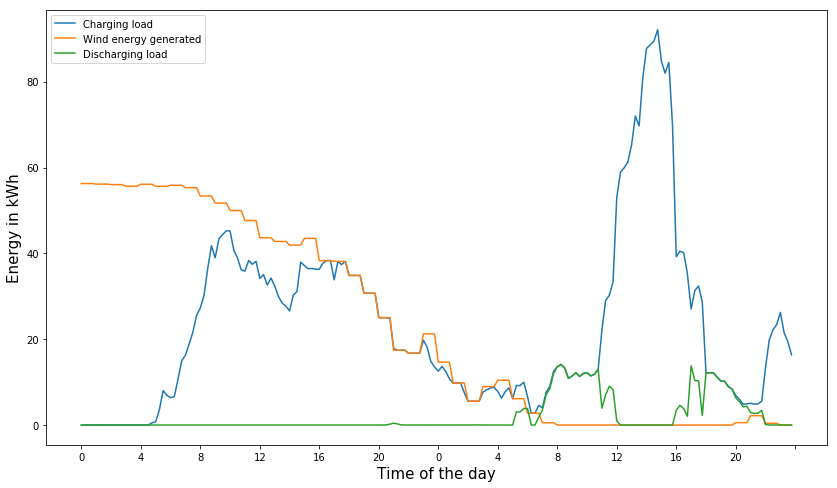

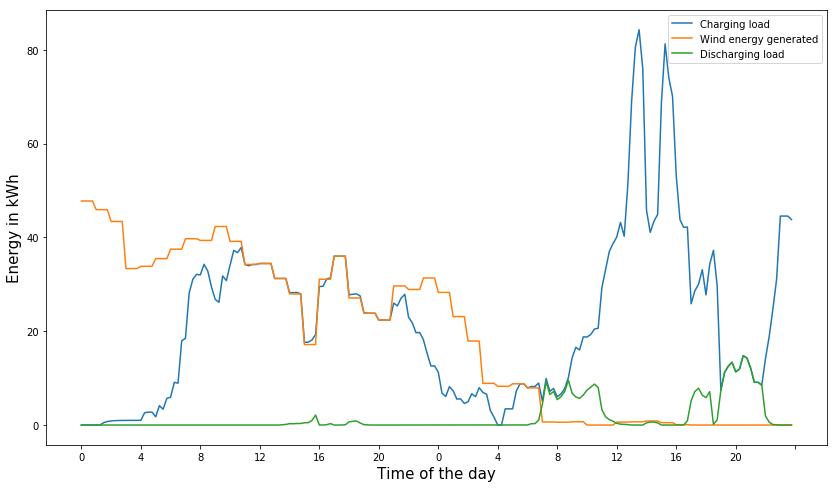

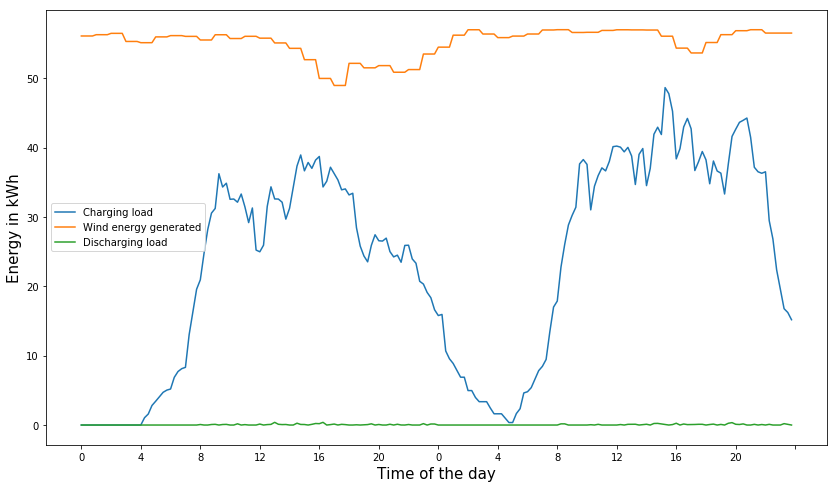

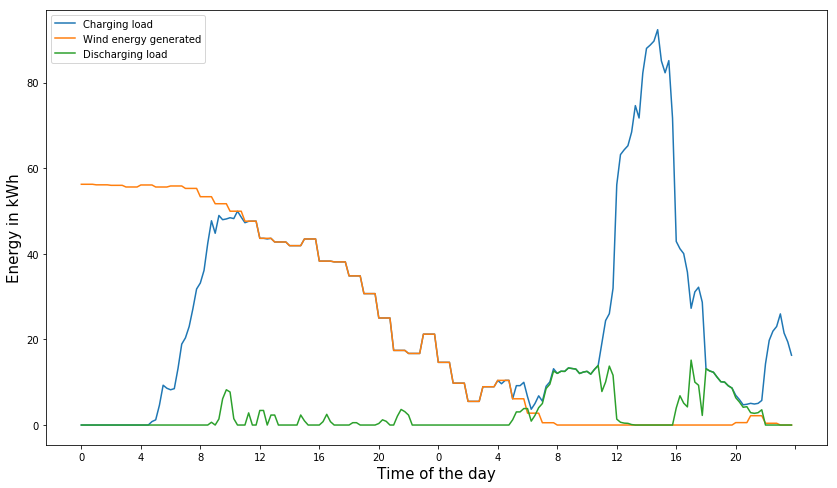

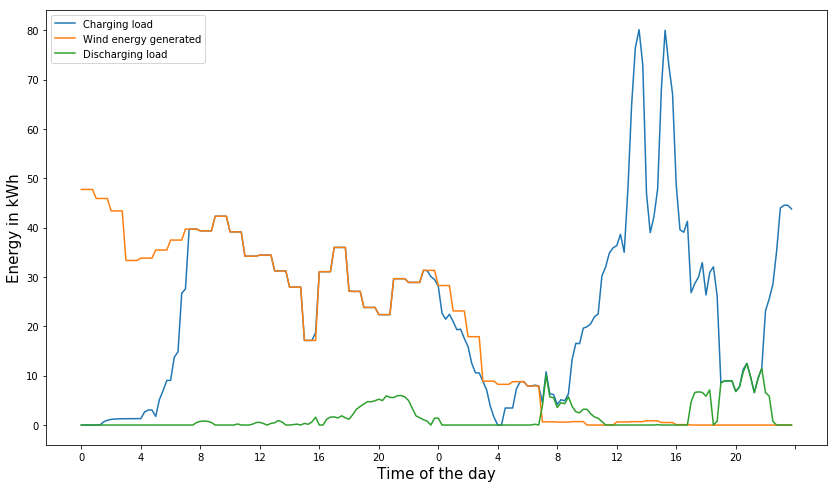

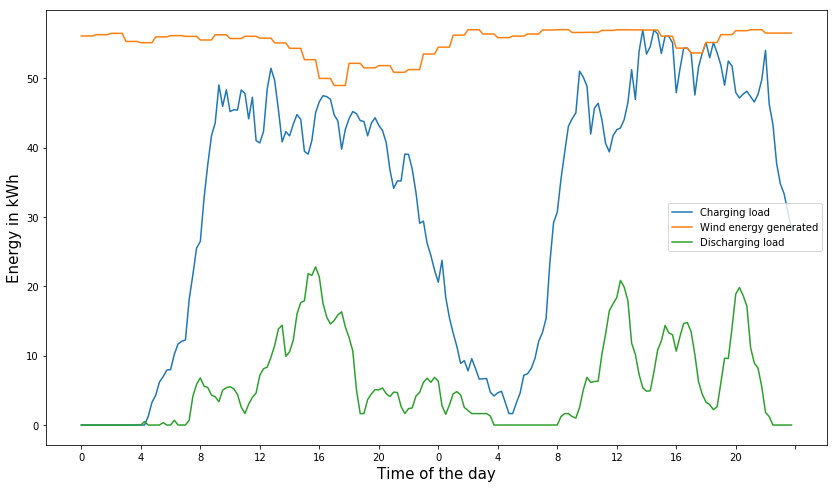

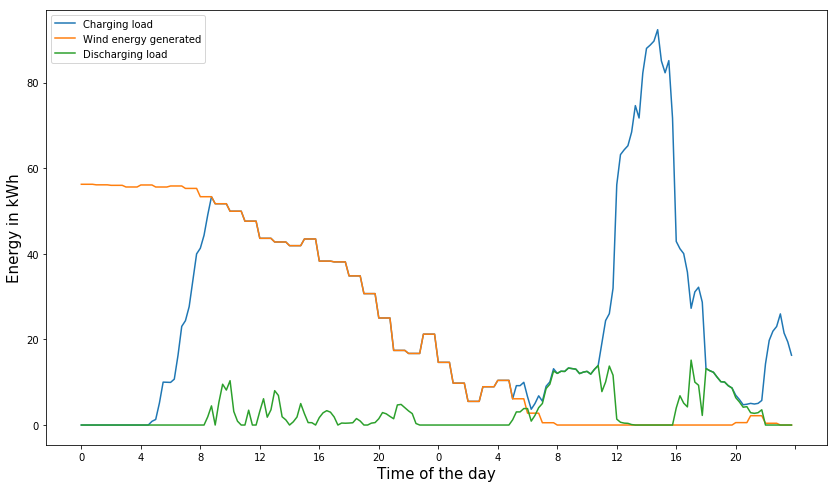

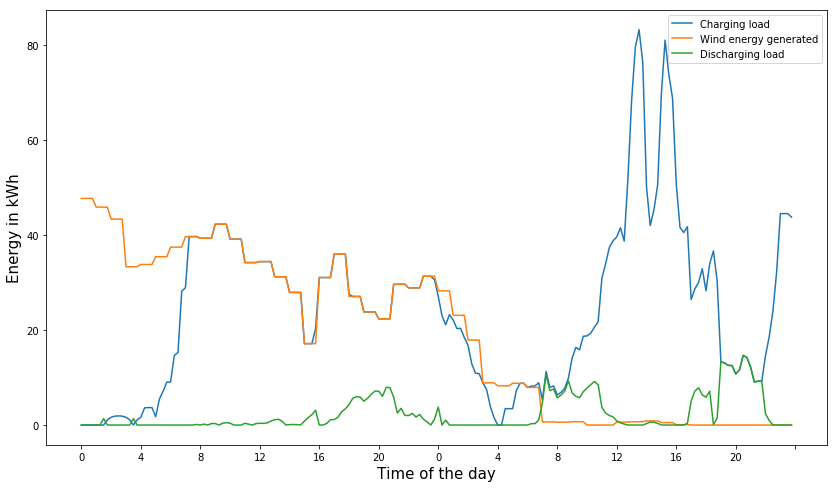

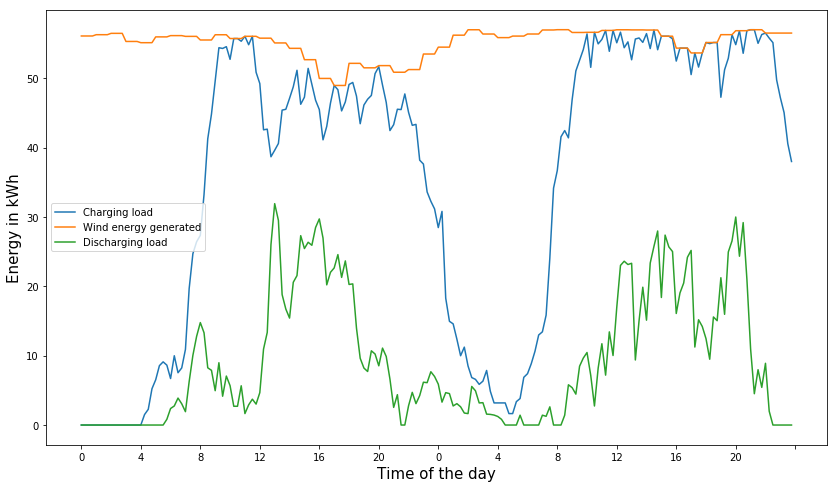

In [4]:
l=1
for delta in [0.1, 0.5, 0.9]:
    Simulate_biD_static(S=3, eta_v=1, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=2, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 86158, 96511
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 7889.65
9352.773664930632
ConsDC 1355.3818625584454
ConsDC 1355.3818625584454
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 5
Number of Vehicles 500
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 100
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [9093.7414412]
degradation cost:  [1381.062120295337]
exceeding consumption:  [4297.82812594577]
Wind curtailment:  [3278.6503346670784]
Total revenue:  4256.343605552499
load charge:  [11468.30109503713]
total consumption:  [11468.301095036884]
total Charge load:  [11468.30109503713]
total discharge:  [1356.32825880817

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 86158, 96511
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8137.02
9681.346202461202
ConsDC 1359.6037646354416
ConsDC 1359.6037646354437
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.1
Number of Days 5
Number of Vehicles 500
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 100
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [9093.7414412]
degradation cost:  [1439.1507819145365]
exceeding consumption:  [4316.109096320812]
Wind curtailment:  [3240.2148968735255]
Total revenue:  4270.886401929736
load charge:  [11529.239405282724]
total consumption:  [11529.239405282415]
total Charge load:  [11529.239405282724]
total discharge:  [1360.81295831

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 86158, 96511
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 9113.84
10013.299881008077
ConsDC 1402.115395053678
ConsDC 1402.115395053674
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.5
Number of Days 5
Number of Vehicles 500
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 100
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [9093.7414412]
degradation cost:  [1458.0143700123676]
exceeding consumption:  [4282.801210895776]
Wind curtailment:  [2650.6894281935943]
Total revenue:  4375.219408424742
load charge:  [12127.968618955852]
total consumption:  [12127.968618955567]
total Charge load:  [12127.968618955852]
total discharge:  [1546.984723259

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 86158, 96511
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
10419.01534522572
ConsDC 871.6065403900508
ConsDC 871.6065403900511
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 1
Number of Days 5
Number of Vehicles 500
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 100
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [9093.7414412]
degradation cost:  [1642.060097734427]
exceeding consumption:  [4336.949124833669]
Wind curtailment:  [2481.7008122212824]
Total revenue:  2536.2363867500535
load charge:  [11820.596294202434]
total consumption:  [11820.596294202143]
total Charge load:  [11820.596294202434]
total discharge:  [1198.992314

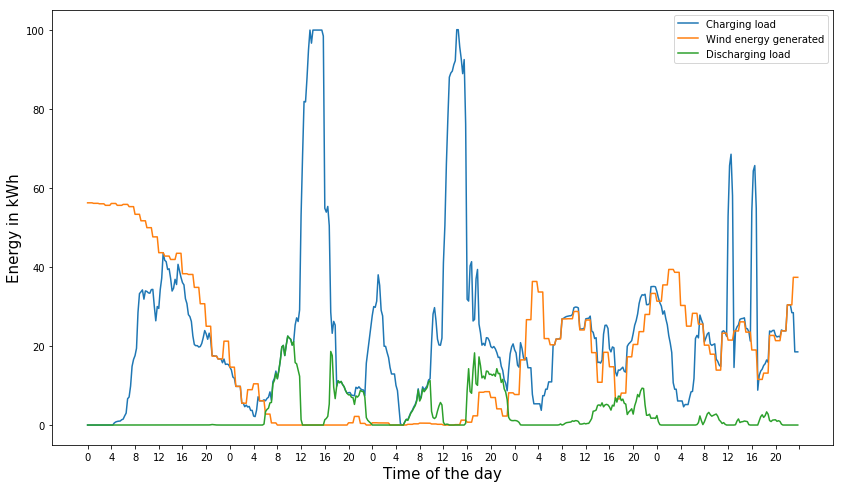

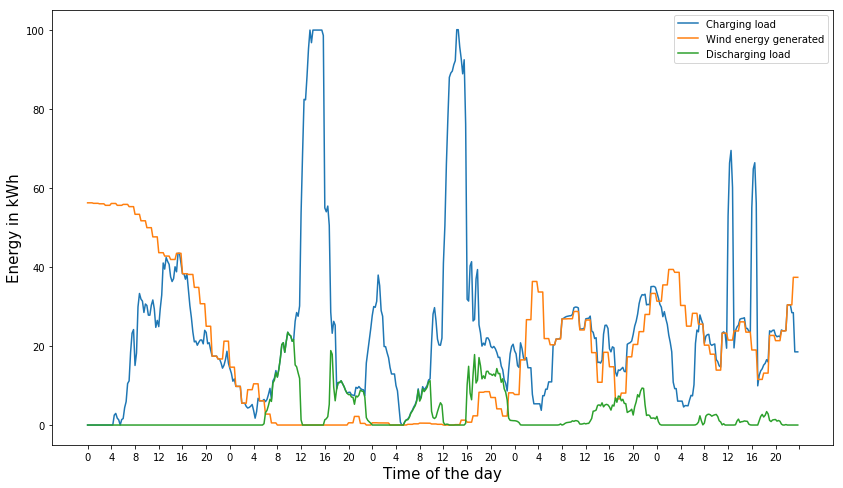

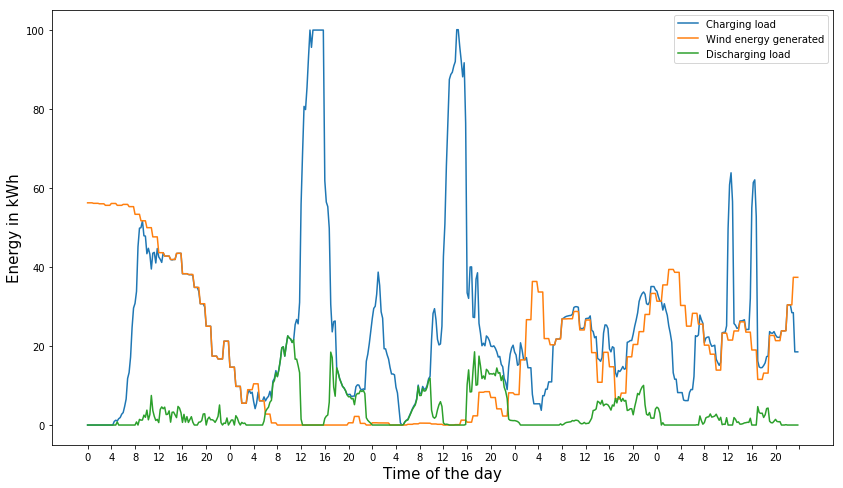

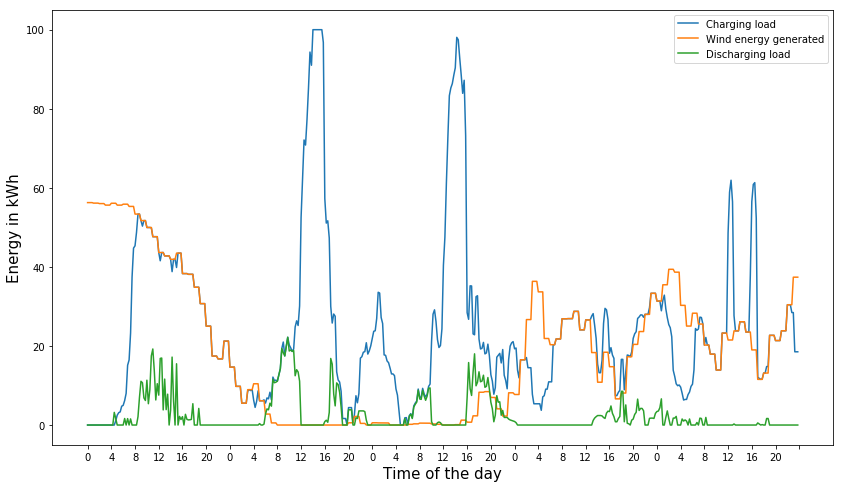

In [23]:
l=1
for delta in [0.05, 0.1, 0.5, 1]:
    Simulate_biD_static(S=1, eta_v=1, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=5, eta_DC_v=1,Trans_P = 100,timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 51951, 58398
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 6814.48
5775.786723255139
ConsDC 940.2906573226636
ConsDC 940.2906573226641
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [814.9215667386734]
exceeding consumption:  [3691.89688688013]
Wind curtailment:  [2497.7076041146825]
Total revenue:  3049.188285722245
load charge:  [6742.146781288111]
total consumption:  [6742.1467812881165]
total Charge load:  [6742.146781288111]
total discharge:  [940.5702504909581]


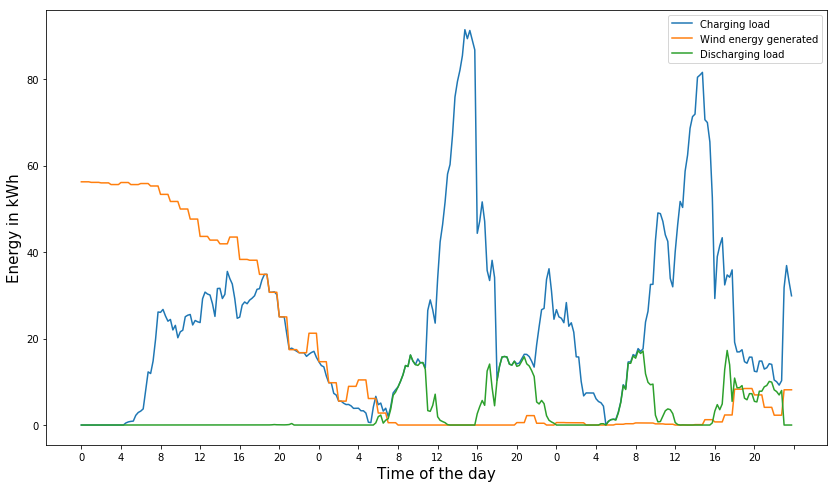

In [16]:
Simulate_biD_static(S=1, eta_v=1, delta1=1,NumberOfDays=3, delta2=0, delta3=1,eta_DC_v=1,Trans_P = 1000,timelim =60)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14096.2
ConsDC 0.41342950549304414
ConsDC 0.4134295054930357
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [144.95444522831633]
exceeding consumption:  [21.715505662665347]
Wind curtailment:  [2206.636979056628]
Total revenue:  [0.0]
load charge:  [1990.762756111531]
total consumption:  [1990.7627561115253]
total Charge load:  [1990.762756111531]
total discharge:  [0.41342950549304414]
total charging cost:  [71.

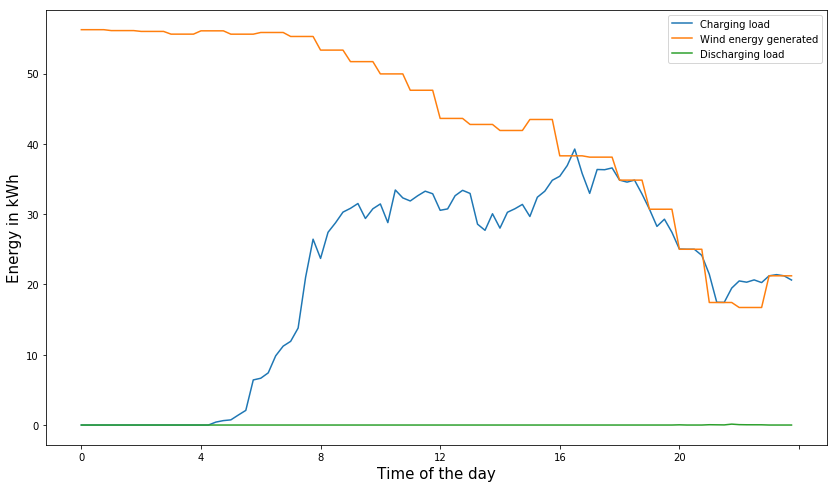

In [13]:
Simulate_biD_static(S=1, eta_v=1, delta1=1, delta2=0, delta3=1,eta_DC_v=1,Trans_P = 1000,timelim =60)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 51951, 58398
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 125061
ConsDC 0.005015403784147806
ConsDC 0.005015403784147806
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [399.22416683463587]
exceeding consumption:  [3727.518223252626]
Wind curtailment:  [2565.839365349131]
Total revenue:  [0.0]
load charge:  [5769.35071450728]
total consumption:  [5769.350714507287]
total Charge load:  [5769.35071450728]
total discharge:  [0.005015403784147806]
total charging cost:  [9

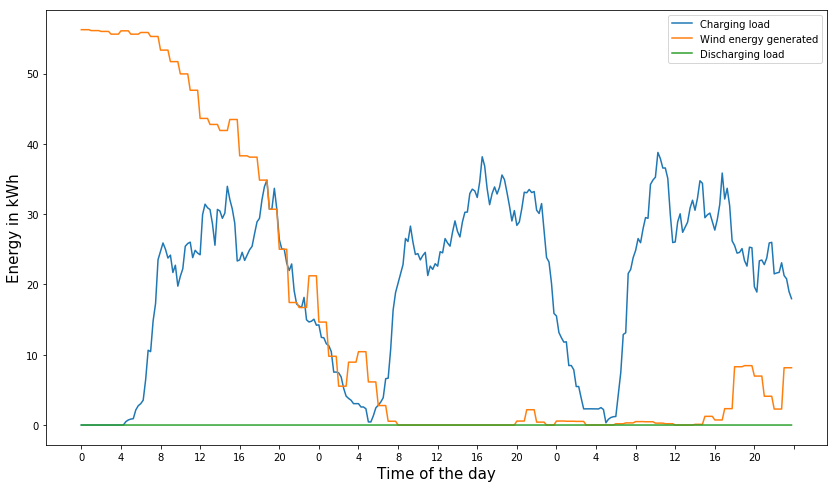

In [14]:
Simulate_biD_static(S=1, eta_v=1, delta1=1,NumberOfDays=3, delta2=0, delta3=1,eta_DC_v=1,Trans_P = 1000,timelim =60)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 1510.26
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 0.1
Delta2 0.1
Delta3 0.1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [145.2660159146907]
exceeding consumption:  [19.576879874613553]
Wind curtailment:  [2203.0039139681166]
Total revenue:  [8.140226568413448]
load charge:  [1991.8437659064975]
total consumption:  [1991.8437659064925]
total Charge load:  [1991.8437659064975]
total discharge:  [1.4944393004599843]
total charg

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 13996.4
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 0.1
Delta2 0.1
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [144.45467312169237]
exceeding consumption:  [47.09944329313186]
Wind curtailment:  [2232.0209166870936]
Total revenue:  [0.0]
load charge:  [1990.3493266060377]
total consumption:  [1990.3493266060343]
total Charge load:  [1990.3493266060377]
total discharge:  [0.0]
total charging cost:  [171.02308885531227]
total cost (charge cost - revenue):  [315.4777

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 0.1
Delta2 1
Delta3 0.1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [282.22713653243596]
exceeding consumption:  [410.8584878913684]
Wind curtailment:  [2103.619434604175]
Total revenue:  [2581.5955070045557]
load charge:  [2482.509853287193]
total consumption:  [2482.509853287196]
total Charge load:  [2482.509853287193]
total discharge:  [492.1605266811555]
total charging cost:  [1247.7868180942469]
total cost (cha

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14028.9
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 0.1
Delta2 1
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [144.87019960091848]
exceeding consumption:  [45.338612501089294]
Wind curtailment:  [2229.2130863591747]
Total revenue:  [5.792324687458867]
load charge:  [1991.396326141914]
total consumption:  [1991.396326141911]
total Charge load:  [1991.396326141914]
total discharge:  [1.046999535876103]
total charging cost:  [157.2639095847763]
total cost (charge cost

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 1513.5
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0.1
Delta3 0.1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [146.33365235252683]
exceeding consumption:  [0.0]
Wind curtailment:  [2184.0213496393194]
Total revenue:  [18.932845860941466]
load charge:  [1995.8484593031455]
total consumption:  [1995.848459303144]
total Charge load:  [1995.8484593031455]
total discharge:  [5.4991326971076875]
total charging cost:  [13.87834296314929]
total cost (charge cost - revenue

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14096.1
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0.1
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [144.9576644617459]
exceeding consumption:  [21.6390298325156]
Wind curtailment:  [2206.560503226478]
Total revenue:  [1.545998932034454]
load charge:  [1990.8166251548519]
total consumption:  [1990.8166251548485]
total Charge load:  [1990.8166251548519]
total discharge:  [0.4672985488142427]
total charging cost:  [71.41959756662207]
total cost (charge cost

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 1
Delta3 0.1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [235.4337359844208]
exceeding consumption:  [42.188525805071706]
Wind curtailment:  [1945.4422309935242]
Total revenue:  [1489.091712202379]
load charge:  [2272.017094811547]
total consumption:  [2272.0170948115465]
total Charge load:  [2272.017094811547]
total discharge:  [281.66776820550945]
total charging cost:  [119.35321960400393]
total cost (cha

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14101.5
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 1
Delta3 1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [145.04586169351575]
exceeding consumption:  [22.25062249207348]
Wind curtailment:  [2206.32630423529]
Total revenue:  [4.654262980346416]
load charge:  [1991.195118256784]
total consumption:  [1991.19511825678]
total Charge load:  [1991.195118256784]
total discharge:  [0.8457916507461791]
total charging cost:  [71.40223747095736]
total cost (charge cost - re

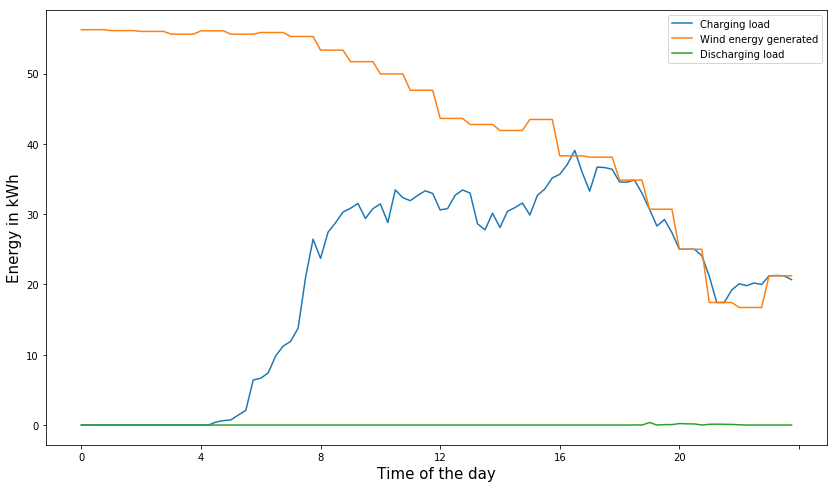

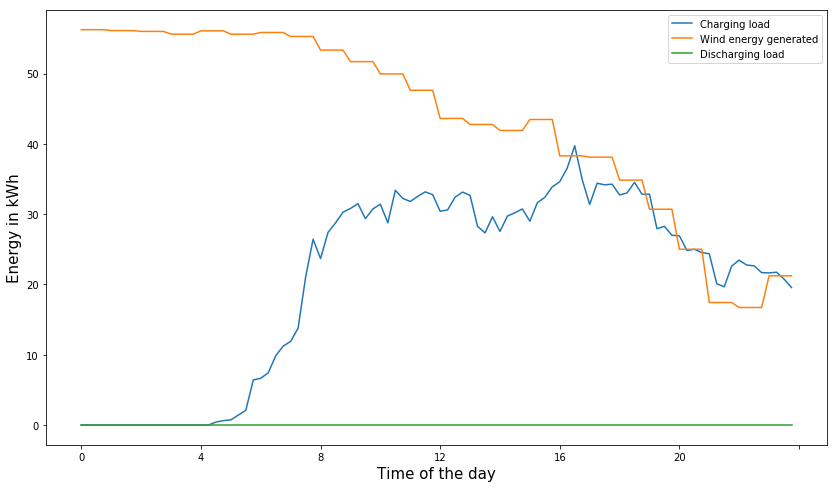

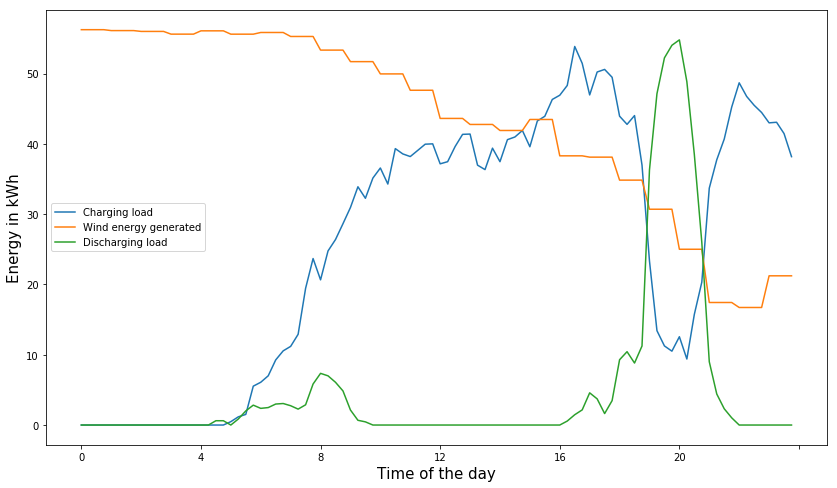

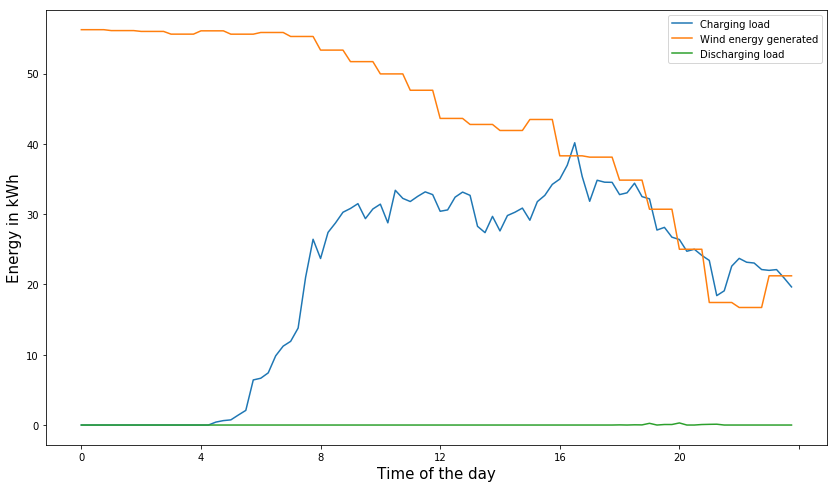

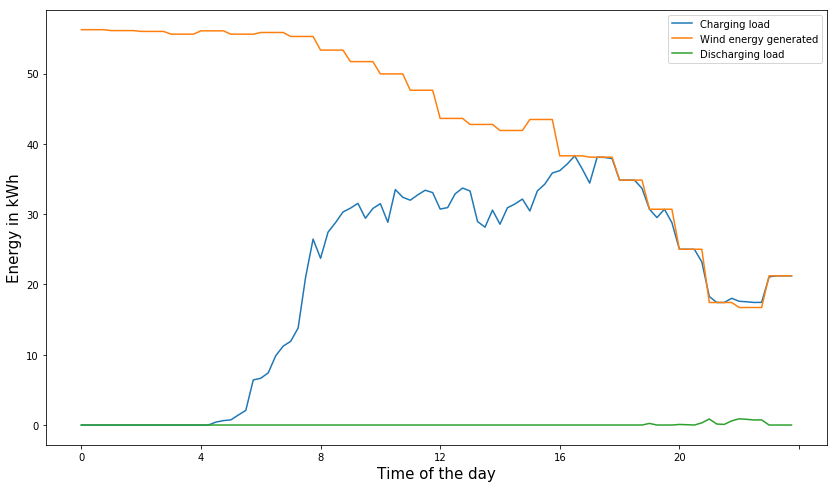

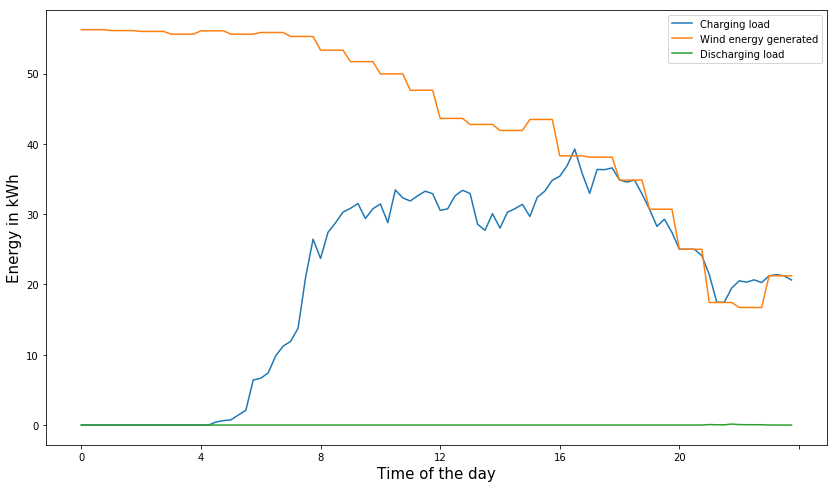

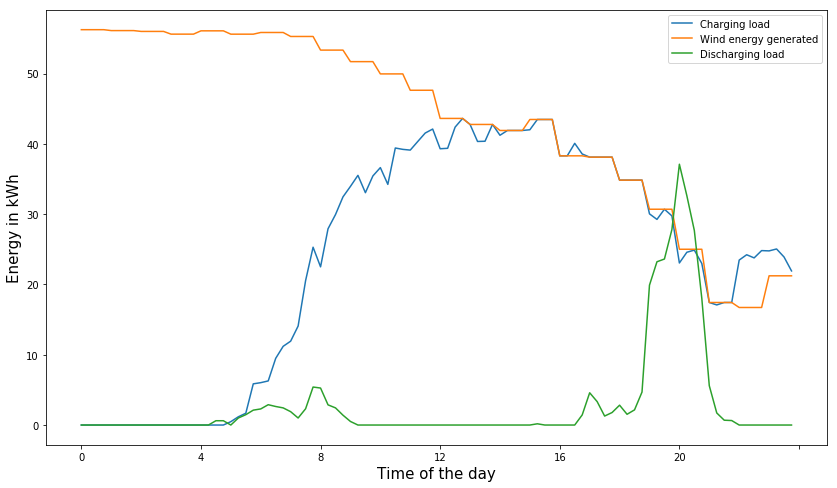

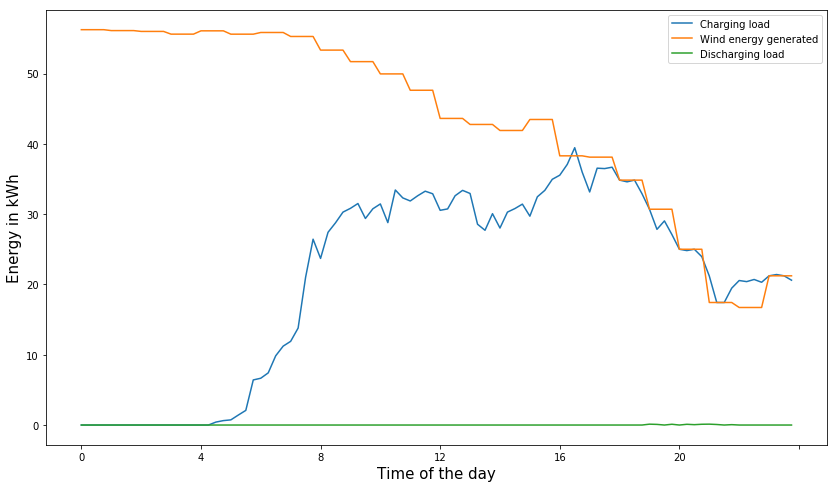

In [4]:
### let's tune the hyperparameters: delta2, delta3, delta
l=1
for delta1 in [0.1, 1]:
    for delta2 in [0.1, 1]:
        for delta3 in [0.1, 1]:
            Simulate_biD_static(S=1, eta_v=1, delta1=delta1, delta2=delta2, delta3=delta3,eta_DC_v=1,Trans_P = 1000,timelim =60)
            l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 76.1893
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 0
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [1065.9263517624856]
exceeding consumption:  [0.0]
Wind curtailment:  [1523.7859098759238]
Total revenue:  [449.0409251988043]
load charge:  [2653.4807669832153]
total consumption:  [2653.480766983221]
total Charge load:  [2653.4807669832153]
total discharge:  [363.91368318045556]
total charging cost:  [5.991488301165294]
total cost (charge cost - revenue):  

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 1512.54
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 0.1
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [146.17619047075138]
exceeding consumption:  [0.0]
Wind curtailment:  [2184.9214733939625]
Total revenue:  [15.506518042375586]
load charge:  [1995.3933495620422]
total consumption:  [1995.3933495620386]
total Charge load:  [1995.3933495620422]
total discharge:  [5.044022956004258]
total charging cost:  [15.506518042376038]
total cost (charge cost - revenue

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 7123.41
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 0.5
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [145.80571169355028]
exceeding consumption:  [4.687800614802151]
Wind curtailment:  [2189.6092740087643]
Total revenue:  [11.618504319951947]
load charge:  [1994.1609635228804]
total consumption:  [1994.160963522878]
total Charge load:  [1994.1609635228804]
total discharge:  [3.811636916842653]
total charging cost:  [26.87716337097647]
total cost (charge co

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 16652, 18778
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 60.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 26605.8
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1

Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta1 1
Delta2 0
Delta3 1.9
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1
Optimality is True

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [144.66941400455863]
exceeding consumption:  [32.313268394528336]
Wind curtailment:  [2217.2347417884903]
Total revenue:  [0.12105955974463459]
load charge:  [1990.371005576943]
total consumption:  [1990.3710055769407]
total Charge load:  [1990.371005576943]
total discharge:  [0.021678970905328214]
total charging cost:  [107.37031669552135]
total cost (char

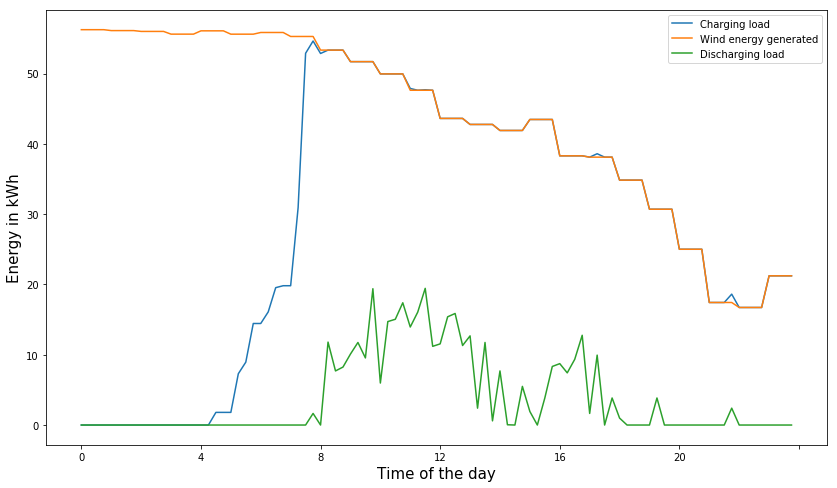

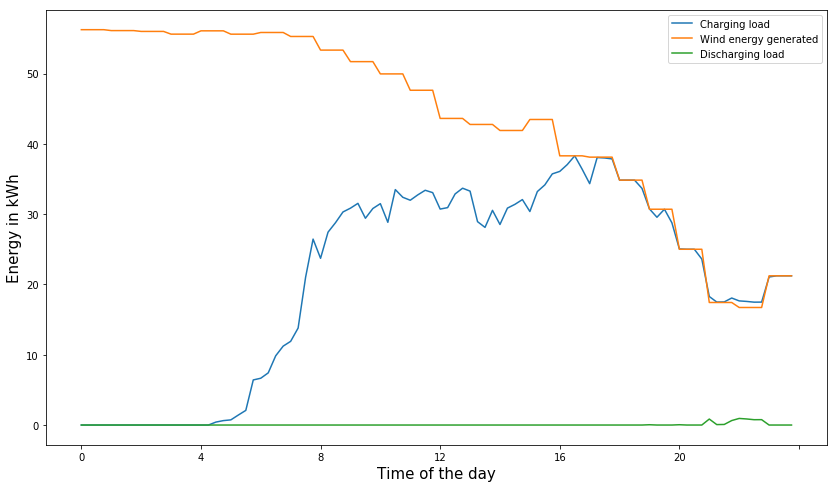

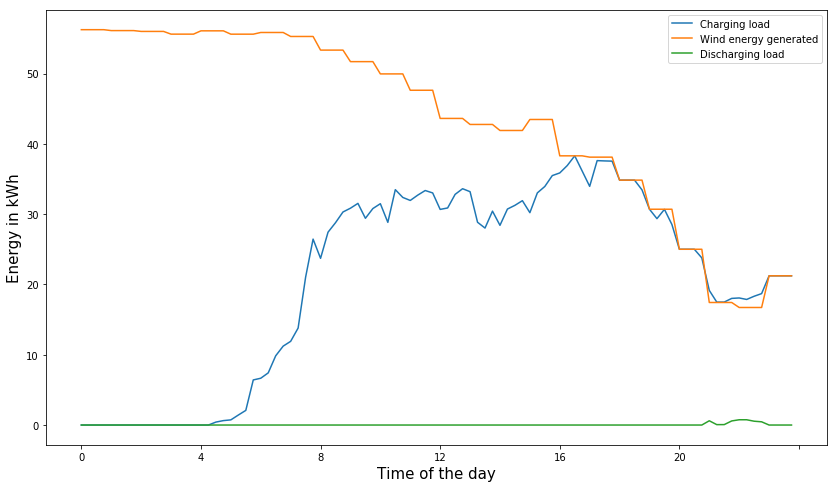

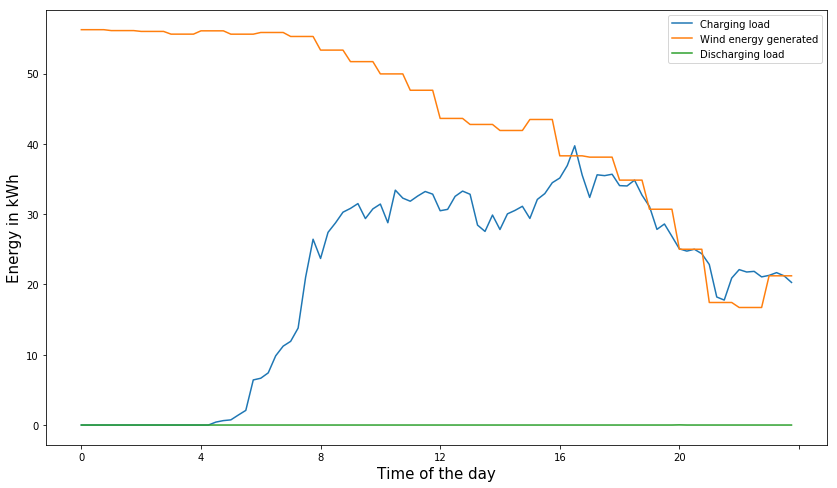

In [8]:
for delta3 in [0,0.1,0.5,0.9]:
    Simulate_biD_static(S=1, eta_v=1, delta1=1, delta2=0, delta3=delta3,eta_DC_v=1,Trans_P = 1000,timelim =60)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 11892, 14418
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 1
Delta 0.05
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0
eta_c 1
eta_dc 1
Trans_P 1000
Prob of V2G is 1

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [438.66584200986733]
exceeding consumption:  [0.0]
Wind curtailment:  [1763.4957980648992]
Total discharge:  [30.54999817943159]
load charge:  [2442.3250001140614]
total consumption:  [2442.325000114073]
total Charge load:  [2442.3250001140614]
total discharge:  [30.54999817943159]
total charging cost:  [0.0]
Charge cost per kWh is:  [0.0]
Run Time is:  [300.11949348449707]
Total n

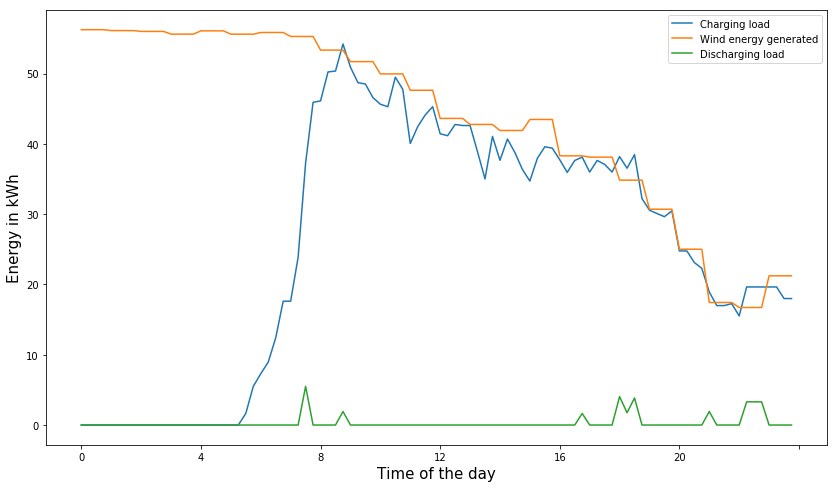

In [43]:
Simulate_biD_static(S=1,eta_v=1, delta2=0, eta_DC_v=1,Trans_P = 1000)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 22551, 30334
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 9247.98
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 1
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 0

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [879.9369693750002]
exceeding consumption:  [4269.837621499999]
Wind curtailment:  [1933.2044626999977]
Total discharge:  [0]
load charge:  [6944.299999999999]
total consumption:  [6944.299999999921]
total Charge load:  [6944.299999999999]
total discharge:  [0]
total charging cost:  [9151.319966210198]
Charge cost per kWh is:  [1.3178174857379867]
Run Time is:  [0.876457214355468

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 29683, 37466
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8949.22
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 1
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 0.5

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [980.7300382007888]
exceeding consumption:  [4311.776090640485]
Wind curtailment:  [1927.7504376999975]
Total discharge:  [277.4250017291214]
load charge:  [7241.3749956994325]
total consumption:  [7241.374995699362]
total Charge load:  [7241.3749956994325]
total discharge:  [277.4250017291214]
total charging cost:  [8637.65177132201]
Charge cost per kWh is:  [1.192819288664361

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 37101, 44884
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 1
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 1

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [1078.027680862731]
exceeding consumption:  [4346.278341956768]
Wind curtailment:  [1908.9726851999988]
Total discharge:  [544.2250012768881]
load charge:  [7534.774999106545]
total consumption:  [7534.774999106453]
total Charge load:  [7534.774999106545]
total discharge:  [544.2250012768881]
total charging cost:  [8069.958874074131]
Charge cost per kWh is:  [1.071028514458

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 22551, 30334
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8791.29
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 20
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 0

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [936.7162987500005]
exceeding consumption:  [4264.545701349999]
Wind curtailment:  [2250.7625425499987]
Total discharge:  [0]
load charge:  [6621.45]
total consumption:  [6621.449999999948]
total Charge load:  [6621.45]
total discharge:  [0]
total charging cost:  [8678.753799339294]
Charge cost per kWh is:  [1.3107029124042864]
Run Time is:  [0.6516609191894531]
Total number of 

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 30015, 37798
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8391.05
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 20
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 0.5

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [1243.7138671875007]
exceeding consumption:  [4311.462726349999]
Wind curtailment:  [1896.7845675499984]
Total discharge:  [288.70000000000005]
load charge:  [7282.174999999999]
total consumption:  [7282.174999999912]
total Charge load:  [7282.174999999999]
total discharge:  [288.70000000000005]
total charging cost:  [8072.889574253792]
Charge cost per kWh is:  [1.108582198897

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 37101, 44884
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 8160.02
Simulation Parameters are: 

min parking time 8.0
max parking time 40.0
number of Scenarios 1
Gamma 20
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0.2
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 1

Responses are: 

Total wind:  [4607.6668412]
degradation cost:  [1375.6122685211315]
exceeding consumption:  [4328.566425417671]
Wind curtailment:  [1887.3582675999992]
Total discharge:  [537.2500010914752]
load charge:  [7532.4]
total consumption:  [7532.399999999901]
total Charge load:  [7532.4]
total discharge:  [537.2500010914752]
total charging cost:  [7693.280084851874]
Charge cost per kWh is:  [1.0213584096505728]
Run Time is:  [23.71

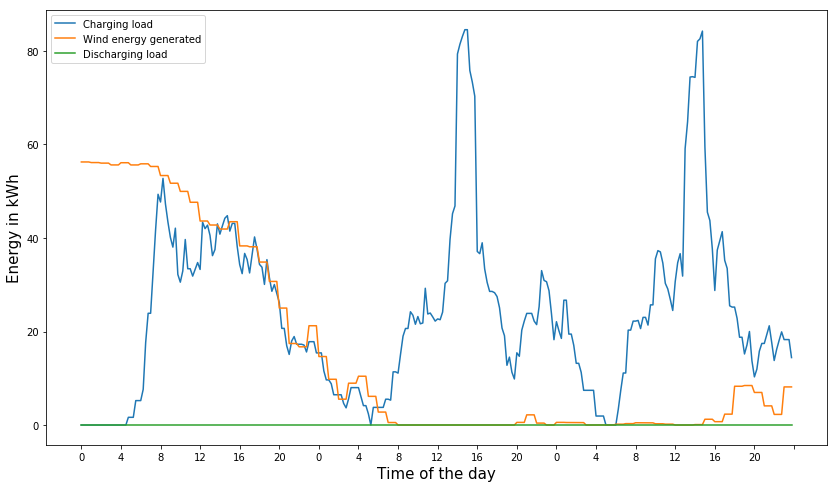

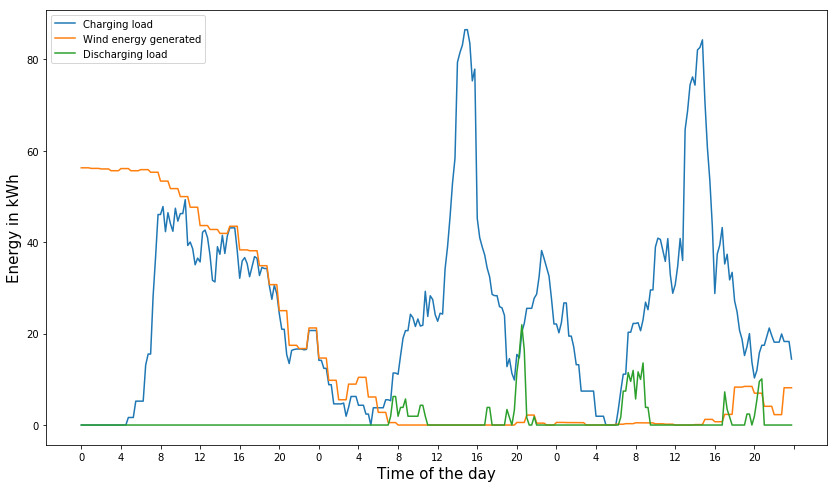

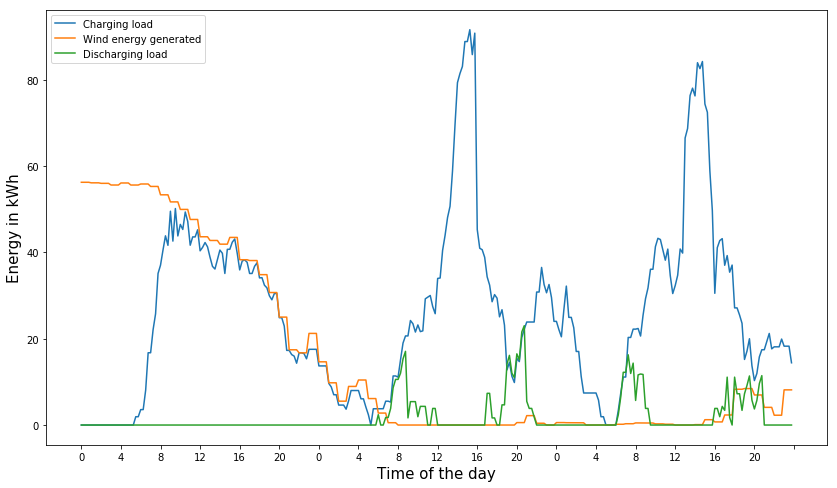

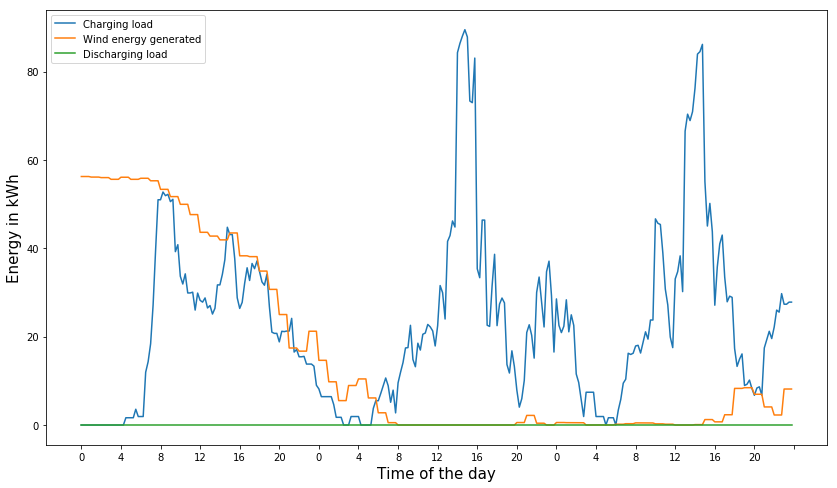

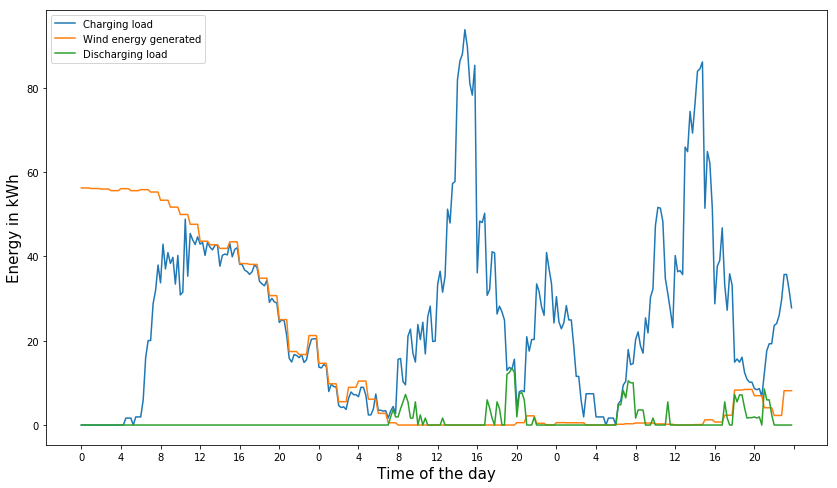

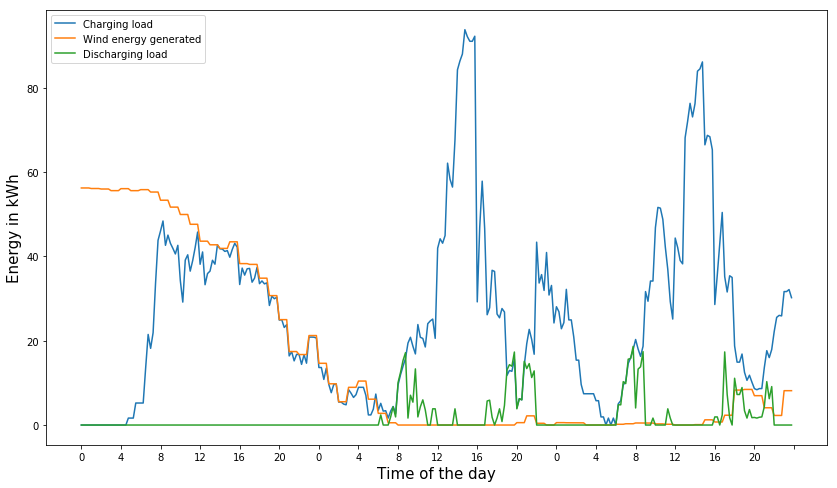

In [28]:
l=1
for gamma_v in [1,20]:
    for p in [0,0.5, 1]:
        Simulate_biD_static(low_Td=2, max_Td=10, eta_v =0.9, eta_DC_v = 0.9, p=p, Trans_P = 100, low_dl =0.75, high_dl=0.95, S=1, 
                        gamma_v=gamma_v, delta2=0.2, delta=0.05, NumberOfDays=3, NumberOfVehicles=100, intervalTime=0.25, Optimal=True, 
                        mipGap =2e-2, timelim =300, plan_int = 1, Day_of_Month=15)
        l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 22551, 30334
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 9247.98
4269.8376215
2674.4623785
9151.319966210202
0.0



Scenario 1 NumVar and NumConstr = 22446, 29825
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 3681.66
2279.662815902951
4781.76218500643
3584.520098917116
0.0



Scenario 2 NumVar and NumConstr = 22533, 30269
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 362.418
23.07274999999993

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 41326, 51868
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 7604.1
5177.978054991711
4626.629444999042
7363.637132796861
274.34250000000003



Scenario 1 NumVar and NumConstr = 41068, 51870
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 801.288
635.5561802883581
9402.848825000001
573.477632638463
156.645



Scenario 2 NumVar and NumConstr = 40490, 50965
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 203.487
0.02199999999995672
10782.2505010566

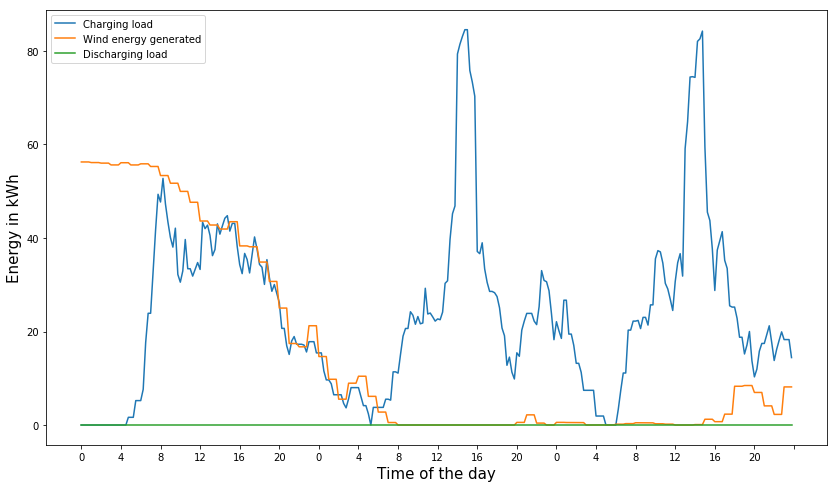

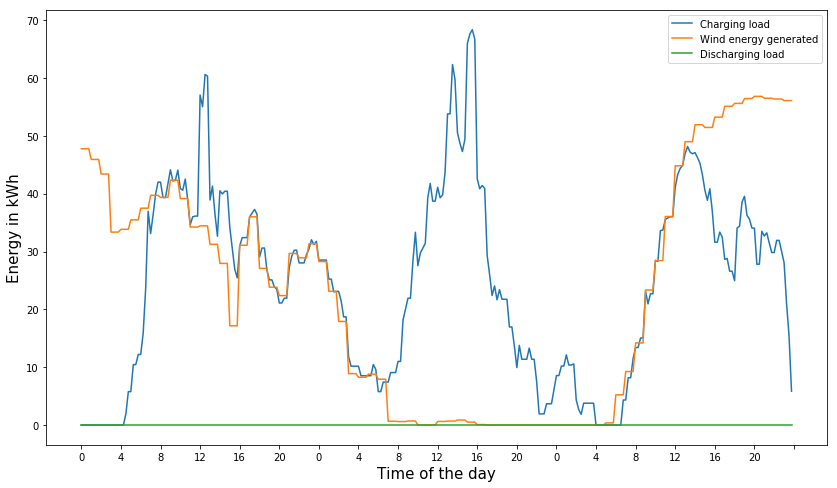

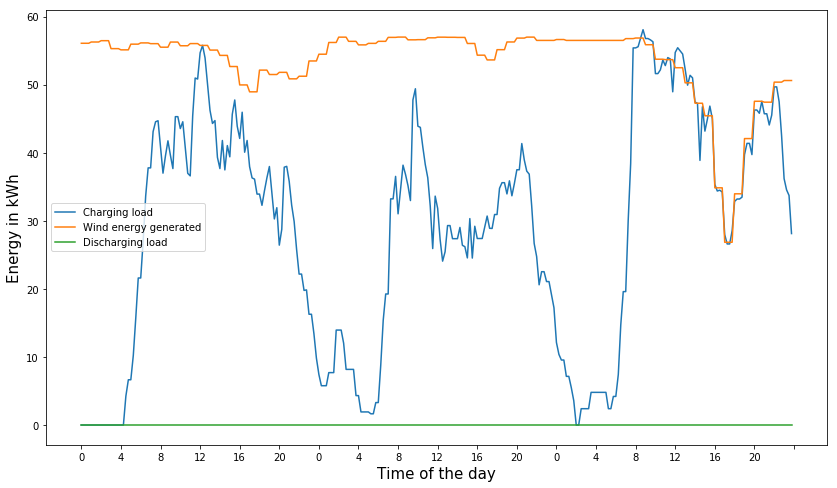

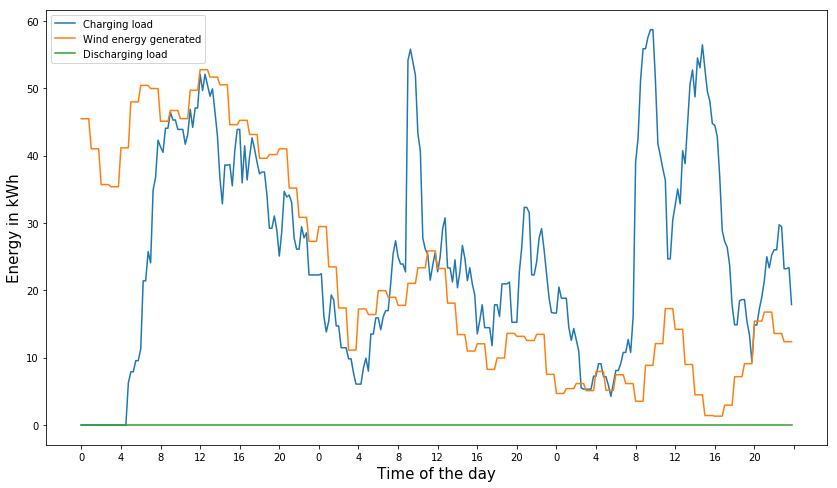

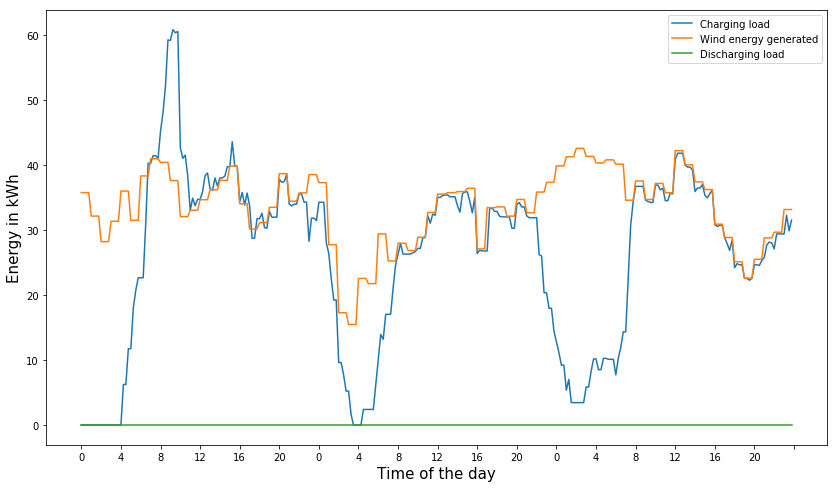

...

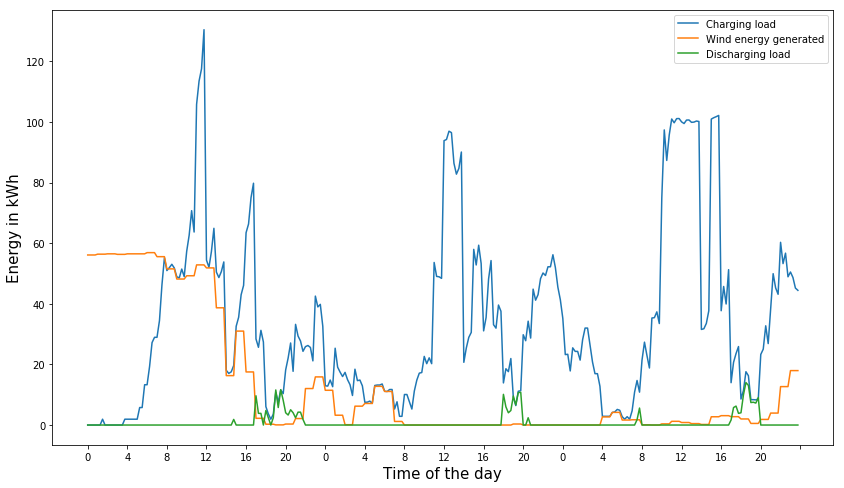

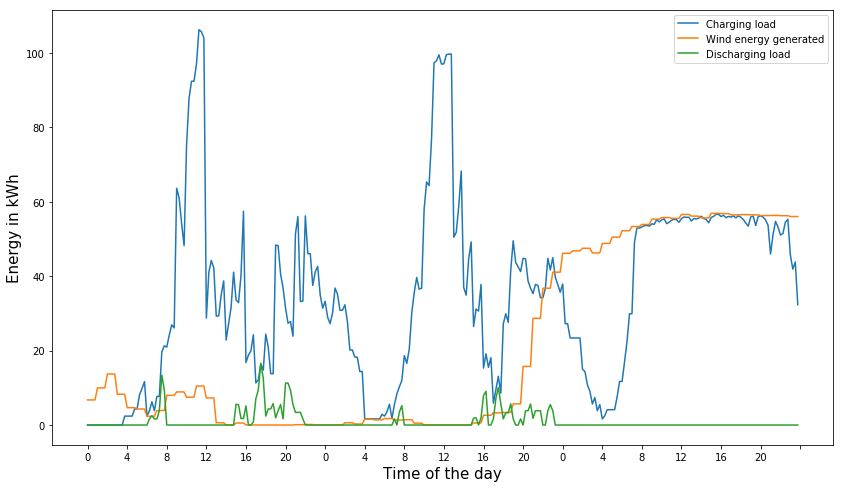

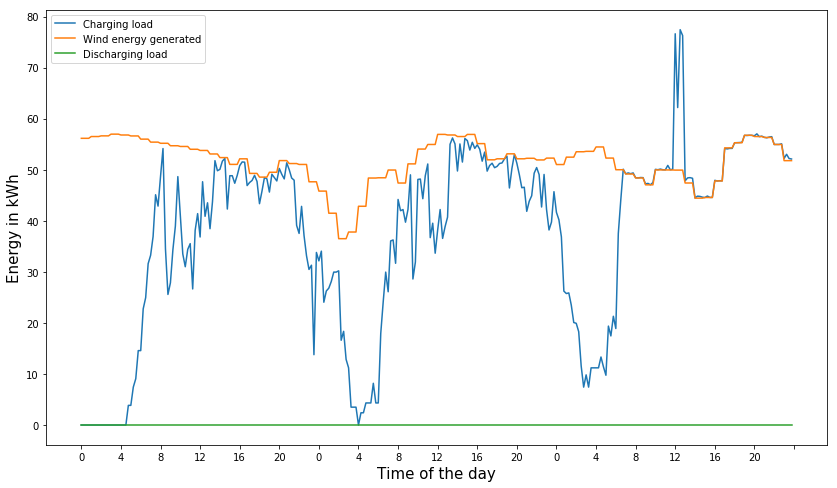

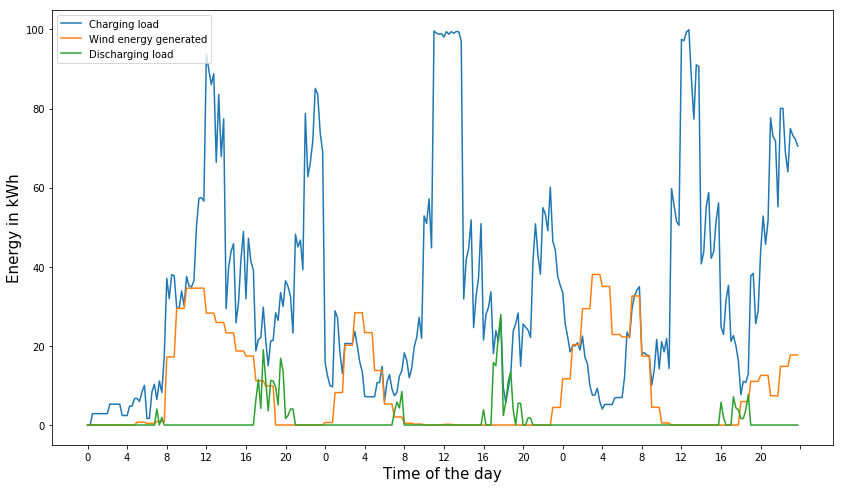

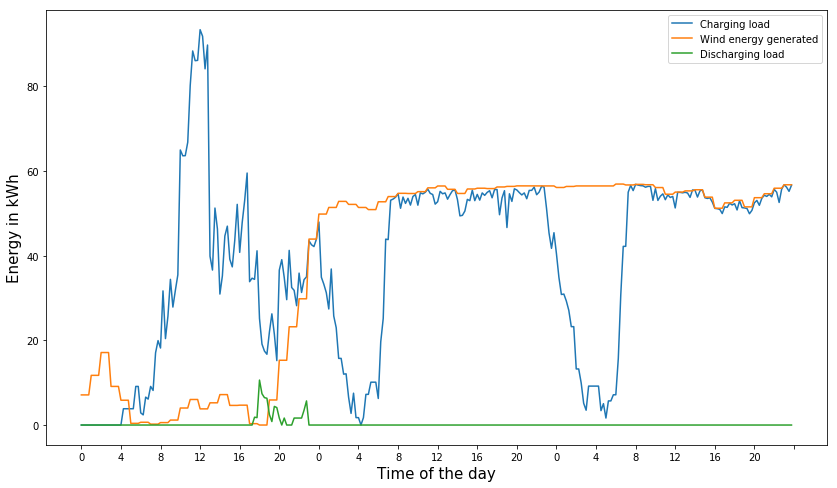

In [4]:
for gamma_v, Day_of_Month, p, n  in zip([1,20],[15, 18, 21], [0, 0.5, 1], [100, 140]): 
    Simulate_biD_static(low_Td=2, max_Td=10, eta_v =0.9, eta_DC_v = 0.9, p=p, Trans_P = 100, low_dl =0.75, high_dl=0.95, S=10, 
                        gamma_v=gamma_v, delta2=0.2, delta=0.05, NumberOfDays=3, NumberOfVehicles=n, intervalTime=0.25, Optimal=True, 
                        mipGap =2e-2, timelim =300, plan_int = 1, Day_of_Month=Day_of_Month)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 25137, 32920
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 50.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 9151.68
1      62.0
2      70.0
3      69.0
4      86.0
5      89.0
6      20.0
7      59.0
8      50.0
9      41.0
10     55.0
11     49.0
12     73.0
13     71.0
14     70.0
15     59.0
16     63.0
17     50.0
18     81.0
19     53.0
20     51.0
21     65.0
22     82.0
23     65.0
24     49.0
25     58.0
26     59.0
27     49.0
28     68.0
29     57.0
30     55.0
       ... 
271    47.0
272    92.0
273    59.0
274    53.0
275    86.0
276    78.0
277    59.0
278    36.0
279    38.0
280    58.0
281    41.0
282    28.0
283    74.0
284    69.0
285    50.0
286    82.0
287    45.0
288    58.0
289    47.0
290    47.0
291    58.0
292    78.0
293    93.0
294    40.0
295    91.0
296    78.0
297    50.0
298    49.0
299    34.0
300 

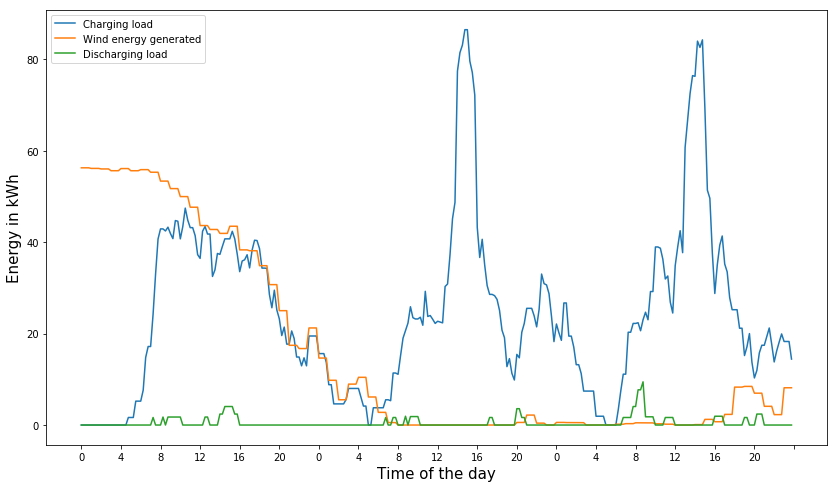

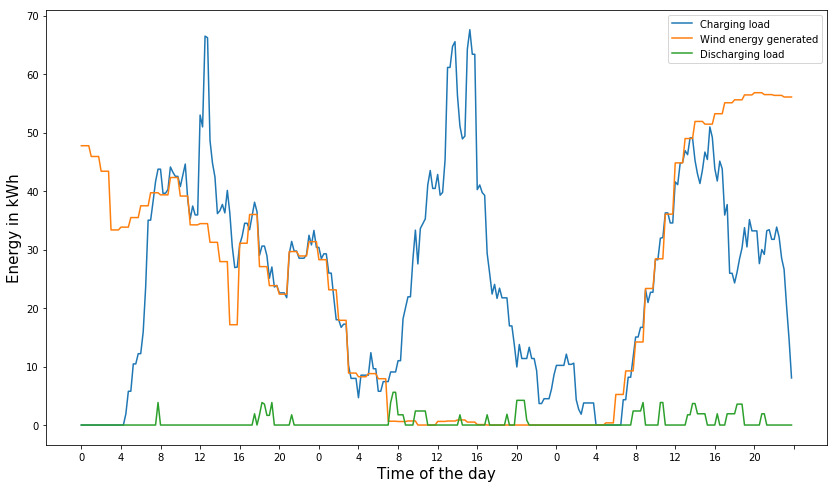

In [111]:
Simulate_biD_static(NumberOfDays=3,S=2, delta2=0,p=0.2, mipGap=2e-2, timelim=50, intervalTime=1/4)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 33030, 43943
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 50.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 9147.73
IS:  16.810238322005056
DL:  28.282172026049743
74 27
4312.664908800001
2705.7184245333337
9052.631487745257



Scenario 1 NumVar and NumConstr = 32415, 43293
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 50.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimization ended with status 9
IS:  21.299199294568236
DL:  43.455612145990884
96 79
2367.184257585015
4602.165741333334
4087.7510795010458
Simulation Parameters are: 

min parking time 12.0
max parking time 60.0
number of Scenarios 2
Gamma 1
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2

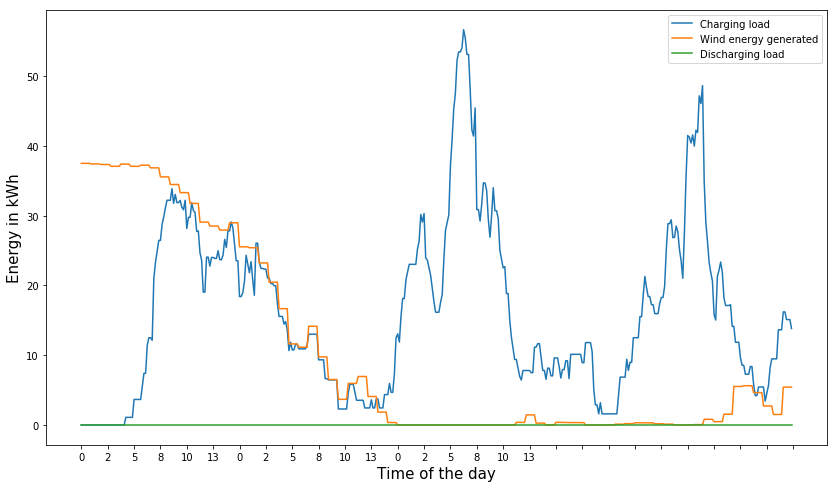

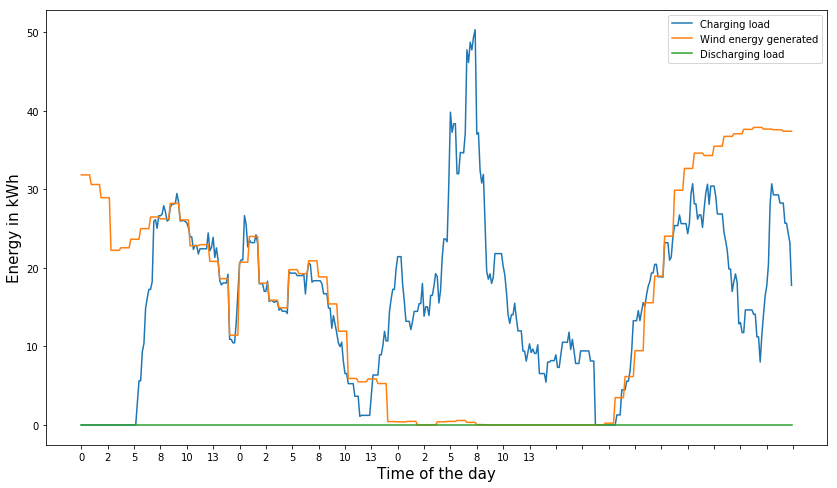

In [86]:
### what if decision intervals are 10 minutes
Simulate_biD_static(NumberOfDays=3,S=2, delta2=0,p=0, mipGap=5e-3, timelim=50, intervalTime=1/6)

288 72


C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


IS 1      18.041681
2      13.004586
3       7.824351
4      19.277161
5      14.513198
6      17.216784
7      12.910323
8      10.363288
9       4.682078
10      3.054338
11     24.397807
12     13.934156
13      5.855940
14     22.112723
15     12.125931
16     21.149358
17     15.117376
18      9.373590
19     24.004995
20     17.998594
21      4.637211
22      7.429607
23     24.477612
24     16.073622
25     14.425224
26     13.414422
27     15.363547
28      2.475011
29     15.361444
30     18.411345
         ...    
271    13.763092
272    14.811885
273    20.267789
274    19.161224
275    20.975516
276    14.047254
277    19.861191
278     6.213282
279    21.814987
280     6.876946
281     7.238676
282    48.387941
283    11.415549
284    14.094562
285     8.784537
286     1.650246
287    11.012088
288     4.551417
289     5.273609
290    19.319720
291    11.338282
292    43.397891
293     1.452595
294     6.612328
295     5.953830
296     5.086081
297     9.862518
298    37.3

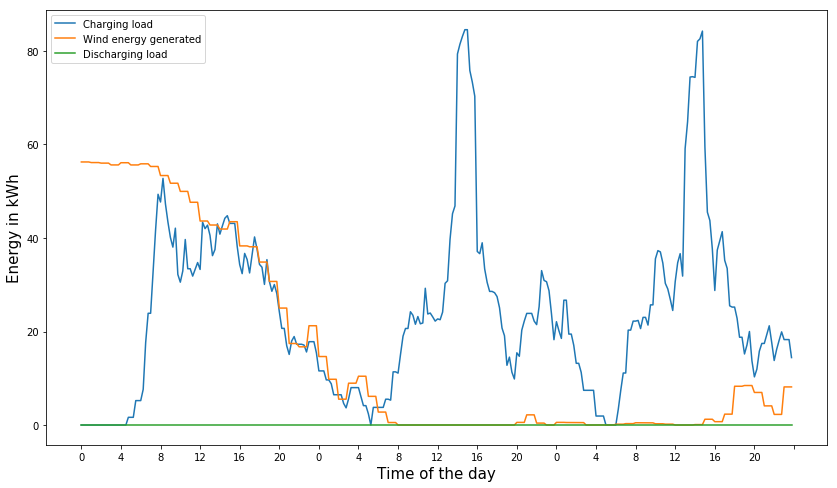

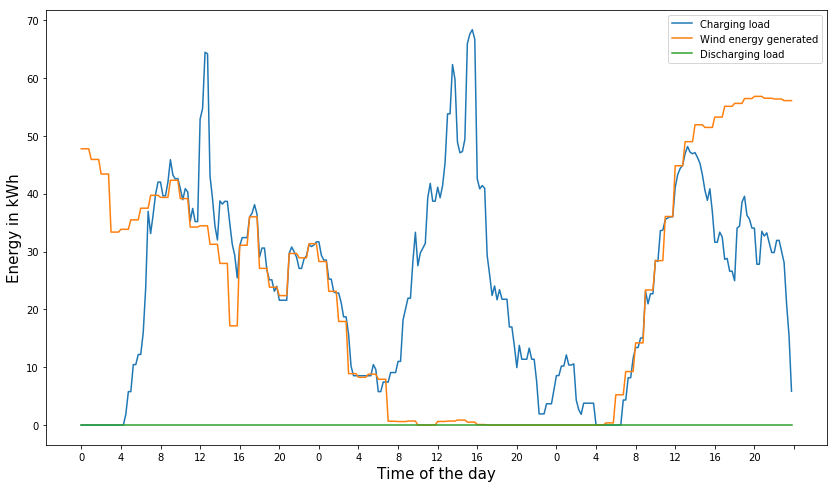

In [21]:
Simulate_biD_static(NumberOfDays=3,S=2, delta2=0,p=0, mipGap=5e-3, timelim=20)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Scenario 0 NumVar and NumConstr = 29437, 37220



Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 50.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Scenario 1 NumVar and NumConstr = 29640, 37019



Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 50.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Simulation Parameters are: 

min parking time 8
max parking time 40
number of Scenarios 2
Gamma 1
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75
Max desired level 0.95
Delta2 0
eta_c 0.9
eta_dc 0.9
Trans_P 100
Prob of V2G is 0.5

Responses are: 

Total wind:  [4607.6668412, 6724.626688]
degradation cost:  [1035.3684286234356, 1051.8532425000005]
exceeding consumption:  [4313.691497913021, 2287.9300169999997]
Wind curtailment:  [1900.5458376999993, 1905.84

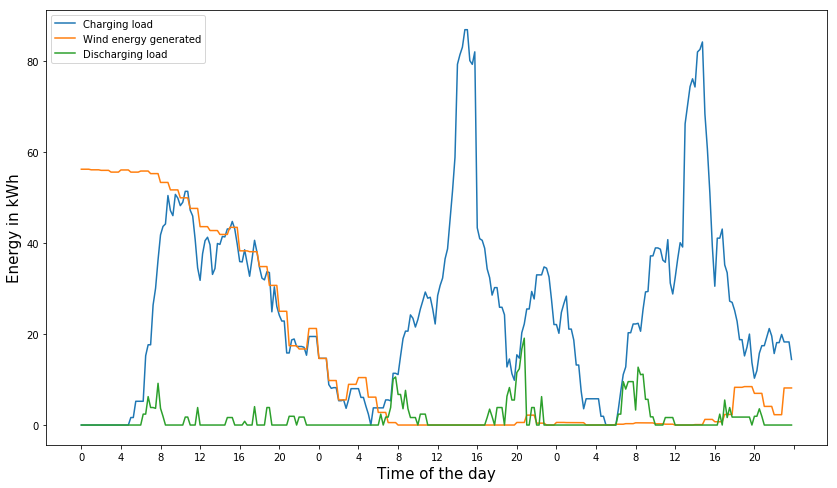

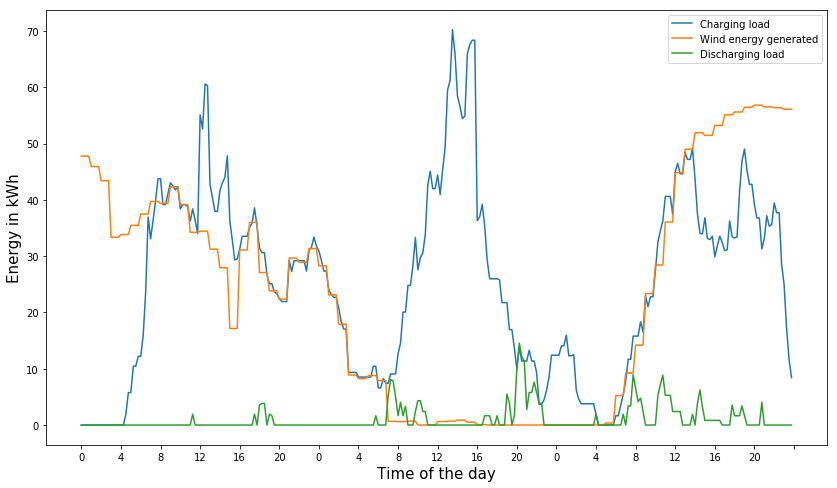

In [46]:
Simulate_biD_static(NumberOfDays=3,S=2, delta2=0,p=0.5, mipGap=2e-2, timelim=50)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 22551, 24221
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 22569, 24235
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 22983, 24658
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 22926, 24610
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 22119, 23867
C

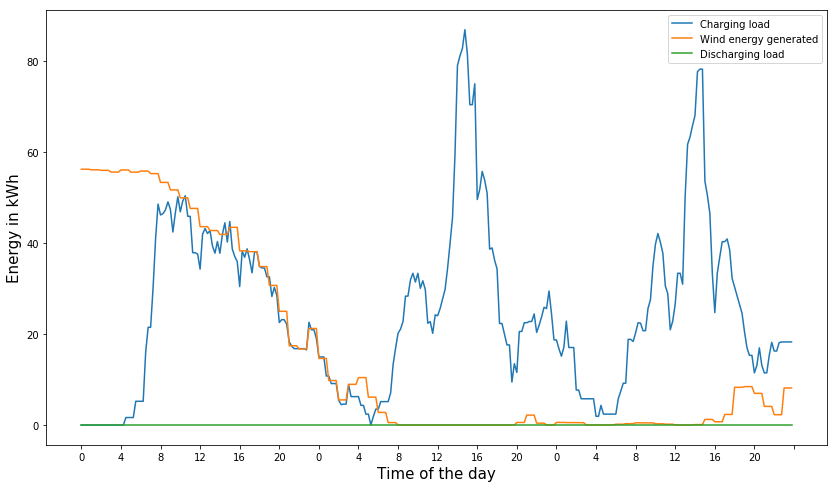

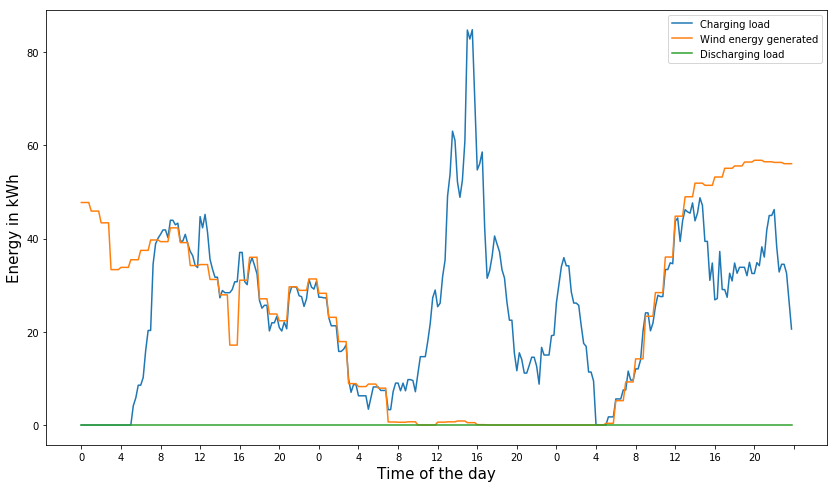

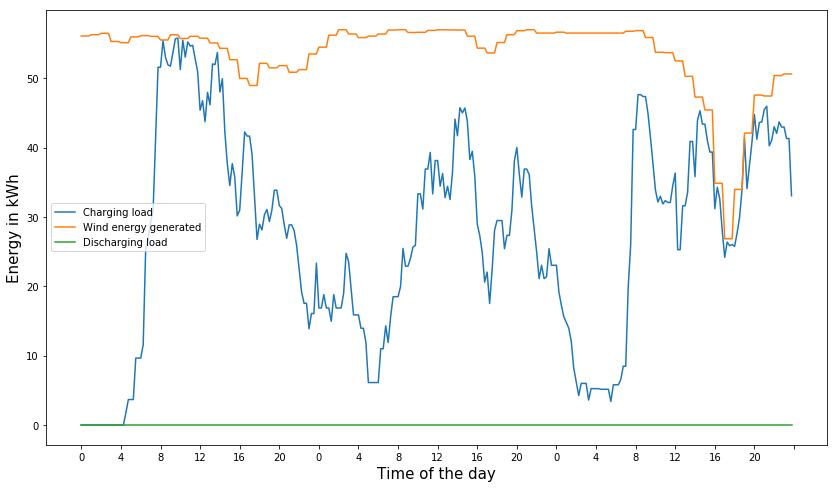

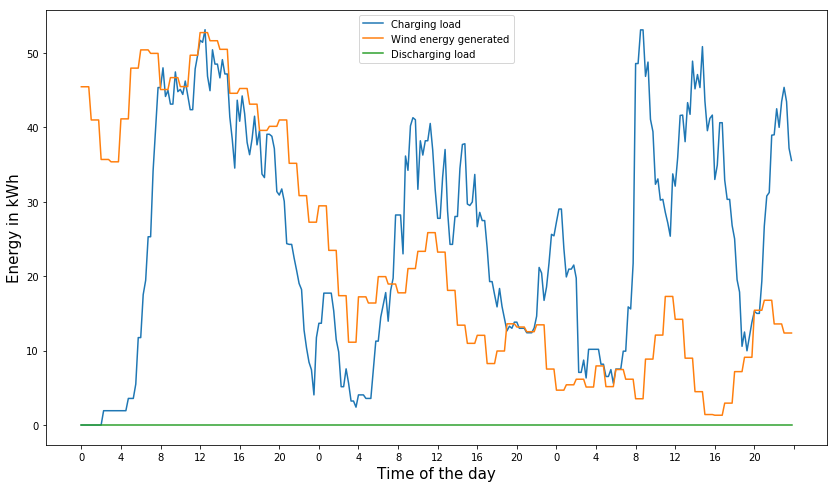

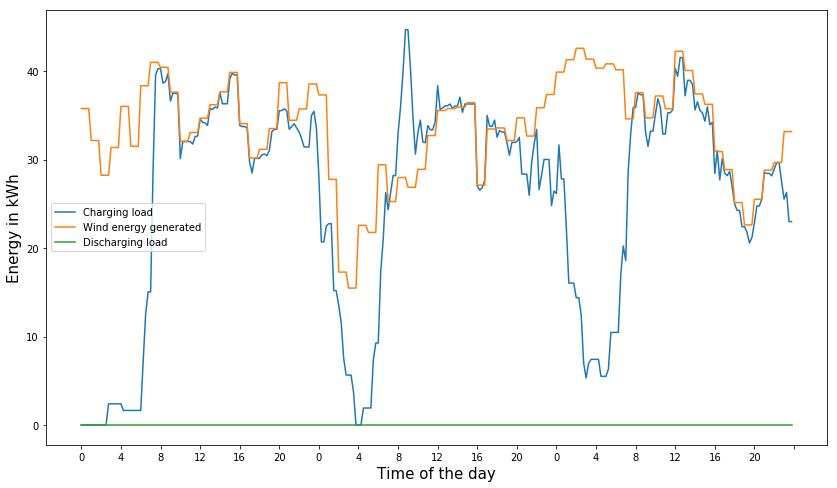

In [8]:
### This should be the same as UniD
Simulate_biD_static(NumberOfDays=3,S=5, delta2=0,p=0, mipGap=5e-3)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 29689, 34156
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Simulation Parameters are: 

min parking time 8
max parking time 40
number of Scenarios 1
Gamma 1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
      ..
271    1
272    1
273    1
274    1
275    1
276    1
277    1
278    1
279    1
280    1
281    1
282    1
283    1
284    1
285    1
286    1
287    1
288    1
289    1
290    1
291    1
292    1
293    1
294    1
295    1
296    1
297    1
298    1
299    1
300    1
Length: 300, dtype: int64
Delta 0.05
Number of Days 3
Number of Vehicles 300
Optimality True
Min desired level 0.75


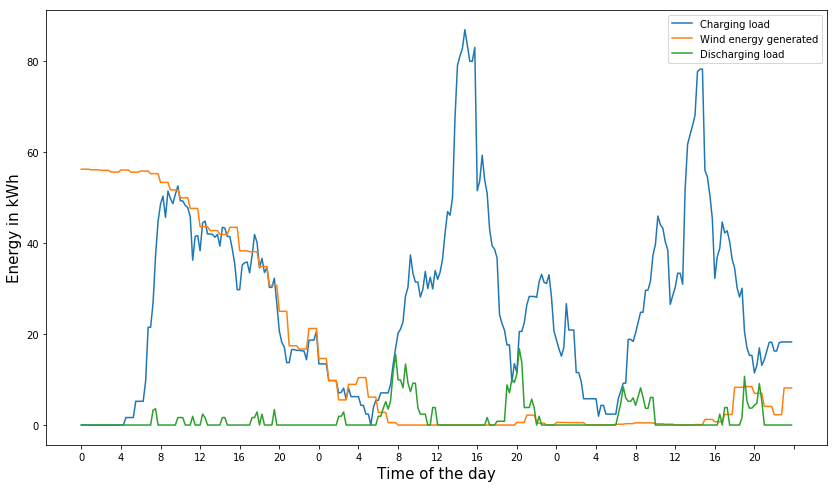

In [5]:
Simulate_biD_static(NumberOfDays=3,S=1, delta2=0,p=0.5)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



NumVar and NumConstr = 37101, 44375
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Simulation Parameters are: 

min parking time 8
max parking time 40
number of Scenarios 1
Gamma 1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
      ..
271    1
272    1
273    1
274    1
275    1
276    1
277    1
278    1
279    1
280    1
281    1
282    1
283    1
284    1
285    1
286    1
287    1
288    1
289    1
290    1
291    1
292    1
293    1
294    1
295    1
296    1
297    1
298    1
299    1
300    1
Length: 300, dtype: int64
Delta 0.05
Number of Days 3
Number of Vehic

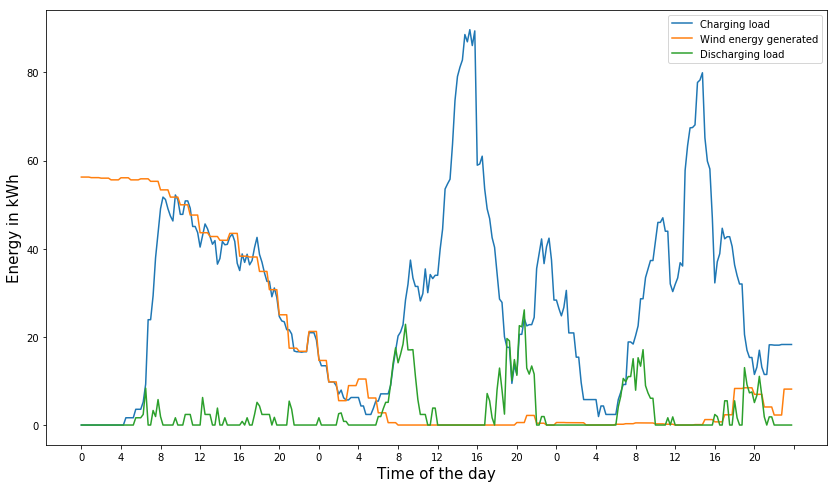

In [4]:
Simulate_biD_static(NumberOfDays=3,S=1, delta2=0,p=1)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 37101, 44375
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 37131, 44684
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 37821, 45415
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 37726, 45435
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 36381, 43739
Chang

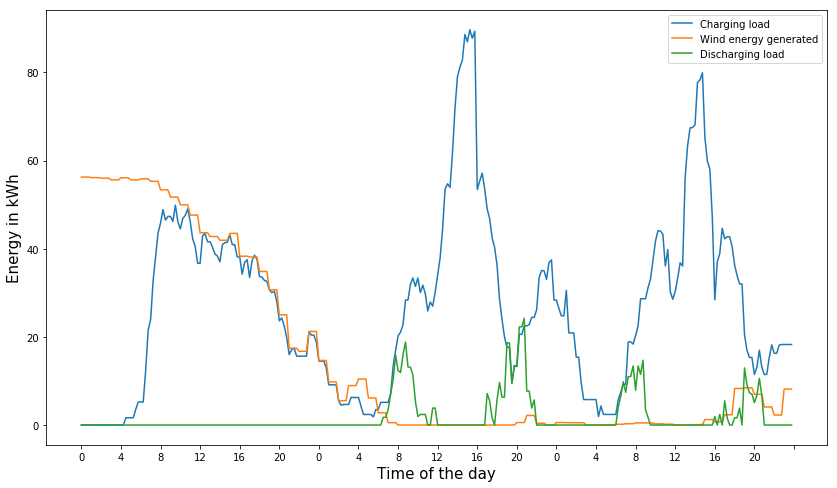

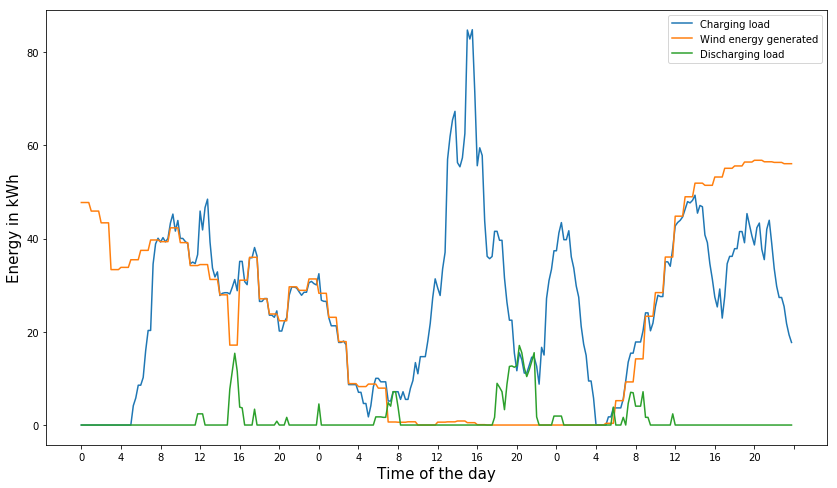

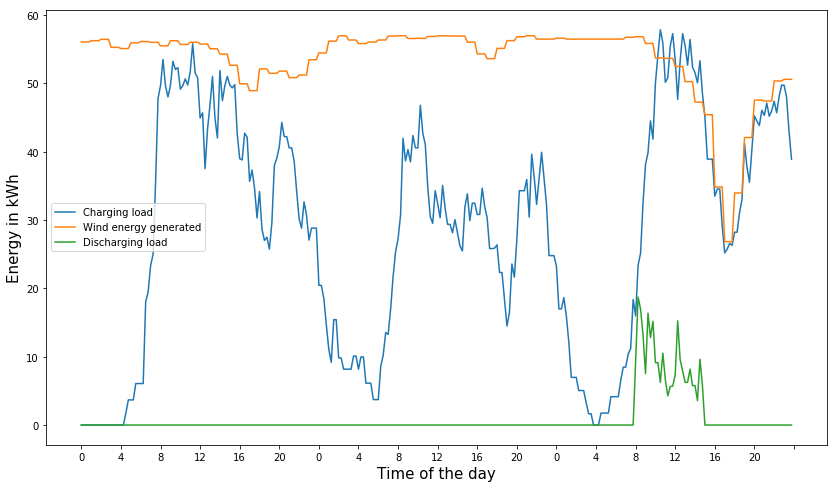

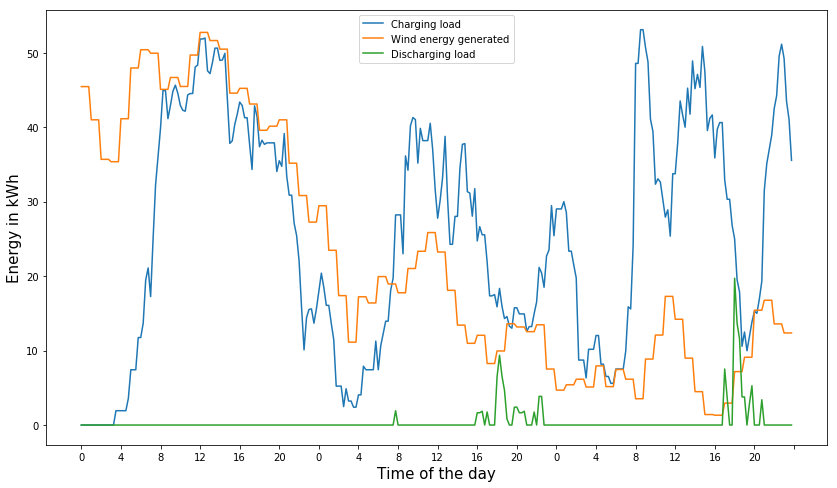

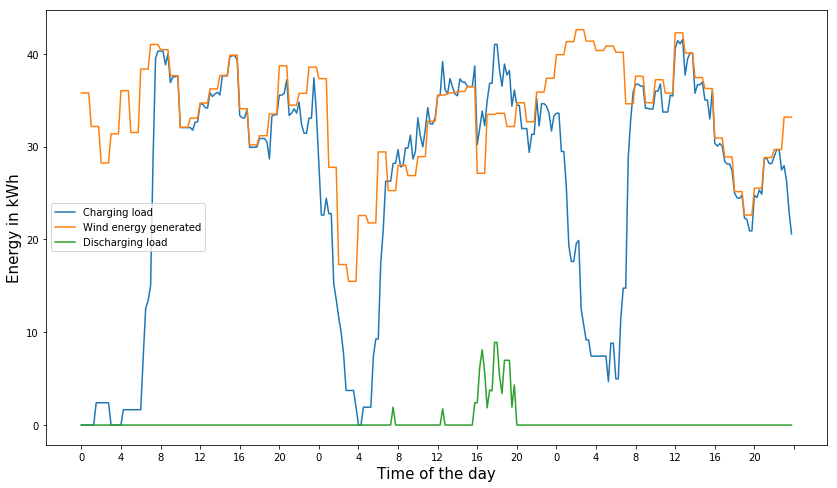

In [20]:
### delta2 = 0.2
Simulate_biD_static(NumberOfDays=3,S=5, delta2=0.2)

In [ ]:
### delta2 = 0.2
Simulate_biD_static(NumberOfDays=3,S=5, delta2=0)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 37101, 44375
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0


C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 61530, 74096
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 300.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 74096 rows, 61530 columns and 238992 nonzeros
Variable types: 13274 continuous, 48256 integer (48256 binary)
Coefficient statistics:
  Matrix range     [7e-01, 4e+00]
  Objective range  [5e-02, 1e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e-02, 1e+02]
Presolve removed 42314 rows and 23677 columns (presolve time = 9s) ...
Presolve removed 41979 rows and 22971 columns
Presolve time: 9.28s
Presolved: 32117 rows, 38559 columns, 129207 nonzeros
Variable types: 2088 continuous, 36471 integer (31561 binary)
Found heuristic solution: objective 19893.929326
Found heuristic solution: objective 15916.544325
Found heuristic solution: objective 15685.713240

Root simplex log...

Iteration    Objective       Primal Inf.    Dua

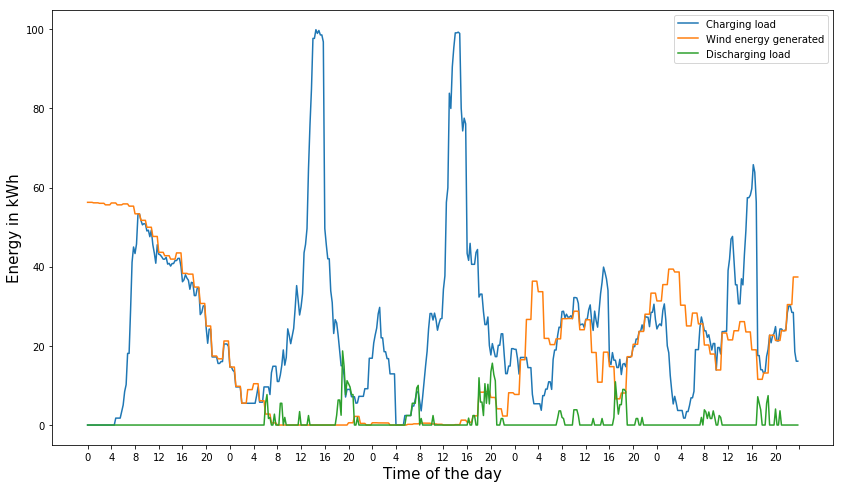

In [12]:
###0.5 price 

Simulate_biD_static(NumberOfDays=5)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 61530, 74096
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimize a model with 74096 rows, 61530 columns and 238992 nonzeros
Variable types: 13274 continuous, 48256 integer (48256 binary)
Coefficient statistics:
  Matrix range     [7e-01, 4e+00]
  Objective range  [5e-02, 7e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e-02, 1e+02]
Presolve removed 42314 rows and 24517 columns (presolve time = 8s) ...
Presolve removed 41979 rows and 22691 columns
Presolve time: 7.64s
Presolved: 32117 rows, 38839 columns, 129497 nonzeros
Variable types: 2370 continuous, 36469 integer (31559 binary)
Found heuristic solution: objective 15340.768837

Root simplex log...

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.2163674e+02   4.774225e+03   0.000000e+00      8s
   20864    5.50

H    0     0                    8282.1162374 6945.07001  16.1%     -  543s
H    0     0                    8257.8125983 6945.07001  15.9%     -  548s
H    0     0                    8251.3514350 6945.07001  15.8%     -  596s
     3     4 6954.55601    2 5403 8251.35143 6954.44825  15.7% 129141  708s
     5     8 6954.92650    3 5702 8251.35143 6954.68778  15.7% 78676  713s
     9    16 6955.26394    4 5716 8251.35143 6954.92686  15.7% 46419  717s
    17    22 6955.28985    5 5661 8251.35143 6955.26396  15.7% 26749  725s
    49    43 6956.27089    8 5690 8251.35143 6955.29392  15.7% 10342  730s
    85    79 6964.76224   12 5600 8251.35143 6955.29392  15.7%  6076  743s
   112    97 infeasible   14      8251.35143 6955.29392  15.7%  4666  745s
   217   198 6973.05403   21 5429 8251.35143 6955.29392  15.7%  2530  752s
   255   235 6978.14089   24 5435 8251.35143 6955.29392  15.7%  2185  757s
   306   282 6984.32680   29 5395 8251.35143 6955.29392  15.7%  1848  762s
   348   324 6988.58401 

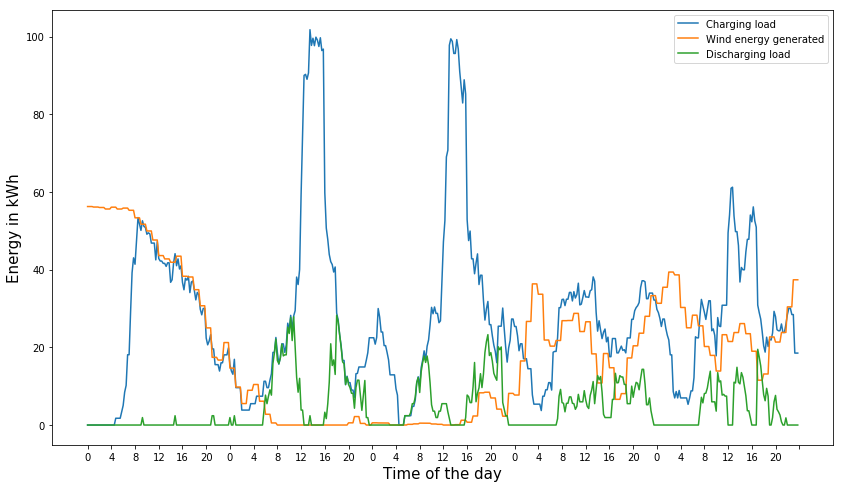

In [7]:
Simulate_biD_static(NumberOfDays=5)

### Simulate 10 scenarios for 5 days:

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 81030, 82639
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 200.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 82080, 83688
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 200.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81390, 83039
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 200.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81055, 82642
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 200.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81235, 82906
Chang

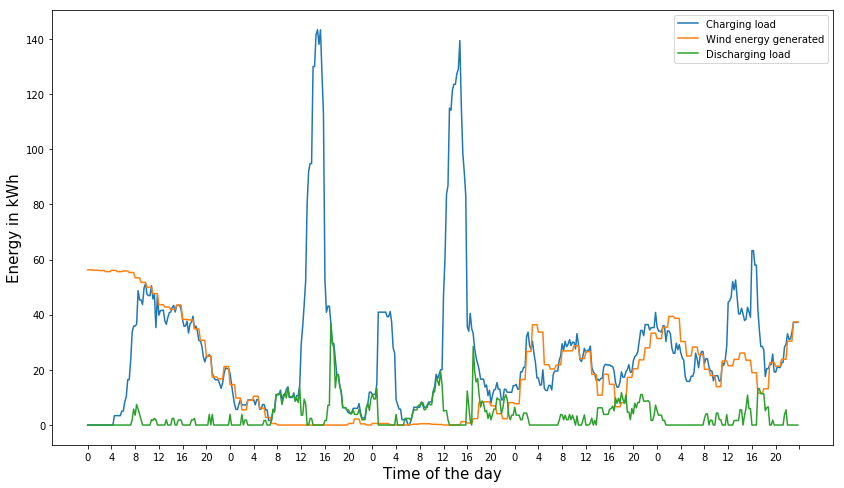

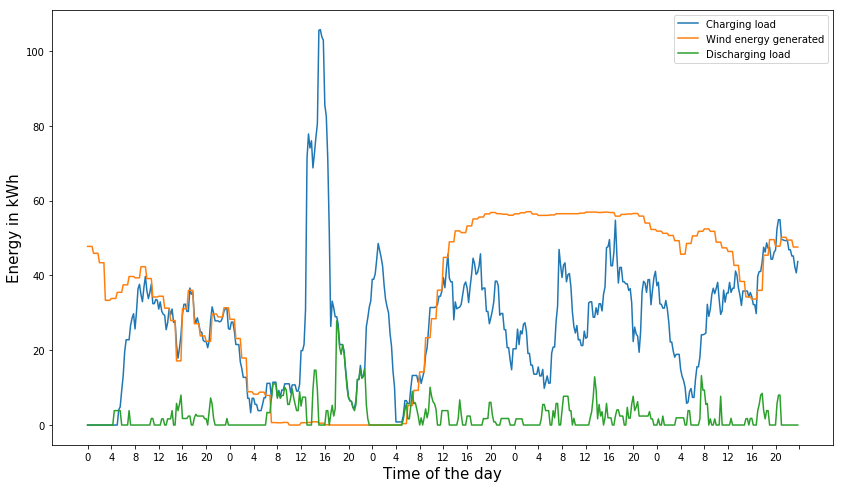

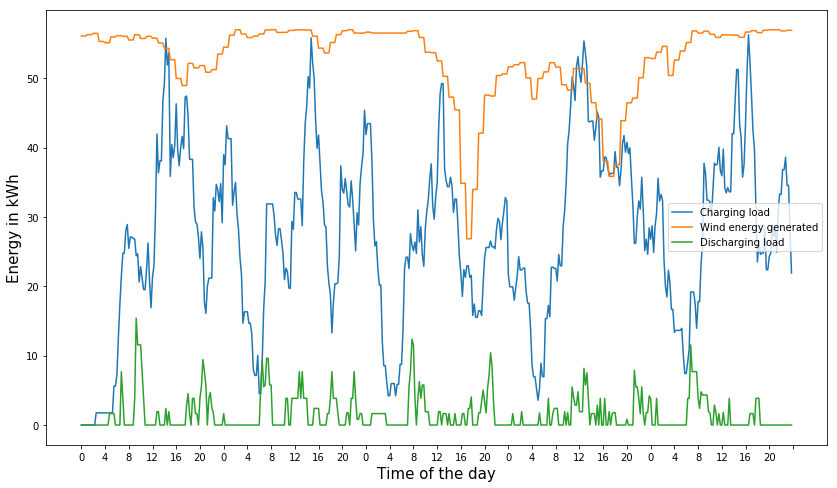

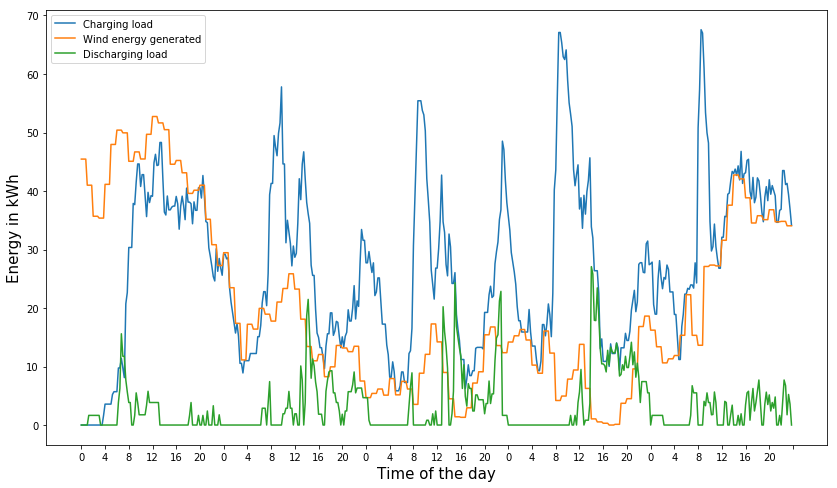

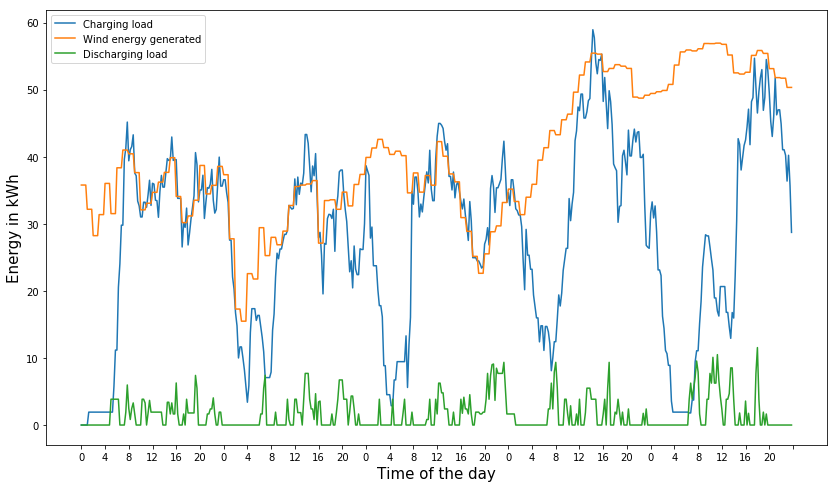

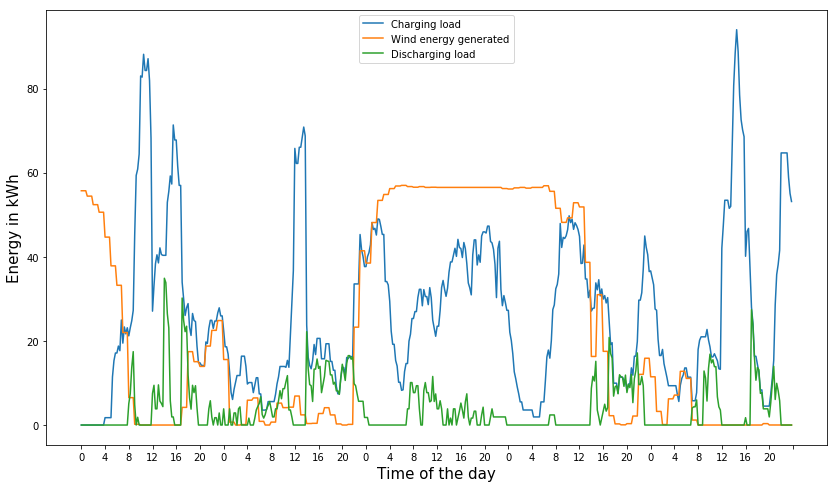

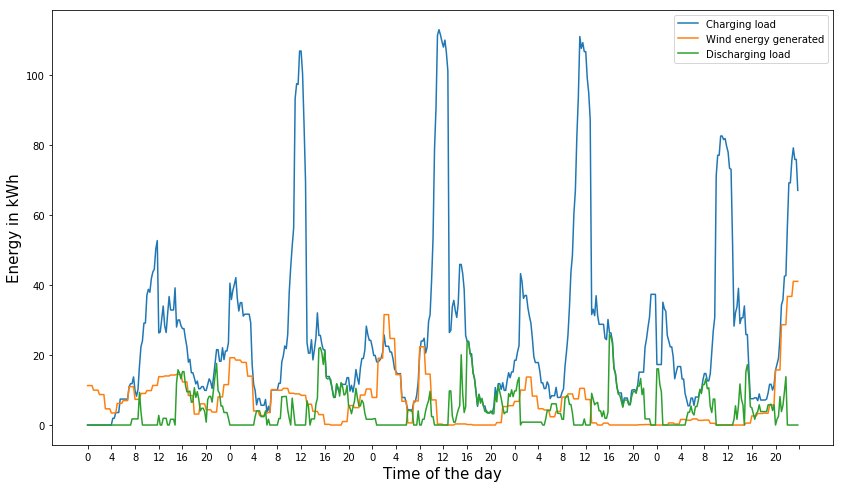

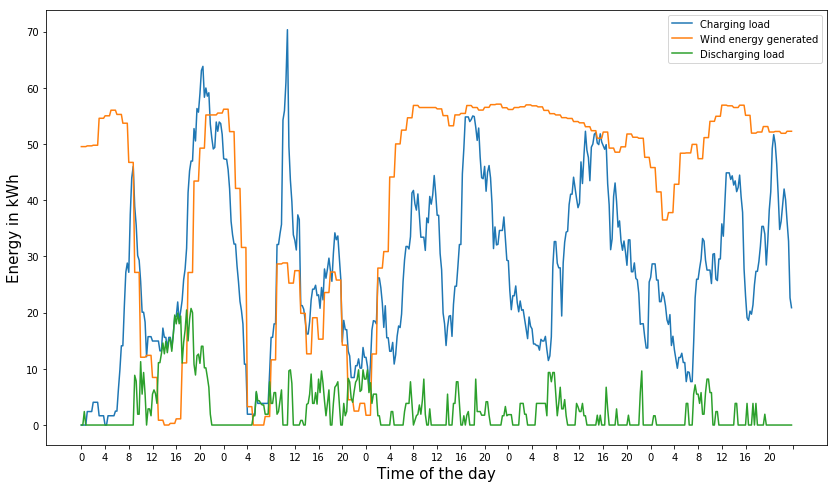

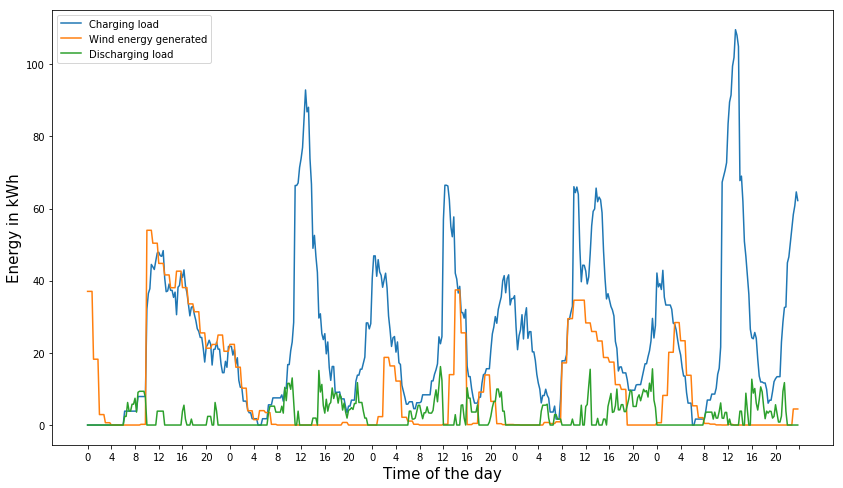

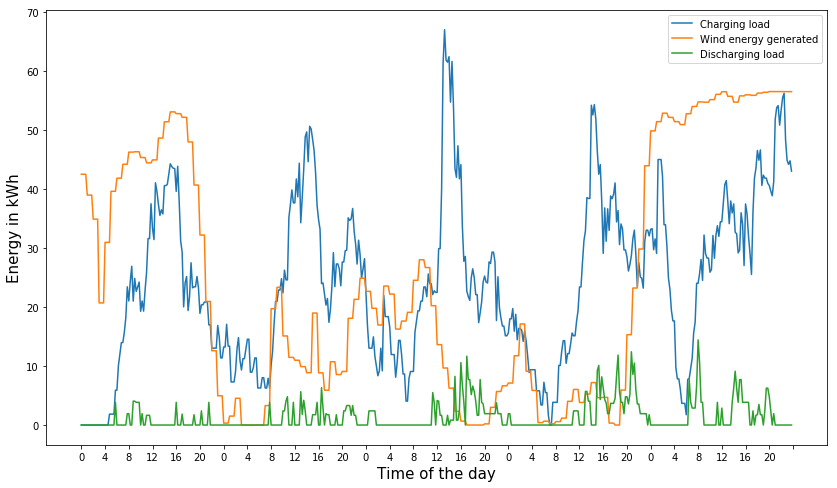

In [6]:
### I have changed delta to 0.5 here
Simulate_biD_static(low_Td=4, max_Td=12,low_dl =0.75, high_dl=0.95, S=10, gamma=1, delta=0.05, 
                       NumberOfDays=5, NumberOfVehicles=100, intervalTime=1)

In [ ]:
Simulate_biD_static(delta=0.5)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 11892, 12307
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Simulation Parameters are: 

min parking time 8
max parking time 40
number of Scenarios 1
Gamma 1
Delta 0.5
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [458.58903054259486]
exceeding consumption:  [0.3418749999999928]
Wind curtailment:  [1782.3876749946132]
Total discharge:  0     0.000
1     0.000
2     0.000
3     0.000
4     0.000
5     0.000
6     0.000
7     0.000
8     0.000
9     0.000
10    0.000
11    0.000
12    0.000
13    0.000
14    0.000
15    0.000
16    0.000
17    0.000
18    1.800
19    0.000
20    0.000
21    3.850
22    0.000
23    0.000
24    0.000
25    0.000
26    0.000
27    0.000
28    0.000
29    0.000
   

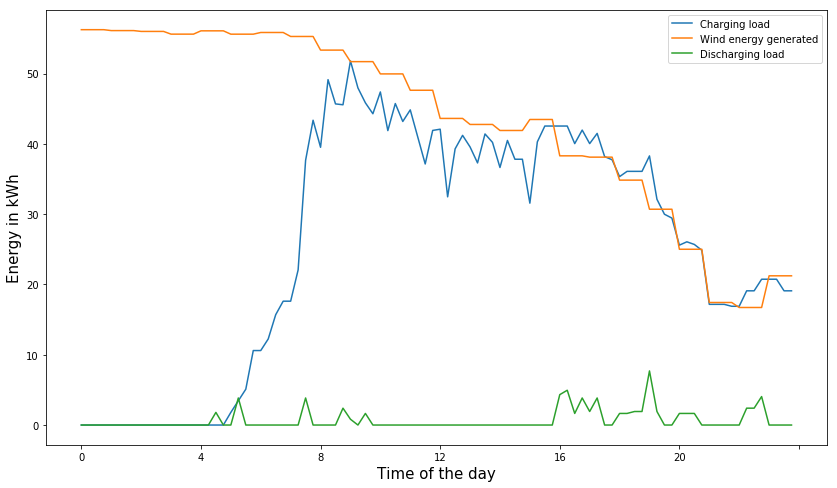

In [10]:
Simulate_biD_static(delta=0.5)

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 11892, 12307
Changed value of parameter MIPGap to 0.005
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Simulation Parameters are: 

min parking time 8
max parking time 40
number of Scenarios 1
Gamma 1
Delta 0.1
Number of Days 1
Number of Vehicles 100
Optimality True
Min desired level 0.75
Max desired level 0.95

Responses are: 

Total wind:  [4175.2708]
degradation cost:  [435.00978611605655]
exceeding consumption:  [0.0]
Wind curtailment:  [1787.220795929275]
Total discharge:  0     0.000000
1     0.000000
2     0.000000
3     0.000000
4     0.000000
5     0.000000
6     0.000000
7     0.000000
8     0.000000
9     0.000000
10    0.000000
11    0.000000
12    0.000000
13    0.000000
14    0.000000
15    0.000000
16    0.000000
17    0.000000
18    0.000000
19    1.800000
20    0.000000
21    0.000000
22    0.000000
23    0.000000
24    0.000000
25  

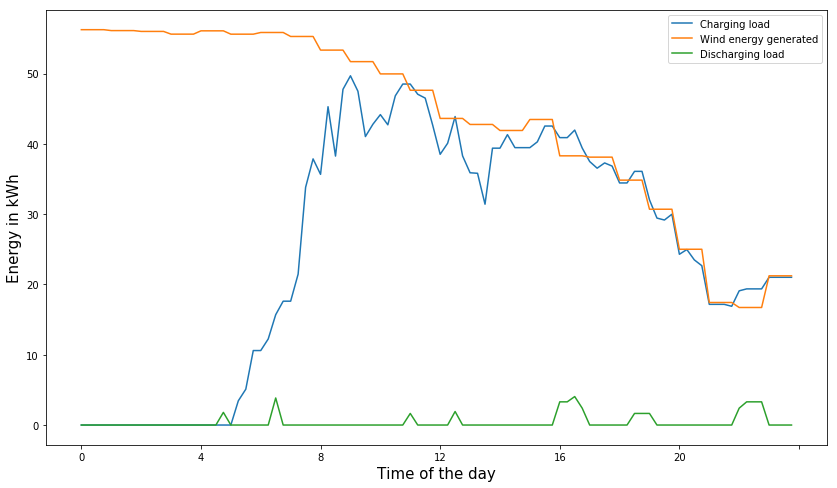

In [9]:
Simulate_biD_static(delta=0.1)

C:\Users\pouyasharifi\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 11892, 12307
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 11802, 12172
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 11682, 12101
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 12477, 12837
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 11627, 12058
C

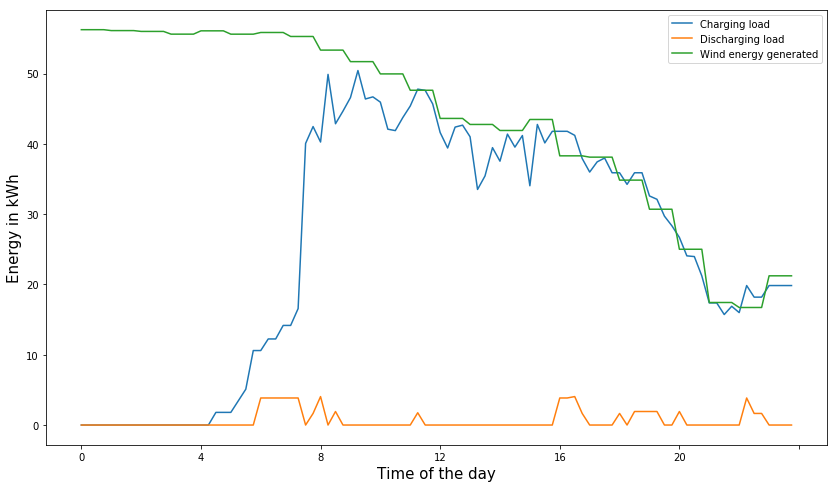

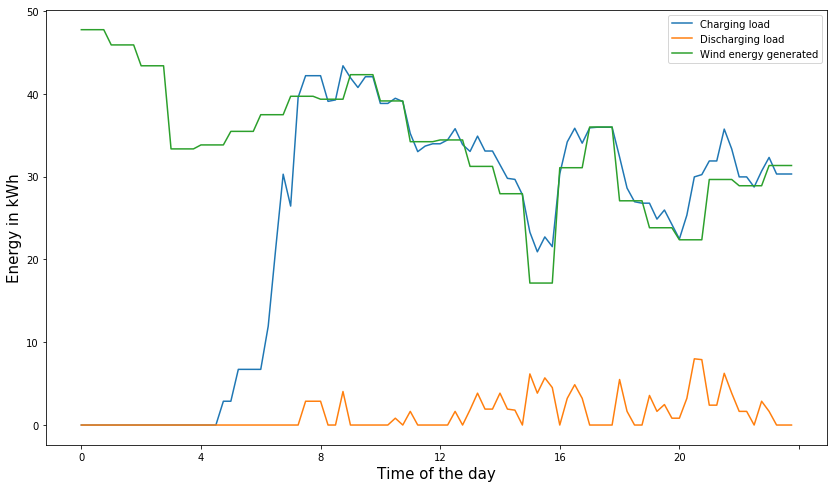

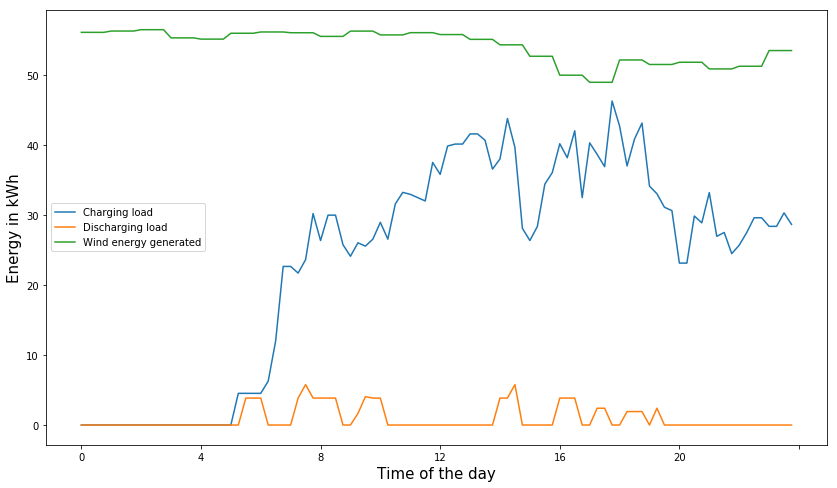

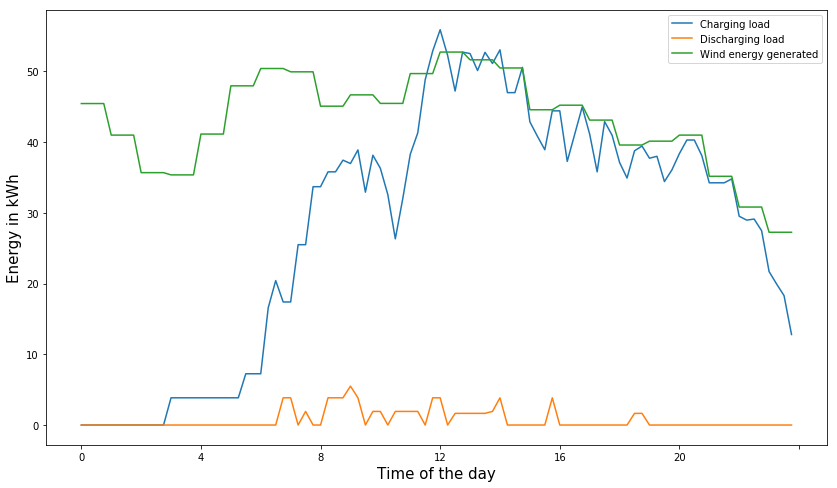

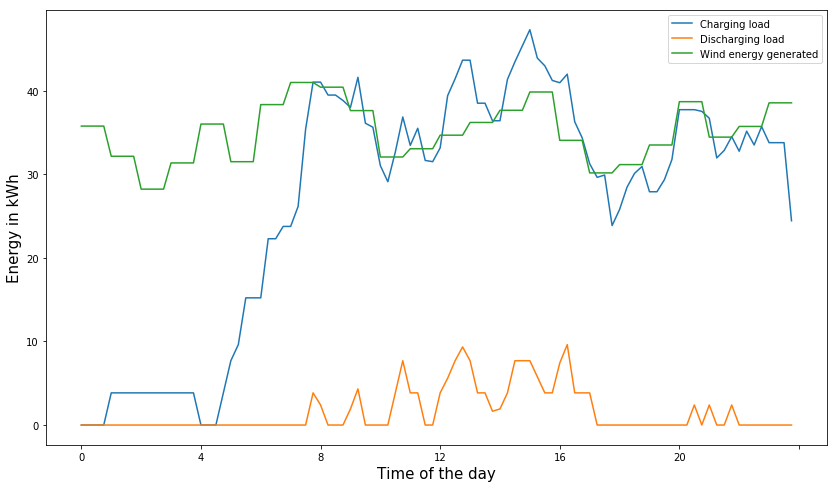

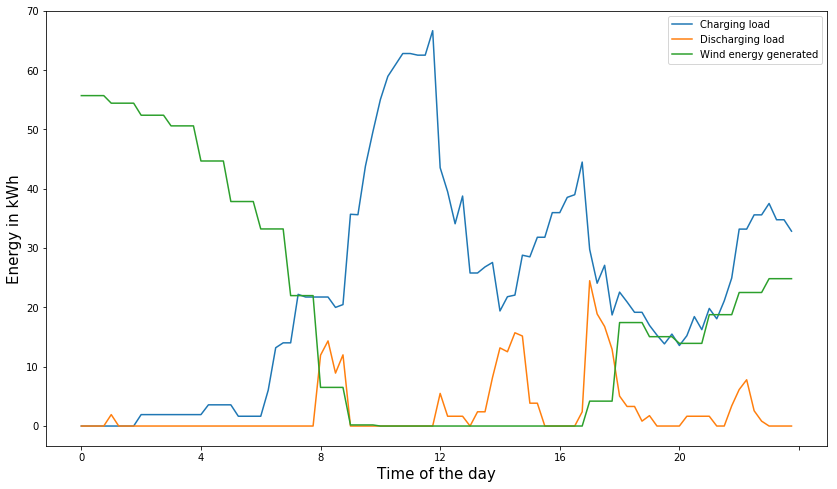

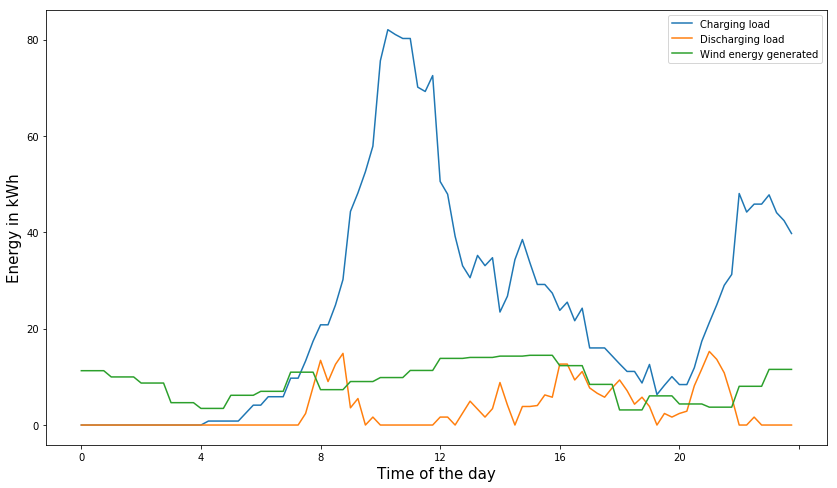

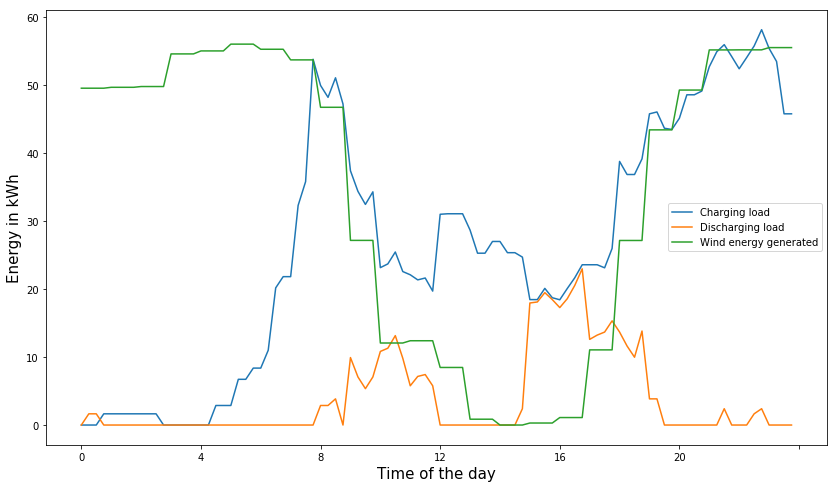

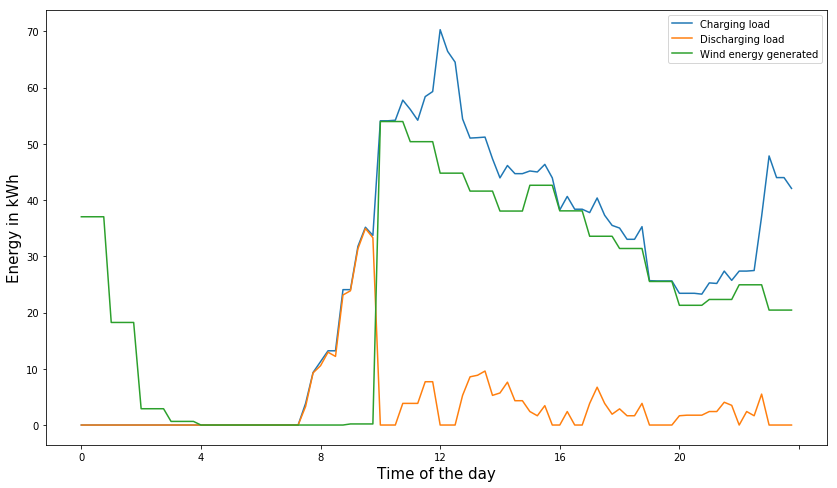

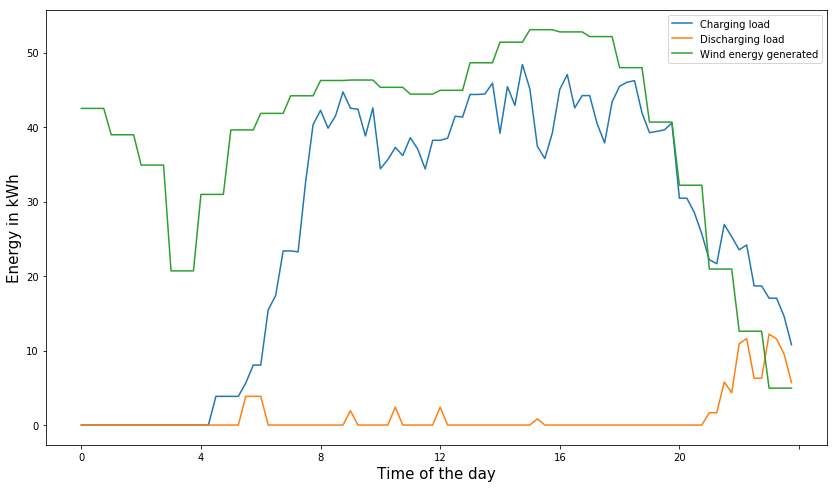

In [17]:
Simulate_bidirectional(S=10)

C:\Users\pouyasharifi\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





NumVar and NumConstr = 81030, 82639
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 82080, 83688
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81390, 83039
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81055, 82642
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100



NumVar and NumConstr = 81235, 82906
C

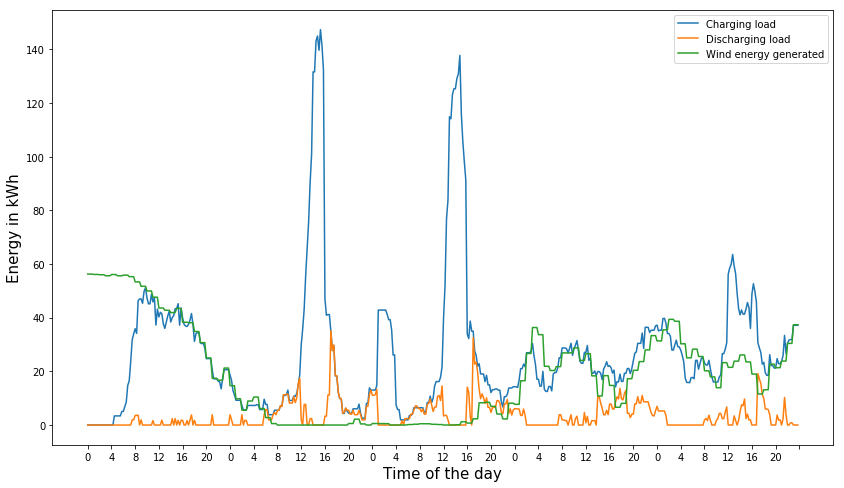

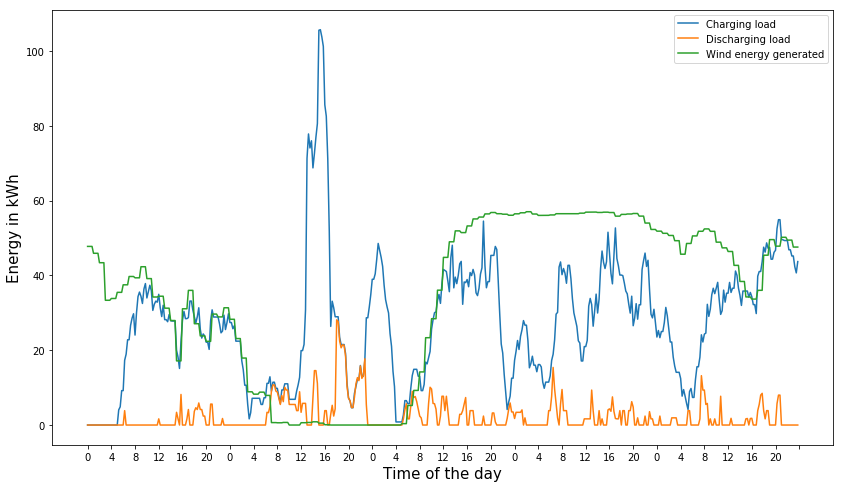

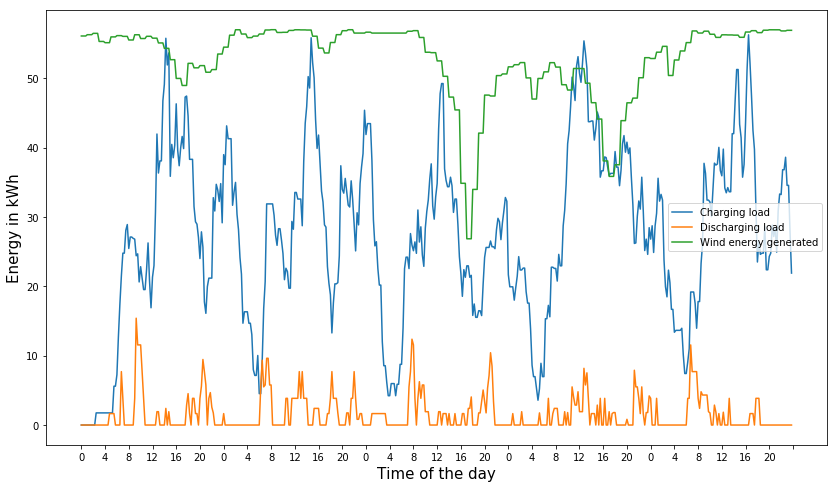

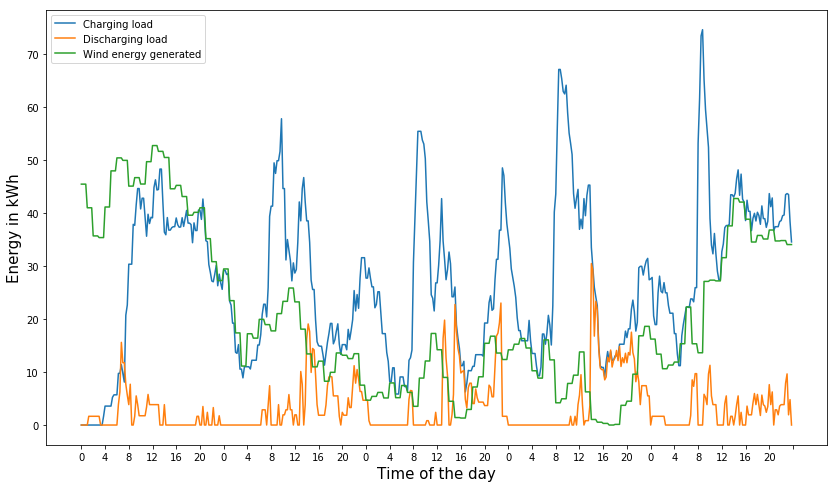

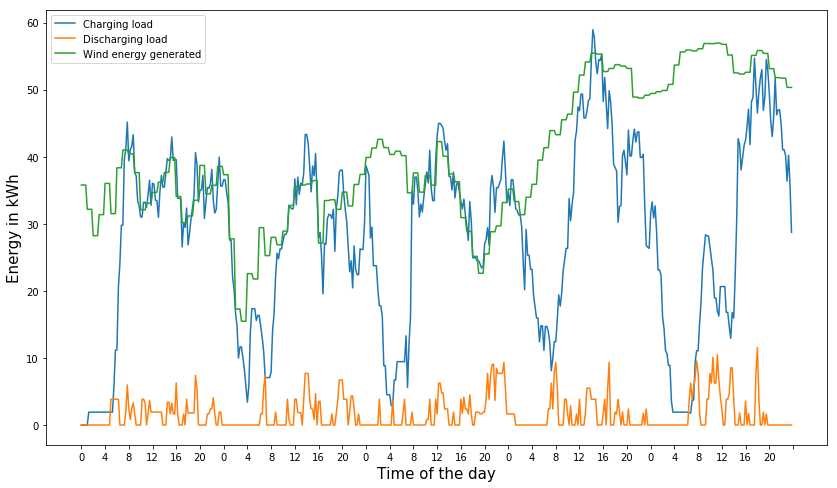

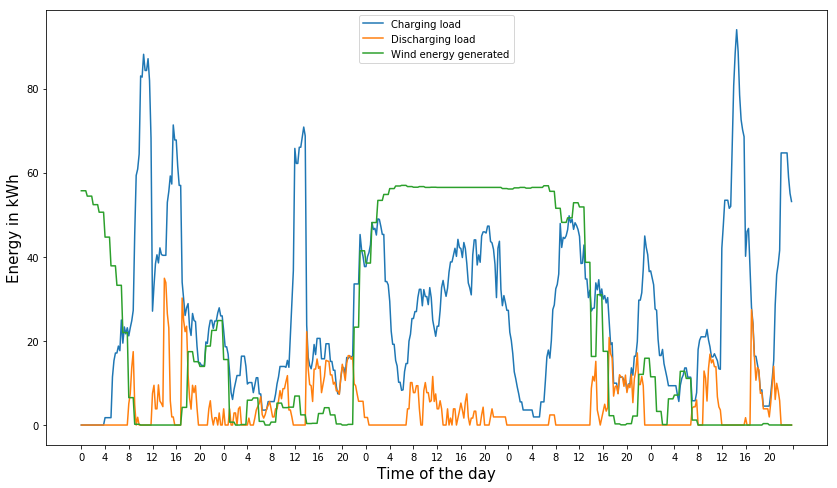

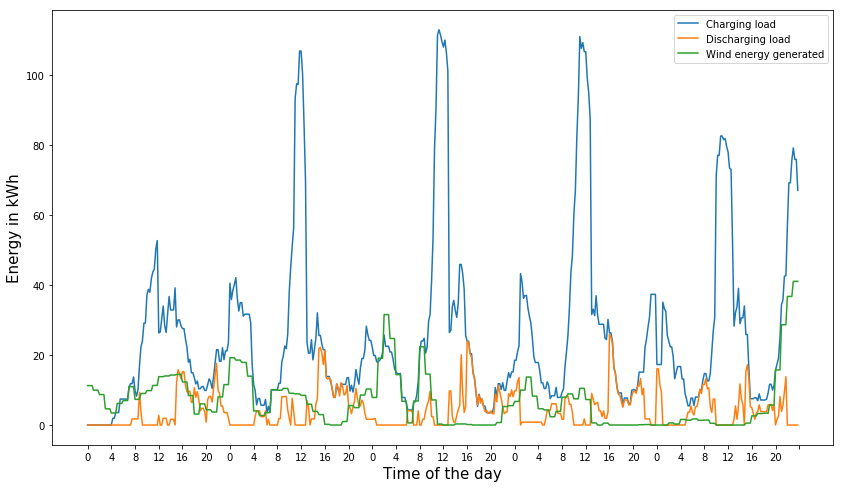

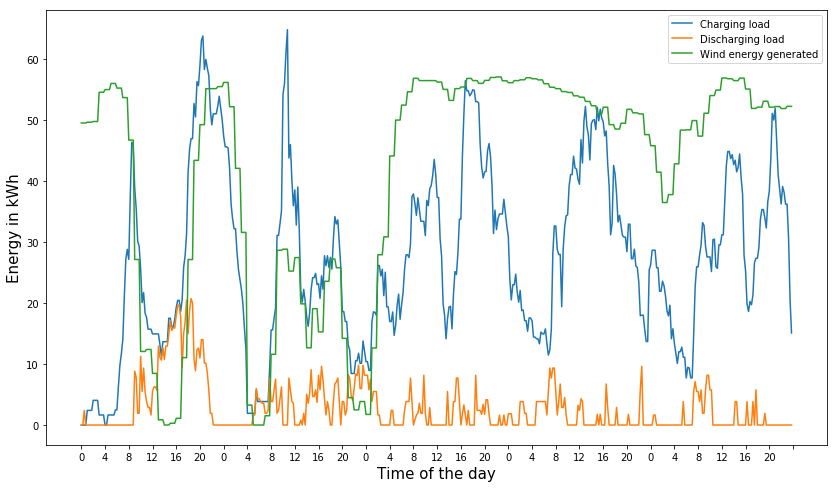

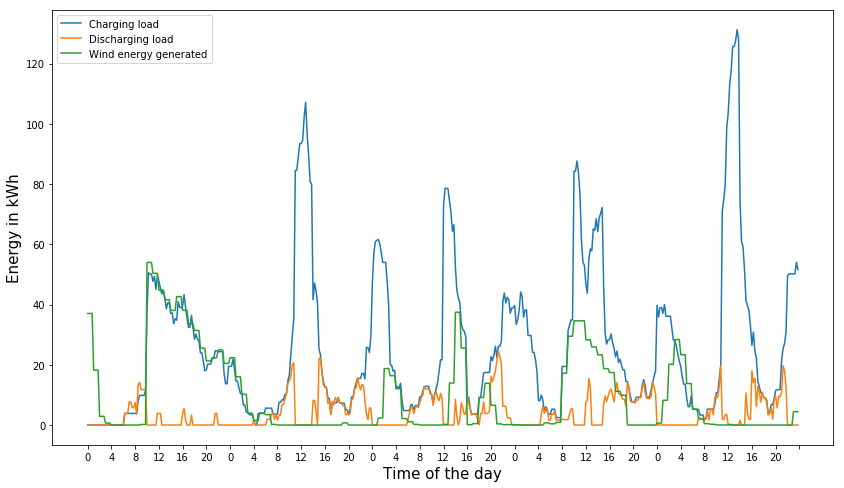

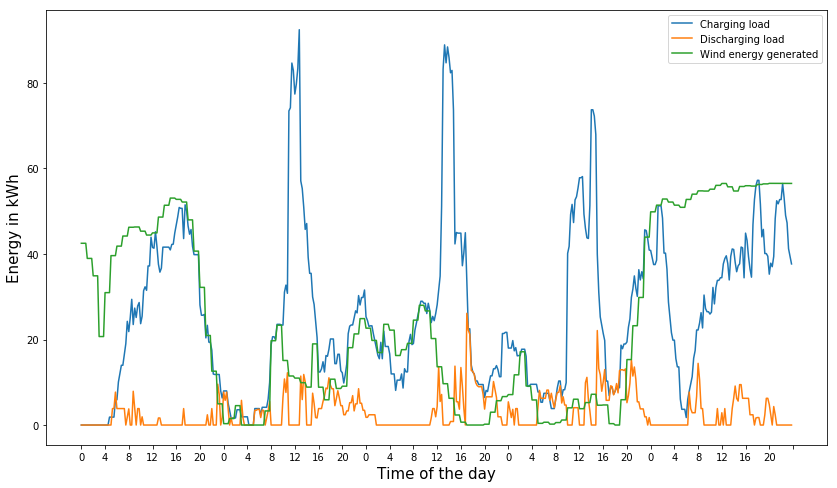

In [20]:
Simulate_bidirectional(low_Td= 4, max_Td=12, S=10, delta= 0.05, NumberOfDays=5, Optimal=True)